In [1]:
import numpy as np
import pandas as pd
import yfinance as yf
import os
import random
from pathlib import Path

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim.lr_scheduler import ReduceLROnPlateau, CosineAnnealingLR
from backtesting import build_fz_loss_matrix, run_backtest_suite, run_fz_dm_comparison_plan

from gen_seq_data import SequenceDataset
from vech import vech, unvech

from torch.utils.data import Dataset, DataLoader
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import matplotlib.pyplot as plt
plt.style.use('ggplot')

import time
from datetime import datetime
from zoneinfo import ZoneInfo
import json

device = "mps" if torch.backends.mps.is_available() else "cpu"

## Seeding and Versionierung

In [823]:
# SEEDS = [42, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

SEED = int(os.environ.get("MODEL_SEED", "42"))

DATA_AS_OF = "2026-05-03"
DATA_ID = DATA_AS_OF

AS_OF_DATE = pd.Timestamp(DATA_AS_OF)
YFINANCE_END = (AS_OF_DATE + pd.Timedelta(days=1)).strftime("%Y-%m-%d")

RUN_ID = f"asof_{DATA_AS_OF}_seed{SEED}"
RUN_TIMESTAMP = datetime.now(ZoneInfo("Europe/Berlin")).strftime("%Y-%m-%d_%H-%M-%S")

def seed_everything(seed=SEED):
    os.environ["PYTHONHASHSEED"] = str(seed)
    os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"

    random.seed(seed)
    np.random.seed(seed)

    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    torch.use_deterministic_algorithms(True, warn_only=True)

seed_everything(SEED)

project_dir = Path("/Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk")
data_dir = project_dir / "data"
output_dir = project_dir / "r/output"
run_dir = project_dir / "results" / "runs" / RUN_ID
models_dir = run_dir / "models"

data_dir.mkdir(exist_ok=True)
output_dir.mkdir(exist_ok=True)
run_dir.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

print("DATA_ID:", DATA_ID)
print("RUN_ID:", RUN_ID)
print("YFINANCE_END:", YFINANCE_END)
print("RUN_TIMESTAMP:", RUN_TIMESTAMP)
print("device:", device)

DATA_ID: 2026-05-03
RUN_ID: asof_2026-05-03_seed3
YFINANCE_END: 2026-05-04
RUN_TIMESTAMP: 2026-05-16_11-56-22
device: mps


In [824]:
from training_functions import save_model_checkpoint

RUN_METADATA = {
    "seed": SEED,
    "data_id": DATA_ID,
    "data_as_of": DATA_AS_OF,
    "run_id": RUN_ID,
    "run_timestamp": RUN_TIMESTAMP,
    "device": str(device),
}


## Price Data

In [825]:
macro_tickers = [
    "^GSPC",  # Equity (S&P 500)
    "GC=F",   # Gold
    "CL=F",   # Oil
    "^TNX"    # 10Y yield
]

macro_btc_tickers = [
    "^GSPC",
    "GC=F",
    "CL=F",
    "^TNX",
    "BTC-USD"
]

In [826]:
macro_data = yf.download(
    macro_tickers,
    start="1900-01-01",
    end=YFINANCE_END,          # yfinance end ist exklusiv
    auto_adjust=False,
    progress=False,
)

macro_btc_data = yf.download(
    macro_btc_tickers,
    start="1900-01-01",
    end=YFINANCE_END,
    auto_adjust=False,
    progress=False,
)

macro_data.to_csv(data_dir / f"macro_data_{DATA_ID}.csv")
macro_btc_data.to_csv(data_dir / f"macro_btc_data_{DATA_ID}.csv")

print("Saved:", data_dir / f"macro_data_{DATA_ID}.csv")
print("Saved:", data_dir / f"macro_btc_data_{DATA_ID}.csv")
print("macro_data last date:", macro_data.dropna(how="all").index.max())
print("macro_btc_data last date:", macro_btc_data.dropna(how="all").index.max())

Saved: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk/data/macro_data_2026-05-03.csv
Saved: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk/data/macro_btc_data_2026-05-03.csv
macro_data last date: 2026-05-01 00:00:00
macro_btc_data last date: 2026-05-03 00:00:00


In [827]:
macro_data

Price        Adj Close                                        Close  \
Ticker            CL=F         GC=F        ^GSPC   ^TNX        CL=F   
Date                                                                  
1927-12-30         NaN          NaN    17.660000    NaN         NaN   
1928-01-03         NaN          NaN    17.760000    NaN         NaN   
1928-01-04         NaN          NaN    17.719999    NaN         NaN   
1928-01-05         NaN          NaN    17.549999    NaN         NaN   
1928-01-06         NaN          NaN    17.660000    NaN         NaN   
...                ...          ...          ...    ...         ...   
2026-04-27   96.370003  4675.399902  7173.910156  4.336   96.370003   
2026-04-28   99.930000  4591.500000  7138.799805  4.354   99.930000   
2026-04-29  106.879997  4545.200195  7135.950195  4.418  106.879997   
2026-04-30  105.070000  4614.700195  7209.009766  4.390  105.070000   
2026-05-01  101.940002  4629.899902  7230.120117  4.378  101.940002   

Price                                              High               ...  \
Ticker             GC=F        ^GSPC   ^TNX        CL=F         GC=F  ...   
Date                                                                  ...   
1927-12-30          NaN    17.660000    NaN         NaN          NaN  ...   
1928-01-03          NaN    17.760000    NaN         NaN          NaN  ...   
1928-01-04          NaN    17.719999    NaN         NaN          NaN  ...   
1928-01-05          NaN    17.549999    NaN         NaN          NaN  ...   
1928-01-06          NaN    17.660000    NaN         NaN          NaN  ...   
...                 ...          ...    ...         ...          ...  ...   
2026-04-27  4675.399902  7173.910156  4.336   97.669998  4711.100098  ...   
2026-04-28  4591.500000  7138.799805  4.354  101.849998  4680.899902  ...   
2026-04-29  4545.200195  7135.950195  4.418  108.599998  4601.600098  ...   
2026-04-30  4614.700195  7209.009766  4.390  110.930000  4636.700195  ...   
2026-05-01  4629.899902  7230.120117  4.378  106.650002  4636.700195  ...   

Price               Low               Open                                   \
Ticker            ^GSPC   ^TNX        CL=F         GC=F        ^GSPC   ^TNX   
Date                                                                          
1927-12-30    17.660000    NaN         NaN          NaN    17.660000    NaN   
1928-01-03    17.760000    NaN         NaN          NaN    17.760000    NaN   
1928-01-04    17.719999    NaN         NaN          NaN    17.719999    NaN   
1928-01-05    17.549999    NaN         NaN          NaN    17.549999    NaN   
1928-01-06    17.660000    NaN         NaN          NaN    17.660000    NaN   
...                 ...    ...         ...          ...          ...    ...   
2026-04-27  7146.720215  4.310   95.599998  4707.600098  7152.720215  4.312   
2026-04-28  7115.169922  4.351   96.669998  4680.899902  7133.740234  4.371   
2026-04-29  7107.859863  4.362   99.709999  4598.600098  7131.609863  4.362   
2026-04-30  7126.149902  4.382  109.070000  4561.899902  7161.750000  4.392   
2026-05-01  7229.319824  4.342  105.139999  4636.700195  7234.540039  4.368   

Price         Volume                             
Ticker          CL=F    GC=F         ^GSPC ^TNX  
Date                                             
1927-12-30       NaN     NaN  0.000000e+00  NaN  
1928-01-03       NaN     NaN  0.000000e+00  NaN  
1928-01-04       NaN     NaN  0.000000e+00  NaN  
1928-01-05       NaN     NaN  0.000000e+00  NaN  
1928-01-06       NaN     NaN  0.000000e+00  NaN  
...              ...     ...           ...  ...  
2026-04-27  219055.0   538.0  4.783750e+09  0.0  
2026-04-28  281078.0  2660.0  4.900650e+09  0.0  
2026-04-29  318841.0   507.0  5.123100e+09  0.0  
2026-04-30  341994.0    77.0  5.723790e+09  0.0  
2026-05-01  268707.0   113.0  4.847390e+09  0.0  

[24733 rows x 24 columns]

In [828]:
close = macro_data["Close"].copy().dropna()

In [829]:
len(close)

6430

array([<Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>], dtype=object)

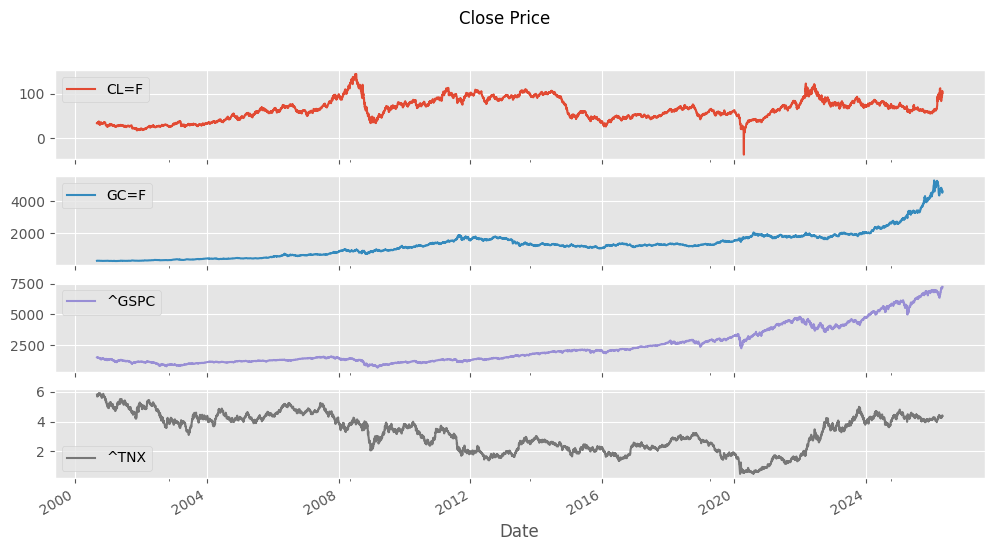

In [830]:
close.plot(title="Close Price", subplots=True, figsize=(12, 6))

/Users/bayesed/.pyenv/versions/3.13.7/lib/python3.13/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


array([<Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>], dtype=object)

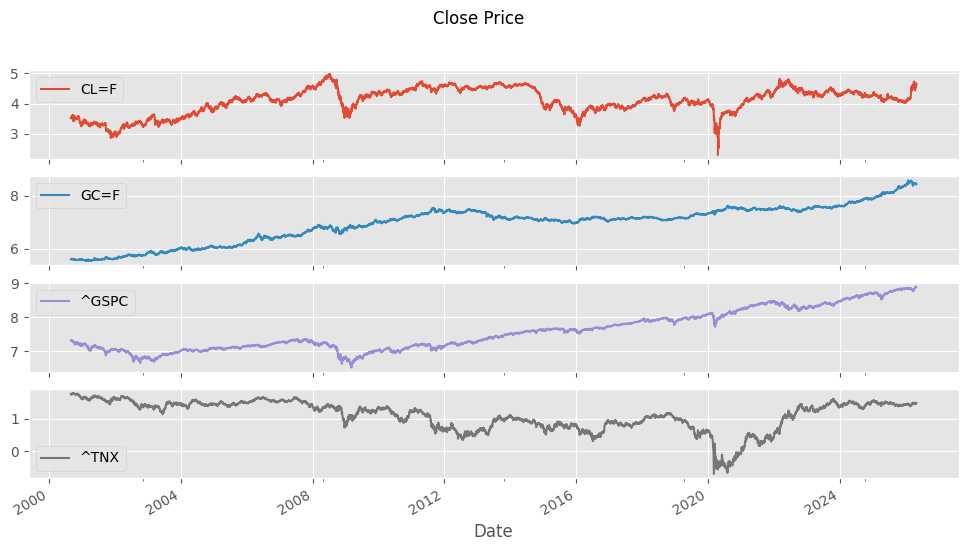

In [831]:
np.log(close).plot(title="Close Price", subplots=True, figsize=(12, 6))

In [832]:
logret = np.log(close).diff() # log(P_t) - log(P_{t-1})) = log(P_t / P_{t-1})
logret["^TNX"] = close["^TNX"].diff() # r_t(yiel) = P_t(yield) - P_{t-1}(yield)

# Aufräumen: erste Zeile NaN durch diff, ggf. weitere NaNs durch Datenlücken
logret = logret.dropna()

logret.head(), logret.tail()

/Users/bayesed/.pyenv/versions/3.13.7/lib/python3.13/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


(Ticker          CL=F      GC=F     ^GSPC   ^TNX
 Date                                           
 2000-08-31 -0.009023  0.015937  0.009993 -0.071
 2000-09-01  0.008424 -0.004682  0.002034 -0.054
 2000-09-05  0.012504 -0.004342 -0.009043  0.008
 2000-09-06  0.033458 -0.005818 -0.009889  0.029
 2000-09-07  0.010814 -0.000730  0.006852  0.037,
 Ticker          CL=F      GC=F     ^GSPC   ^TNX
 Date                                           
 2026-04-27  0.020654 -0.009981  0.001232  0.026
 2026-04-28  0.036275 -0.018108 -0.004906  0.018
 2026-04-29  0.067237 -0.010135 -0.000399  0.064
 2026-04-30 -0.017080  0.015175  0.010186 -0.028
 2026-05-01 -0.030242  0.003288  0.002924 -0.012)

In [833]:
len(logret)

6427

## Data Export

In [834]:
import os
from pathlib import Path

In [835]:
project_dir = Path("/Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk")
data_dir = project_dir / "data"
output_dir = project_dir / "r/output"

data_dir.mkdir(exist_ok=True)
output_dir.mkdir(exist_ok=True)

In [836]:
# Versionierte Datensplits nicht loeschen.
# Dateien werden ueber DATA_ID eindeutig benannt.

In [837]:
logret

Ticker,CL=F,GC=F,^GSPC,^TNX
Date,,,,
2000-08-31,-0.009023,0.015937,0.009993,-0.071
2000-09-01,0.008424,-0.004682,0.002034,-0.054
2000-09-05,0.012504,-0.004342,-0.009043,0.008
2000-09-06,0.033458,-0.005818,-0.009889,0.029
2000-09-07,0.010814,-0.000730,0.006852,0.037
...,...,...,...,...
2026-04-27,0.020654,-0.009981,0.001232,0.026
2026-04-28,0.036275,-0.018108,-0.004906,0.018
2026-04-29,0.067237,-0.010135,-0.000399,0.064


array([<Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>], dtype=object)

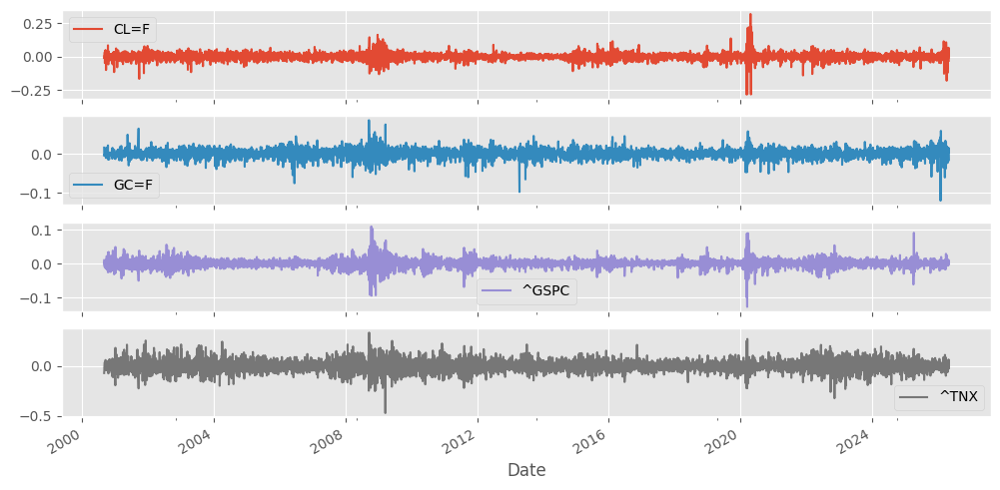

In [838]:
logret.plot(subplots=True, figsize=(12, 6))

array([[<Axes: title={'center': 'CL=F'}>,
        <Axes: title={'center': 'GC=F'}>],
       [<Axes: title={'center': '^GSPC'}>,
        <Axes: title={'center': '^TNX'}>]], dtype=object)

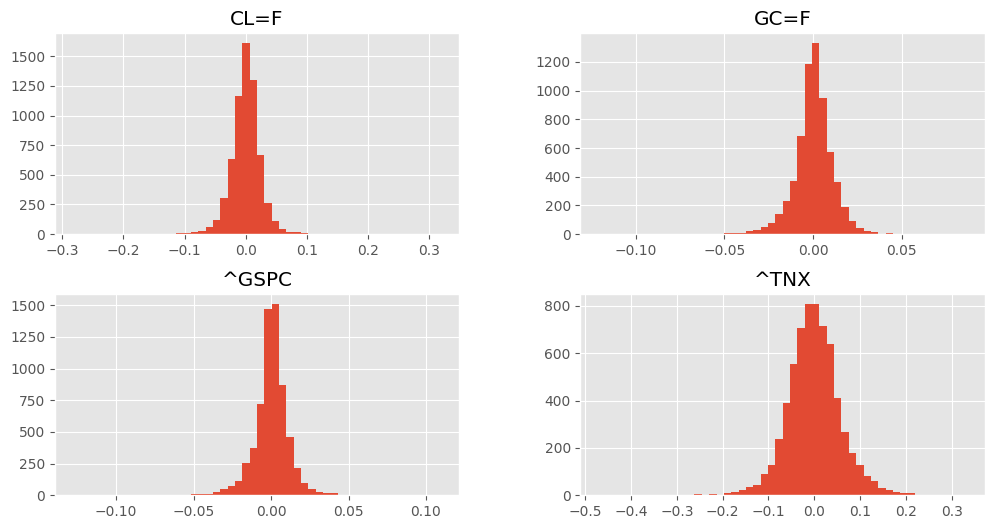

In [839]:
logret.hist(bins=50, figsize=(12, 6))

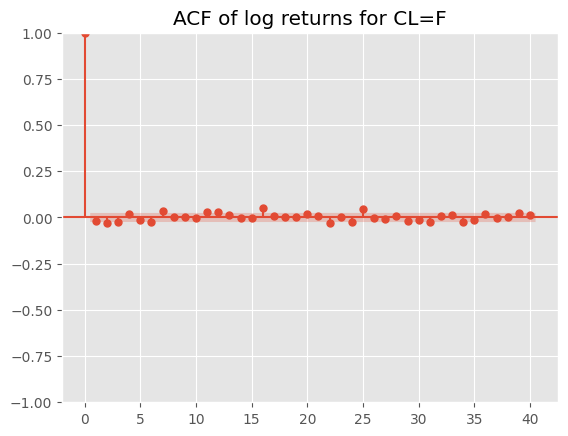

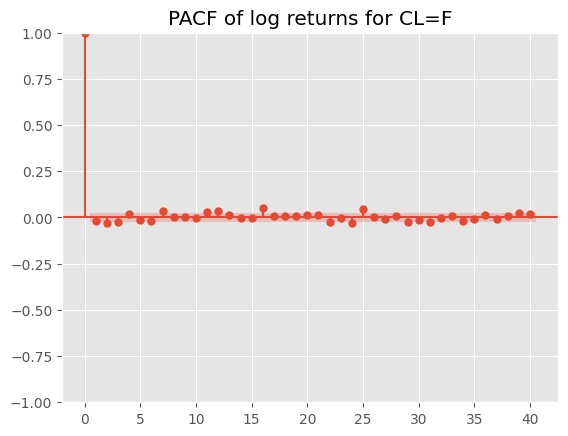

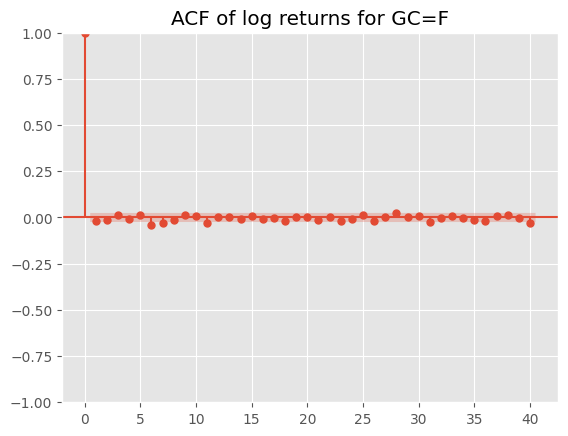

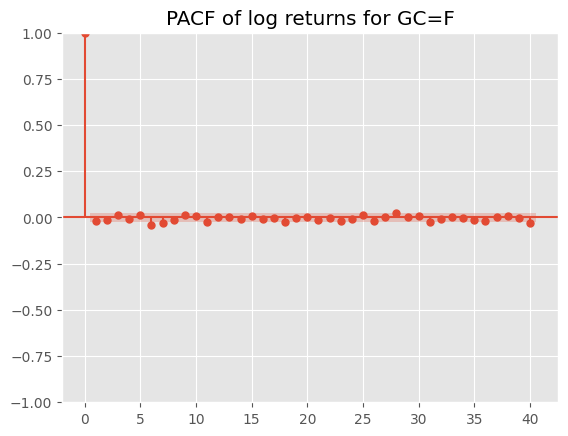

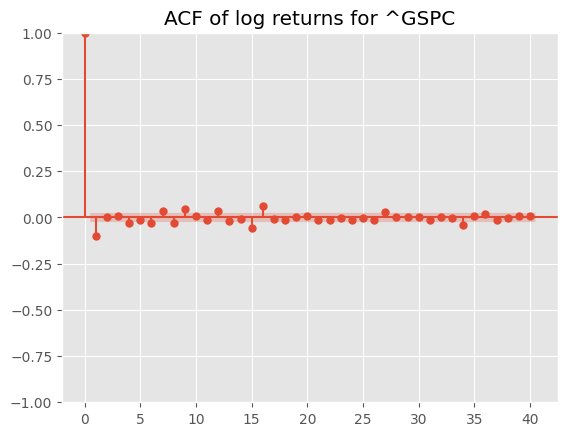

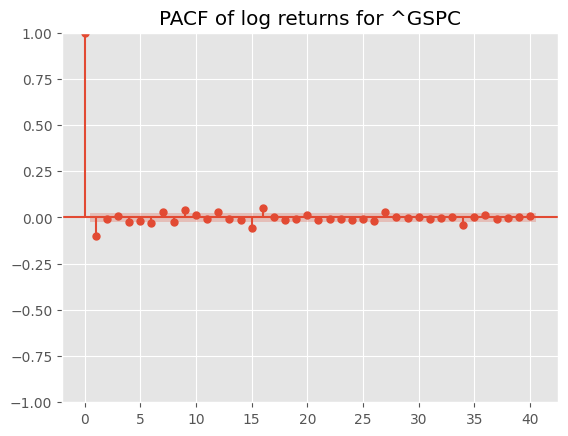

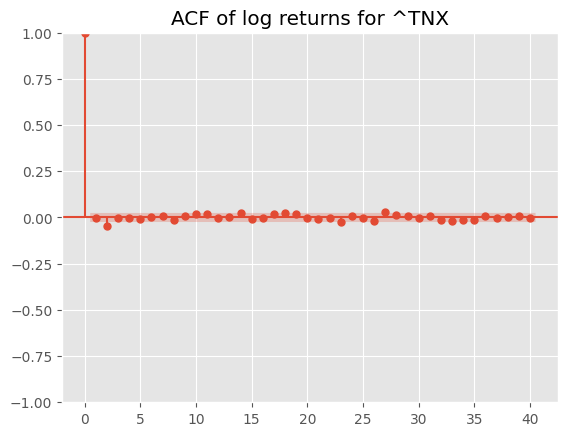

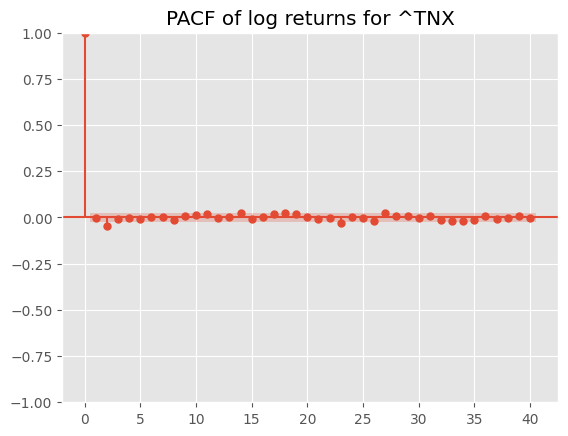

In [840]:
for col in logret.columns:
    plot_acf(logret[col], lags=40, title=f"ACF of log returns for {col}")
    plot_pacf(logret[col], lags=40, title=f"PACF of log returns for {col}")

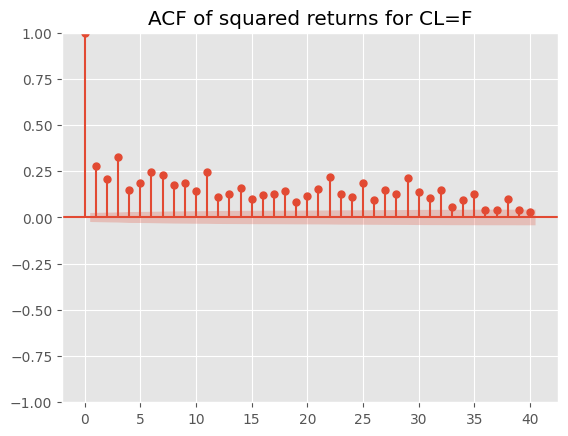

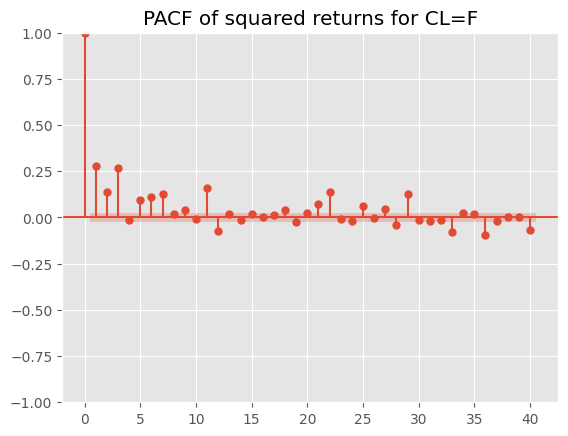

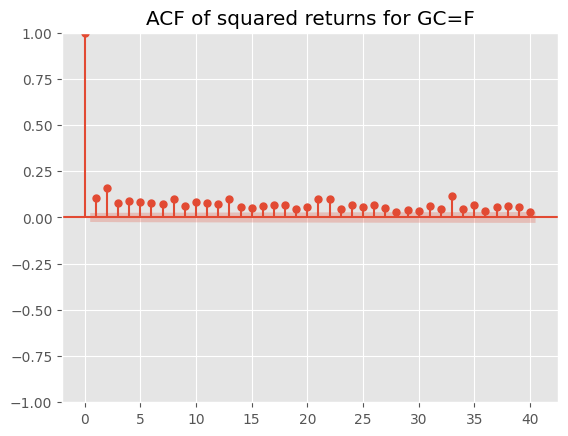

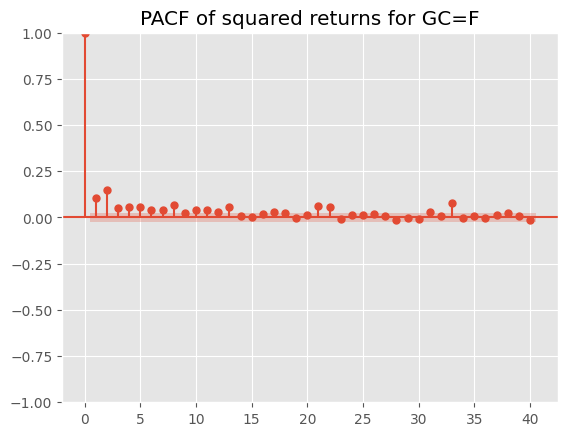

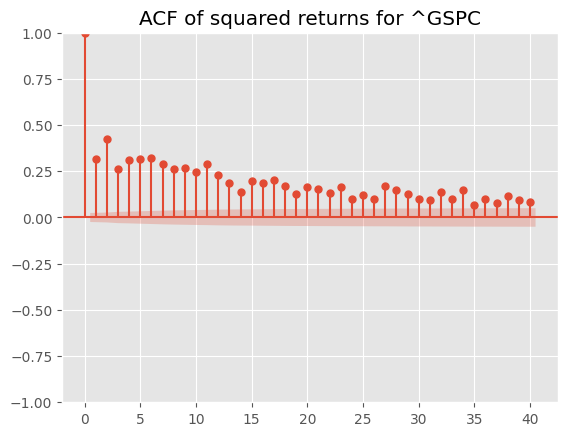

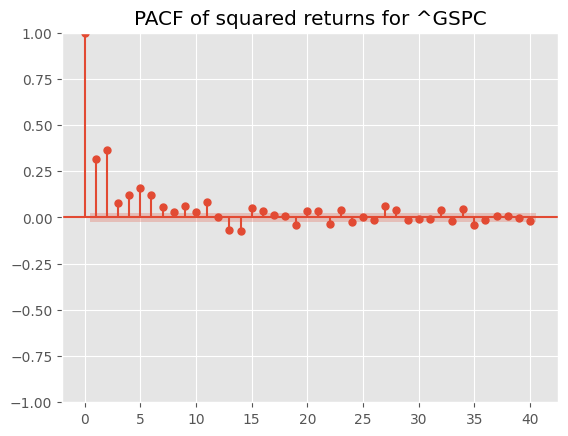

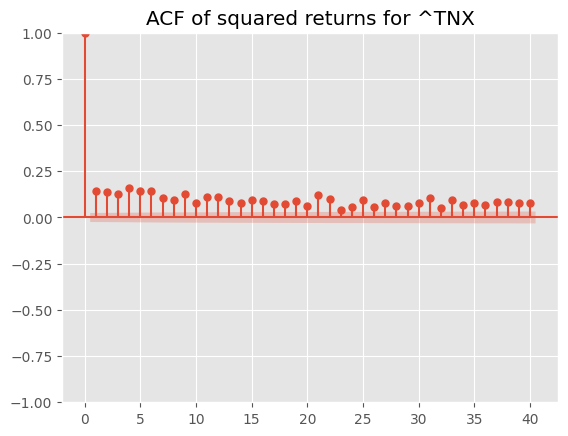

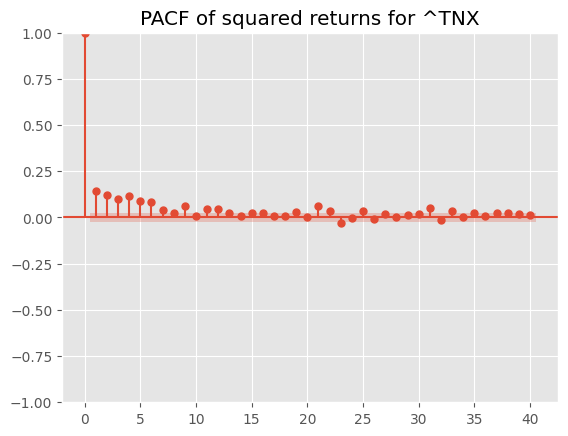

In [841]:
# squared returns
for col in logret.columns:
    plot_acf(logret[col]**2, lags=40, title=f"ACF of squared returns for {col}")
    plot_pacf(logret[col]**2, lags=40, title=f"PACF of squared returns for {col}")

In [842]:
from statsmodels.tsa.stattools import adfuller

for col in logret.columns:
    print(f"ADF test for {col}:")
    result = adfuller(logret[col])
    print(f"ADF statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    print("---")
    

ADF test for CL=F:
ADF statistic: -14.465949677957282
p-value: 6.726729205367933e-27
---
ADF test for GC=F:
ADF statistic: -32.07690639464391
p-value: 0.0
---
ADF test for ^GSPC:
ADF statistic: -19.93349880367434
p-value: 0.0
---
ADF test for ^TNX:
ADF statistic: -59.5675406291611
p-value: 0.0
---


In [843]:
#feature_cols = macro_tickers.split(" ")

In [844]:
macro_tickers

['^GSPC', 'GC=F', 'CL=F', '^TNX']

In [845]:
R = logret[macro_tickers].values.astype(np.float32)   # (N,d)

# Outer products pro t: (N,d,1) * (N,1,d) -> (N,d,d)
U = R[:, :, None] * R[:, None, :]

In [846]:
cross_returns = vech(torch.tensor(U))
cross_returns.shape

torch.Size([6427, 10])

In [847]:
logret.shape

(6427, 4)

In [848]:
input_data = np.concatenate([logret[macro_tickers].values, cross_returns], axis=1)
input_df = pd.DataFrame(input_data, columns=macro_tickers + [f"cross_{i+1}" for i in range(cross_returns.shape[1])])

In [849]:
logret.index

DatetimeIndex(['2000-08-31', '2000-09-01', '2000-09-05', '2000-09-06',
               '2000-09-07', '2000-09-08', '2000-09-11', '2000-09-12',
               '2000-09-13', '2000-09-14',
               ...
               '2026-04-20', '2026-04-21', '2026-04-22', '2026-04-23',
               '2026-04-24', '2026-04-27', '2026-04-28', '2026-04-29',
               '2026-04-30', '2026-05-01'],
              dtype='datetime64[ns]', name='Date', length=6427, freq=None)

In [850]:
input_df.index = logret.index

In [851]:
input_df

,^GSPC,GC=F,CL=F,^TNX,cross_1,cross_2,cross_3,cross_4,cross_5,cross_6,cross_7,cross_8,cross_9,cross_10
Date,,,,,,,,,,,,,,
2000-08-31,0.009993,0.015937,-0.009023,-0.071,9.985256e-05,0.000159,-0.000090,-0.000709,2.539743e-04,-0.000144,-0.001131,0.000081,0.000641,0.005041
2000-09-01,0.002034,-0.004682,0.008424,-0.054,4.136790e-06,-0.000010,0.000017,-0.000110,2.192223e-05,-0.000039,0.000253,0.000071,-0.000455,0.002916
2000-09-05,-0.009043,-0.004342,0.012504,0.008,8.177266e-05,0.000039,-0.000113,-0.000072,1.884936e-05,-0.000054,-0.000035,0.000156,0.000100,0.000064
2000-09-06,-0.009889,-0.005818,0.033458,0.029,9.779087e-05,0.000058,-0.000331,-0.000287,3.385040e-05,-0.000195,-0.000169,0.001119,0.000970,0.000841
2000-09-07,0.006852,-0.000730,0.010814,0.037,4.694992e-05,-0.000005,0.000074,0.000254,5.324698e-07,-0.000008,-0.000027,0.000117,0.000400,0.001369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2026-04-27,0.001232,-0.009981,0.020654,0.026,1.516883e-06,-0.000012,0.000025,0.000032,9.962491e-05,-0.000206,-0.000260,0.000427,0.000537,0.000676
2026-04-28,-0.004906,-0.018108,0.036275,0.018,2.407068e-05,0.000089,-0.000178,-0.000088,3.278972e-04,-0.000657,-0.000326,0.001316,0.000653,0.000324
2026-04-29,-0.000399,-0.010135,0.067237,0.064,1.594019e-07,0.000004,-0.000027,-0.000026,1.027181e-04,-0.000681,-0.000649,0.004521,0.004303,0.004096


In [852]:
cross_df = pd.DataFrame(cross_returns, columns=[f"cross_{i+1}" for i in range(cross_returns.shape[1])])

In [853]:
cross_df

,cross_1,cross_2,cross_3,cross_4,cross_5,cross_6,cross_7,cross_8,cross_9,cross_10
0,9.985256e-05,0.000159,-0.000090,-0.000709,2.539743e-04,-0.000144,-0.001131,0.000081,0.000641,0.005041
1,4.136790e-06,-0.000010,0.000017,-0.000110,2.192223e-05,-0.000039,0.000253,0.000071,-0.000455,0.002916
2,8.177266e-05,0.000039,-0.000113,-0.000072,1.884936e-05,-0.000054,-0.000035,0.000156,0.000100,0.000064
3,9.779087e-05,0.000058,-0.000331,-0.000287,3.385040e-05,-0.000195,-0.000169,0.001119,0.000970,0.000841
4,4.694992e-05,-0.000005,0.000074,0.000254,5.324698e-07,-0.000008,-0.000027,0.000117,0.000400,0.001369
...,...,...,...,...,...,...,...,...,...,...
6422,1.516883e-06,-0.000012,0.000025,0.000032,9.962491e-05,-0.000206,-0.000260,0.000427,0.000537,0.000676
6423,2.407068e-05,0.000089,-0.000178,-0.000088,3.278972e-04,-0.000657,-0.000326,0.001316,0.000653,0.000324
6424,1.594019e-07,0.000004,-0.000027,-0.000026,1.027181e-04,-0.000681,-0.000649,0.004521,0.004303,0.004096
6425,1.037583e-04,0.000155,-0.000174,-0.000285,2.302845e-04,-0.000259,-0.000425,0.000292,0.000478,0.000784


In [ ]:
def train_val_test_split(df, train_size=0.7, val_size=0.15):
    n = len(df)
    train_end = int(n * train_size)
    val_end = int(n * (train_size + val_size))
    
    train_df = df.iloc[:train_end]
    val_df = df.iloc[train_end:val_end]
    test_df = df.iloc[val_end:]
    
    return train_df, val_df, test_df

In [855]:
train_df, val_df, test_df = train_val_test_split(input_df)

In [856]:
train_df.index.name

'Date'

In [857]:
import datetime

In [858]:
exports = {
    "close": close[macro_tickers],
    "logret": logret[macro_tickers],
    "train_df": train_df[macro_tickers],
    "val_df": val_df[macro_tickers],
    "test_df": test_df[macro_tickers],
}

for name, df_export in exports.items():
    df_export = df_export.copy()
    df_export.index.name = "Date"
    df_export.to_csv(data_dir / f"{name}_{DATA_ID}.csv")

print(f"Exportiert mit DATA_ID: {DATA_ID}")
print(f"RUN_ID fuer Modellergebnisse: {RUN_ID}")


Exportiert mit DATA_ID: 2026-05-03
RUN_ID fuer Modellergebnisse: asof_2026-05-03_seed3


## Vola

Wir modellieren nun
$\mathbf r_{t+1}\mid\mathcal F_t \sim \mathcal N(\mathbf 0, \Sigma_{t+1}),$
und lassen das LSTM direkt eine gueltige Kovarianzmatrix $\Sigma_{t+1}$ ausgeben.

Dazu parametrisieren wir $\Sigma_{t+1} = L_{t+1}L_{t+1}^\top$ mit einer unteren Dreiecksmatrix $L_{t+1}$ (Cholesky-Form).
Die Diagonale von $L_{t+1}$ wird mit `softplus` strikt positiv gemacht.


In [859]:
#feature_cols = tickers.split(" ")
mu = train_df.mean()
sigma = train_df.std() # vielleicht nicht durch die Std teilen

def normalize(df, mu, sigma, with_std=True):
    if with_std:
        return (df - mu) / sigma
    else:
        return df - mu

## Hyper Paramters

In [860]:
lookback = 40
batchsize = 64
hidden_size = 64
dropout = 0.1
lr = 3e-4
bekk_lr = 1e-4
bekk_mix_lr = 5e-5
neural_bekk_lr = 1e-4
bekk_jitter = 1e-4
bekk_device = "cpu"
early_stopping_patience = 50
early_stopping_min_delta = 1e-4

## Data Loader

In [861]:
def make_generator(seed):
    g = torch.Generator()
    g.manual_seed(seed)
    return g

In [862]:
train_norm = normalize(train_df, mu, sigma, with_std=True)
val_norm = normalize(val_df, mu, sigma, with_std=True)
test_norm = normalize(test_df, mu, sigma, with_std=True)

vol_train_ds = SequenceDataset(
    train_norm.values,
    train_norm[macro_tickers].values,
    lookback,
)
vol_val_ds = SequenceDataset(
    val_norm.values,
    val_norm[macro_tickers].values,
    lookback,
)
vol_test_ds = SequenceDataset(
    test_norm.values,
    test_norm[macro_tickers].values,
    lookback,
)

vol_train_loader = DataLoader(vol_train_ds, batch_size=batchsize, shuffle=True, generator=make_generator(SEED))
vol_val_loader = DataLoader(vol_val_ds, batch_size=batchsize, shuffle=False)
vol_test_loader = DataLoader(vol_test_ds, batch_size=batchsize, shuffle=False)


In [863]:
len(vol_train_ds), len(vol_val_ds), len(vol_test_ds)

(4458, 924, 925)

```train_cov```ggf. zur Initialisierung nutzen. 

In [864]:
train_cov = torch.cov(torch.tensor(train_norm[macro_tickers].values, dtype=torch.float32,).T)  # sample / long-term covariance from training data
train_cov

tensor([[ 1.0000, -0.0332,  0.2122,  0.3630],
        [-0.0332,  1.0000,  0.2231, -0.1267],
        [ 0.2122,  0.2231,  1.0000,  0.1834],
        [ 0.3630, -0.1267,  0.1834,  1.0000]])

In [865]:
from LSTMCovariance import LSTMCovariance
from training_functions import train_covariance_model, gaussian_nll, student_nll

In [866]:
seed_everything(SEED)

k = len(macro_tickers)*(len(macro_tickers)+1)//2 # Anzahl an Cross Returns, die zusätzlich zu den normalen Returns als Input-Features für die Kovarianzmodellierung genutzt werden

cov_model = LSTMCovariance(input_size=(len(macro_tickers)+k), n_assets=len(macro_tickers), hidden_size=hidden_size, num_layers=2, dropout=dropout)
cov_model, hist = train_covariance_model(
    cov_model,
    vol_train_loader,
    vol_val_loader,
    epochs=500,
    lr=lr,
    plateau_patience=20,
    device=device,
    scheduler_type="cosine",  # oder "cosine"
    early_stopping_patience=early_stopping_patience,
    early_stopping_min_delta=early_stopping_min_delta,
)

save_model_checkpoint(
    model_name="lstm_normal",
    models_dir=models_dir,
    model=cov_model,
    history=hist,
    run_metadata=RUN_METADATA,
    loss_fn=None,
    config={
        "model_class": "LSTMCovariance",
        "distribution": "gaussian",
        "input_size": len(macro_tickers) + k,
        "n_assets": len(macro_tickers),
        "hidden_size": hidden_size,
        "num_layers": 2,
        "dropout": dropout,
        "lookback": lookback,
        "batchsize": batchsize,
        "epochs": 500,
        "lr": lr,
        "scheduler_type": "cosine",
        "early_stopping_patience": early_stopping_patience,
        "early_stopping_min_delta": early_stopping_min_delta,
    },
)

Epoch 001 | train NLL 5.901883 | val NLL 6.640447 | lr 3.00e-04
Epoch 002 | train NLL 5.252385 | val NLL 5.825676 | lr 3.00e-04
Epoch 003 | train NLL 5.073632 | val NLL 5.688973 | lr 3.00e-04
Epoch 004 | train NLL 5.001608 | val NLL 5.624952 | lr 3.00e-04
Epoch 005 | train NLL 4.948111 | val NLL 5.585874 | lr 3.00e-04
Epoch 006 | train NLL 4.927175 | val NLL 5.548446 | lr 3.00e-04
Epoch 007 | train NLL 4.898384 | val NLL 5.614731 | lr 3.00e-04
Epoch 008 | train NLL 4.884777 | val NLL 5.536909 | lr 3.00e-04
Epoch 009 | train NLL 4.863326 | val NLL 5.590044 | lr 3.00e-04
Epoch 010 | train NLL 4.842250 | val NLL 5.509603 | lr 3.00e-04
Epoch 011 | train NLL 4.824916 | val NLL 5.680097 | lr 3.00e-04
Epoch 012 | train NLL 4.810598 | val NLL 5.603802 | lr 3.00e-04
Epoch 013 | train NLL 4.798910 | val NLL 5.583082 | lr 3.00e-04
Epoch 014 | train NLL 4.788373 | val NLL 5.577784 | lr 2.99e-04
Epoch 015 | train NLL 4.771210 | val NLL 5.531179 | lr 2.99e-04
Epoch 016 | train NLL 4.766967 | val NLL

In [867]:
from plots import plot_loss

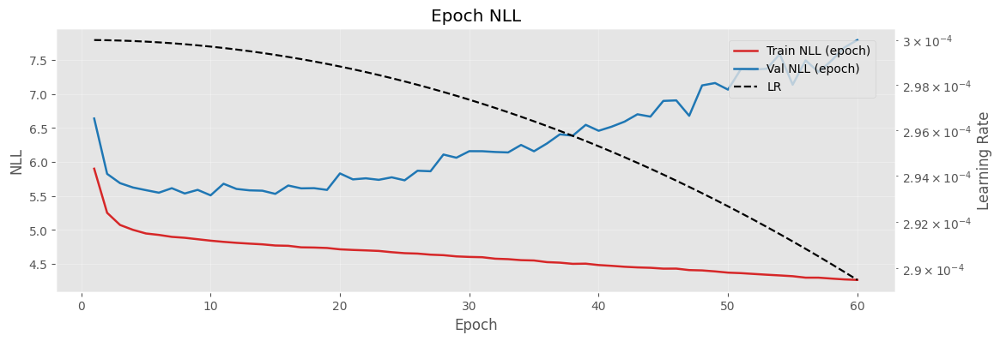

In [868]:
plot_loss(hist)

In [869]:
sigma

^GSPC       0.011996
GC=F        0.011280
CL=F        0.023744
^TNX        0.057844
cross_1     0.000478
cross_2     0.000224
cross_3     0.000492
cross_4     0.001173
cross_5     0.000346
cross_6     0.000379
cross_7     0.000886
cross_8     0.001400
cross_9     0.001846
cross_10    0.007068
dtype: float64

In [870]:
def predict_sigma(model, loader, device='cpu'):
    model.eval()
    sigmas = []
    targets = []

    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            sigma_pred, _ = model(xb)
            sigmas.append(sigma_pred.cpu().numpy())
            targets.append(yb.numpy())

    return np.concatenate(sigmas, axis=0), np.concatenate(targets, axis=0)


sigma_val_scaled, y_val_scaled = predict_sigma(cov_model, vol_val_loader, device=device)
sigma_test_scaled, y_test_scaled = predict_sigma(cov_model, vol_test_loader, device=device)

# Transform covariance back to original return scale:
# if z = (r - mu)/std, then Cov(r) = D Cov(z) D with D = diag(std)

def scale_back(sigma_scaled, sigma=None, feature_cols=None):
    if sigma is not None and feature_cols is not None:
        std_vec = sigma[feature_cols].values.astype(np.float32)
        return sigma_scaled * std_vec[None, :, None] * std_vec[None, None, :]
    else:
        return sigma_scaled

sigma_val_real = scale_back(sigma_val_scaled, sigma=sigma, feature_cols=macro_tickers)
sigma_test_real = scale_back(sigma_test_scaled, sigma=sigma, feature_cols=macro_tickers)

print('sigma_val_scaled:', sigma_val_scaled.shape)
print('sigma_test_scaled:', sigma_test_scaled.shape)
print('sigma_test_real:', sigma_test_real.shape)
print('sigma_val_real:', sigma_val_real.shape)


sigma_val_scaled: (924, 4, 4)
sigma_test_scaled: (925, 4, 4)
sigma_test_real: (925, 4, 4)
sigma_val_real: (924, 4, 4)


In [871]:
vol_train_eval_loader = DataLoader(vol_train_ds, batch_size=batchsize, shuffle=False) # ohne Shuffle, für Plots

In [872]:
sigma_train_scaled, y_train_scaled = predict_sigma(cov_model, vol_train_eval_loader, device=device)
sigma_train_real = scale_back(sigma_train_scaled, sigma=sigma, feature_cols=macro_tickers)

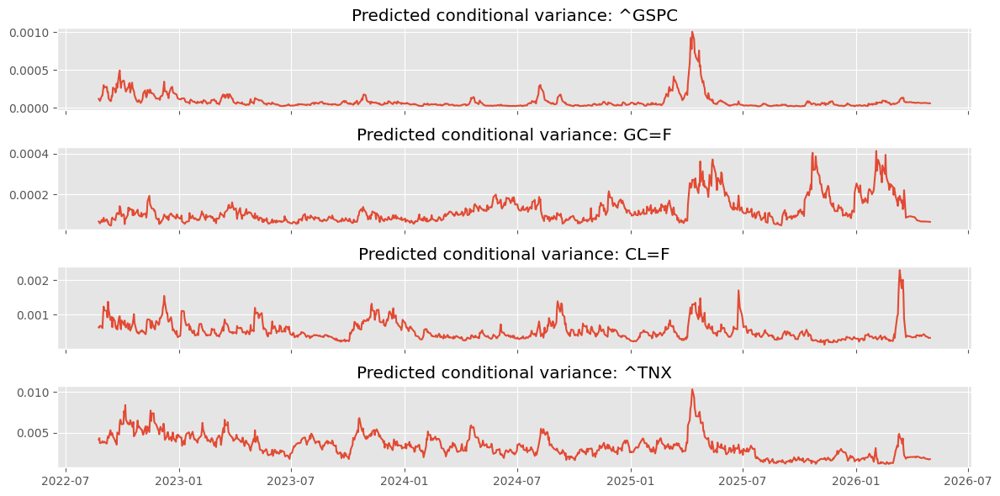

In [873]:
# Quick diagnostic plot: predicted conditional variances
# Build a time index + diagonal variance frame first
test_index_vol = test_df.index[lookback:]
sigma_test_diag_df = pd.DataFrame(
    {
        f'Var({macro_tickers[i]})': sigma_test_real[:, i, i]
        for i in range(len(macro_tickers))
    },
    index=test_index_vol,
)

fig, axes = plt.subplots(len(macro_tickers), 1, figsize=(12, 6), sharex=True)
if len(macro_tickers) == 1:
    axes = [axes]

for i, col in enumerate(macro_tickers):
    axes[i].plot(sigma_test_diag_df.index, sigma_test_diag_df[f'Var({col})'])
    axes[i].set_title(f'Predicted conditional variance: {col}')

plt.tight_layout()
plt.show()


In [874]:
from statistics import NormalDist
from scipy.stats import t
from plots import plot_var

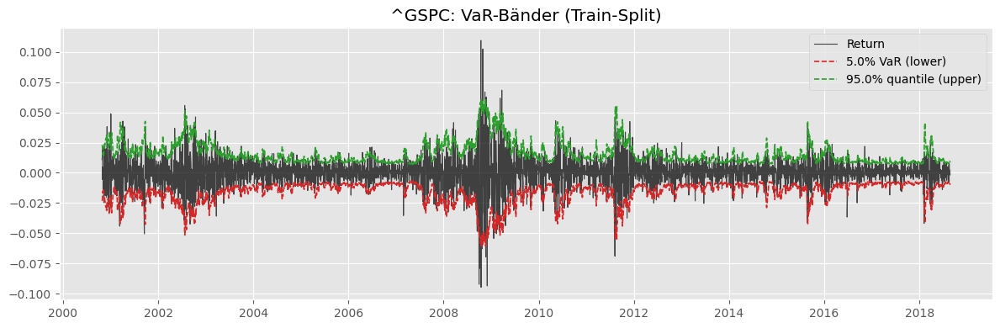

^GSPC: hit rate = 6.101% (target 5.000%)


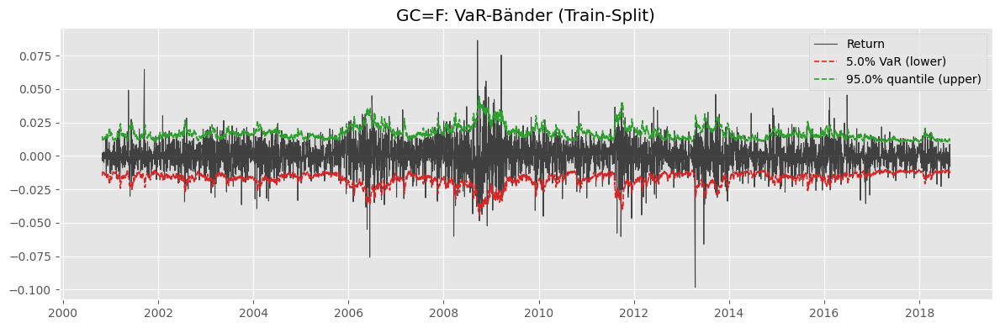

GC=F: hit rate = 5.070% (target 5.000%)


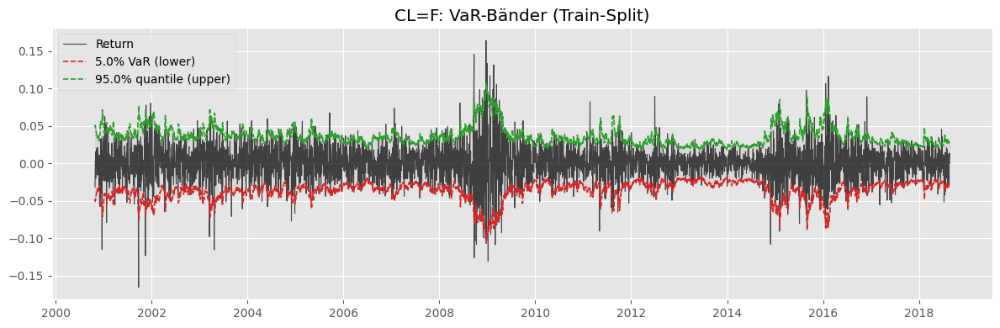

CL=F: hit rate = 4.845% (target 5.000%)


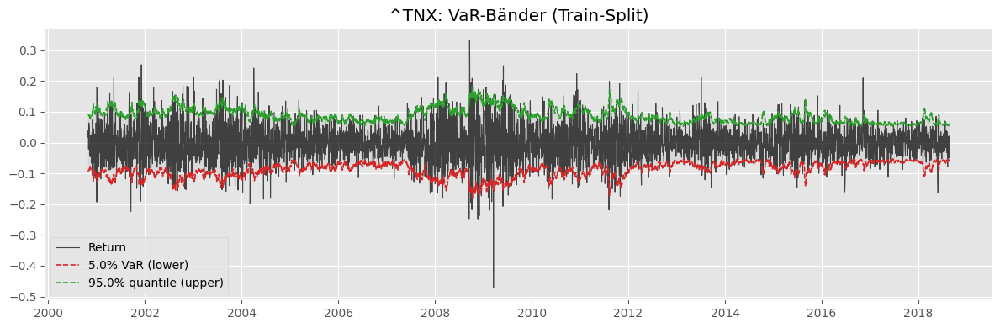

^TNX: hit rate = 4.554% (target 5.000%)


In [875]:
plot_var(alpha=0.05, lookback=lookback, cols=macro_tickers, view="Train-Split", df=train_df, pred_vol=sigma_train_real)

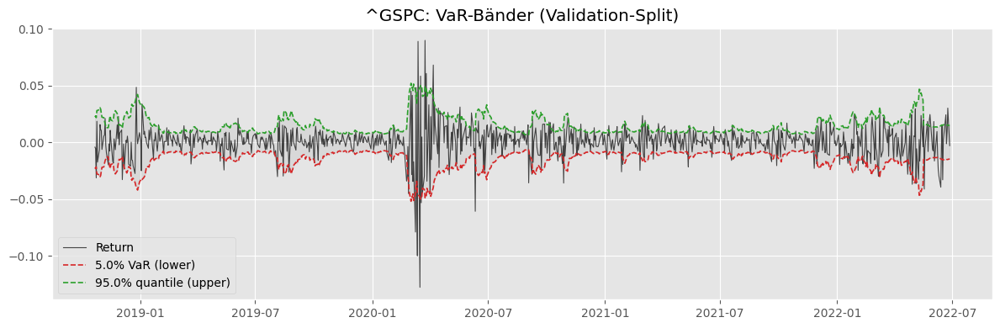

^GSPC: hit rate = 8.225% (target 5.000%)


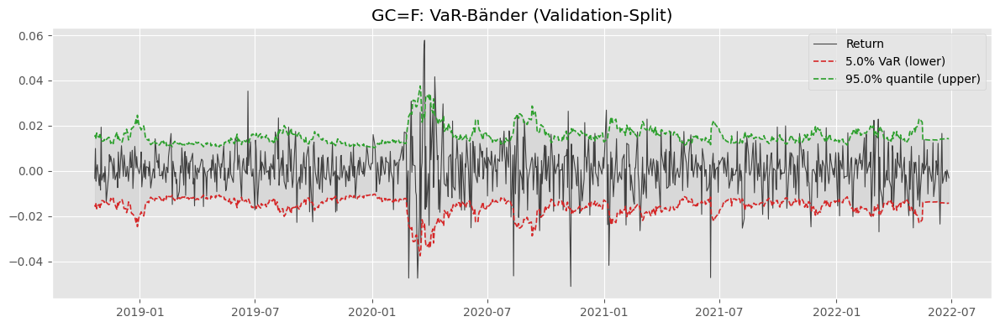

GC=F: hit rate = 5.952% (target 5.000%)


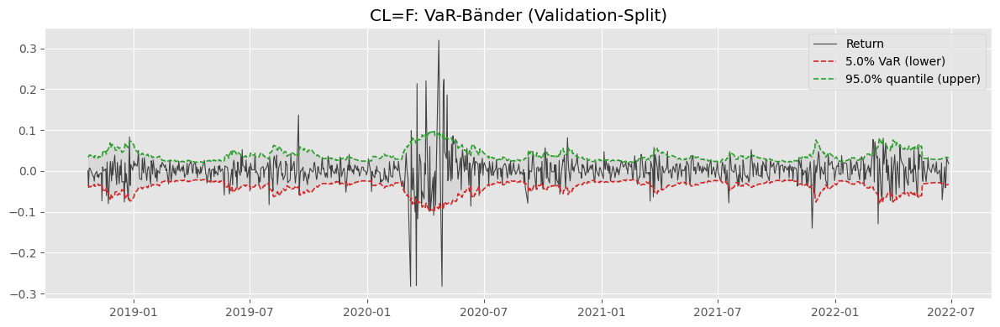

CL=F: hit rate = 7.684% (target 5.000%)


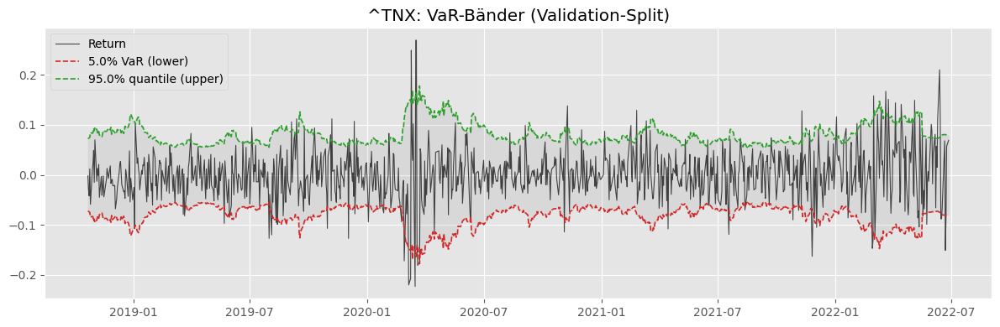

^TNX: hit rate = 4.870% (target 5.000%)


In [876]:
plot_var(alpha=0.05, lookback=lookback, cols=macro_tickers, view="Validation-Split", df=val_df, pred_vol=sigma_val_real)

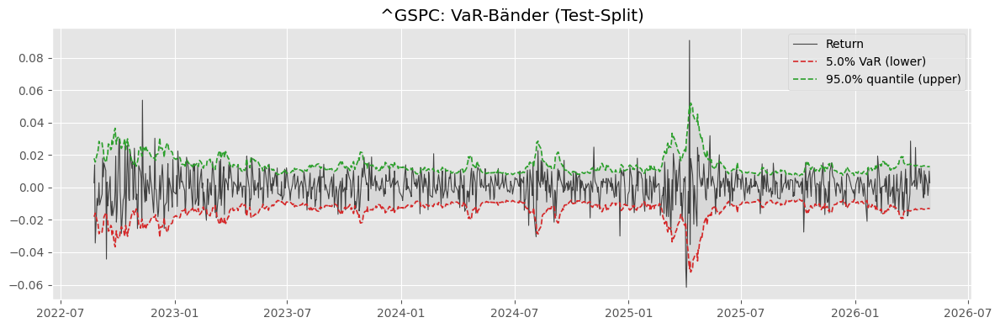

^GSPC: hit rate = 7.135% (target 5.000%)


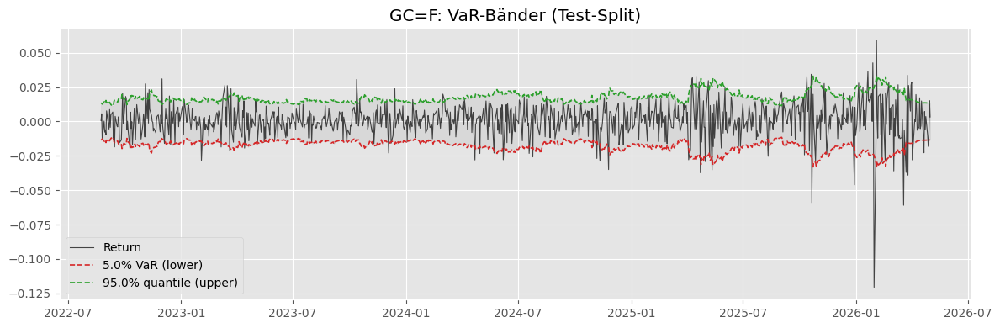

GC=F: hit rate = 5.189% (target 5.000%)


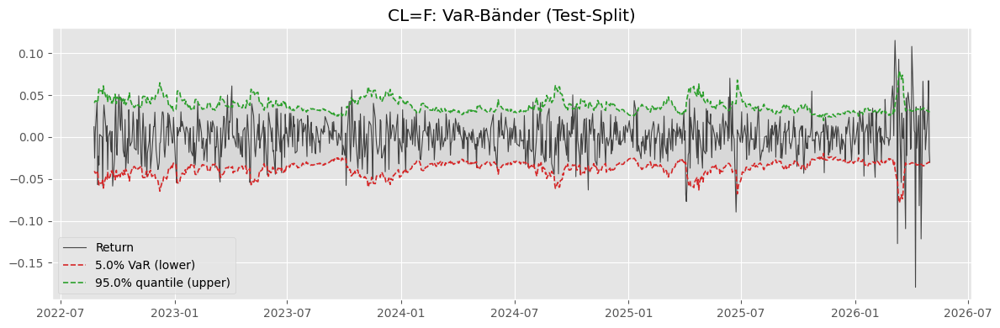

CL=F: hit rate = 4.865% (target 5.000%)


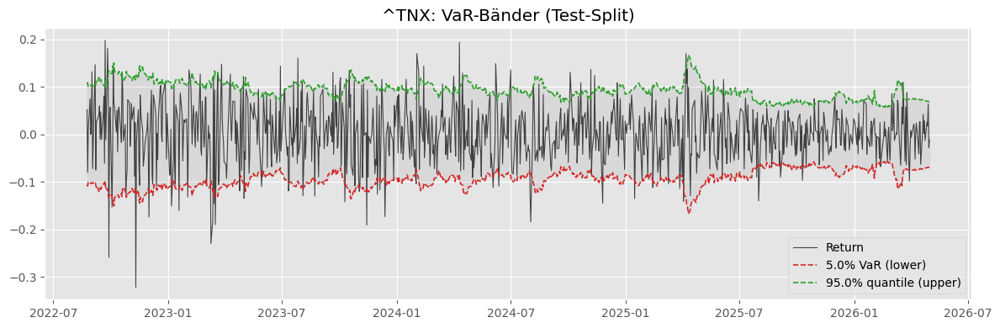

^TNX: hit rate = 5.514% (target 5.000%)


In [877]:
plot_var(alpha=0.05, lookback=lookback, cols=macro_tickers, view="Test-Split", df=test_df, pred_vol=sigma_test_real)

In [878]:
train_df.shape, val_df.shape, test_df.shape

((4498, 14), (964, 14), (965, 14))

# Portfolio Berechnungen

Portfolio Weights & Portfolio Return $r_{p,t} = w^\top \cdot r_t$

$w = (w_1, w_2, \dots, w_n)^\top$ mit $\sum_i^n w_i = 1$

Portfolio Variance:

$\sigma^2_{p,t} = w^\top \Sigma_t w$


In [879]:
w = torch.tensor([0.25, 0.25, 0.25, 0.25], dtype=torch.float32).to(device)  # gleichgewichtetes Portfolio

In [880]:
#w = torch.tensor([0.5, 0.4, 0.1])

In [881]:
w.shape

torch.Size([4])

In [882]:
logret.shape

(6427, 4)

In [883]:
torch.tensor(logret.values).shape

torch.Size([6427, 4])

In [884]:
logret_tensor = torch.tensor(logret.values, dtype=torch.float32, device=w.device)

In [885]:
w.shape

torch.Size([4])

In [886]:
logret_tensor.shape

torch.Size([6427, 4])

In [887]:
portfolio_logrets = (w * logret_tensor).sum(dim=1)

In [888]:
portfolio_logrets.shape

torch.Size([6427])

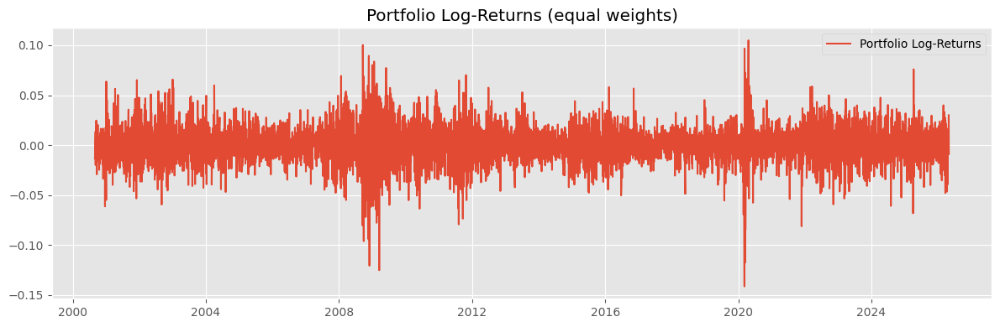

In [889]:
portfolio_logrets_np = portfolio_logrets.detach().cpu().numpy()
plt.figure(figsize=(12, 4))
plt.plot(logret.index, portfolio_logrets_np, label="Portfolio Log-Returns")
plt.title("Portfolio Log-Returns (equal weights)")
plt.legend()
plt.tight_layout()
plt.show()

In [890]:
#w = np.array([0.5, 0.4, 0.1], dtype=np.float32)
#w

In [891]:
def calc_portfolio_variance(df_split, sigma_split, cols, lookback, w):
    idx = df_split.index[lookback:]
    r = df_split.loc[idx, cols].values  # (N-lookback, d)
    r_p = (w*r).sum(axis=1)  # (N-lookback,) Portfolio-Logreturns
    tmp = sigma_split @ w          # (T, d)  = Σ_t w
    var_p = (w * tmp).sum(axis=1) # (1,) = w^T (Σ_t w) Portfolio-Varianz pro t
    vol_p = np.sqrt(var_p)
    
    return idx, r_p, var_p, vol_p

## LSTM mit Normal Loss

In [892]:
w_np = w.detach().cpu().numpy()

In [893]:
sigma_train_real.shape

(4458, 4, 4)

In [894]:
idx_test, rp_test, varp_test, volp_test = calc_portfolio_variance(
    test_df, sigma_test_real, macro_tickers, lookback, w_np
)

idx_val, rp_val, varp_val, volp_val = calc_portfolio_variance(
    val_df, sigma_val_real, macro_tickers, lookback, w_np
)

idx_train, rp_train, varp_train, volp_train = calc_portfolio_variance(
    train_df, sigma_train_real, macro_tickers, lookback, w_np
)

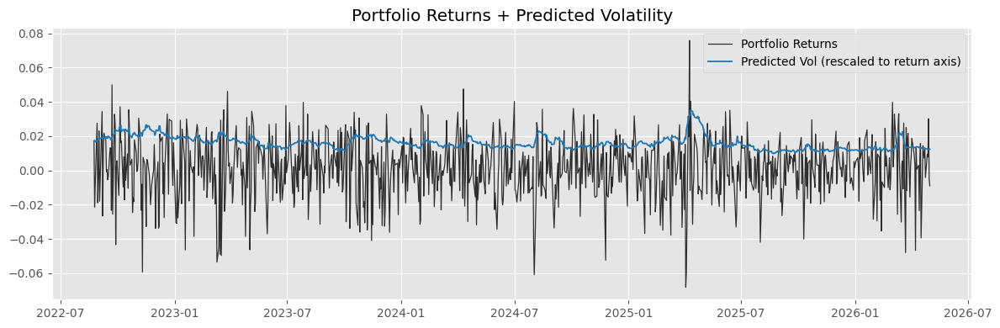

In [895]:
r = np.asarray(rp_test, dtype=float)
v = np.asarray(volp_test, dtype=float)

plt.figure(figsize=(12, 4))
plt.plot(idx_test, r, label="Portfolio Returns", color="black", lw=0.9, alpha=0.8)
plt.plot(idx_test, v, label="Predicted Vol (rescaled to return axis)", color="tab:blue", lw=1.3)
plt.title("Portfolio Returns + Predicted Volatility")
plt.legend()
plt.tight_layout()
plt.show()

In [896]:
def make_portfolio_df(idx, rp, varp, volp):
    return pd.DataFrame(
        {
            "r_p": np.asarray(rp, dtype=float),
            "var_p": np.asarray(varp, dtype=float),
            "vol_p": np.asarray(volp, dtype=float),
        },
        index=idx,
    )

In [897]:
portfolio_test = make_portfolio_df(idx_test, rp_test, varp_test, volp_test)
portfolio_val = make_portfolio_df(idx_val, rp_val, varp_val, volp_val)
portfolio_train = make_portfolio_df(idx_train, rp_train, varp_train, volp_train)

In [898]:
test_df.columns

Index(['^GSPC', 'GC=F', 'CL=F', '^TNX', 'cross_1', 'cross_2', 'cross_3',
       'cross_4', 'cross_5', 'cross_6', 'cross_7', 'cross_8', 'cross_9',
       'cross_10'],
      dtype='object')

In [899]:
macro_tickers

['^GSPC', 'GC=F', 'CL=F', '^TNX']

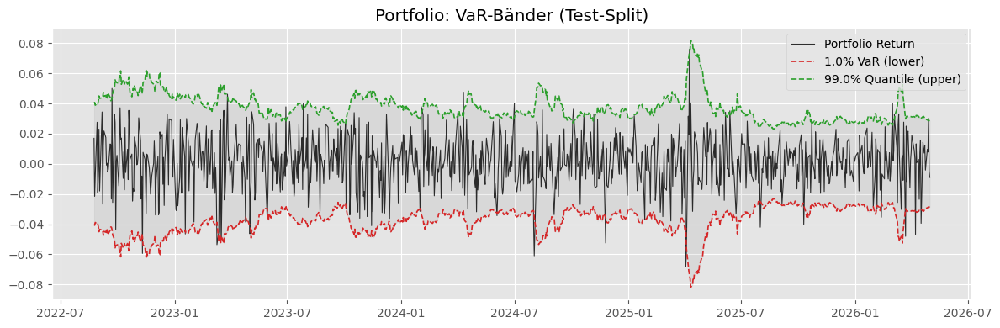

Portfolio hit rate = 2.703% (target 1.000%)


In [900]:
plot_var(alpha=0.01, lookback=lookback, view="Test-Split", portfolio=True, portfolio_df=portfolio_test)

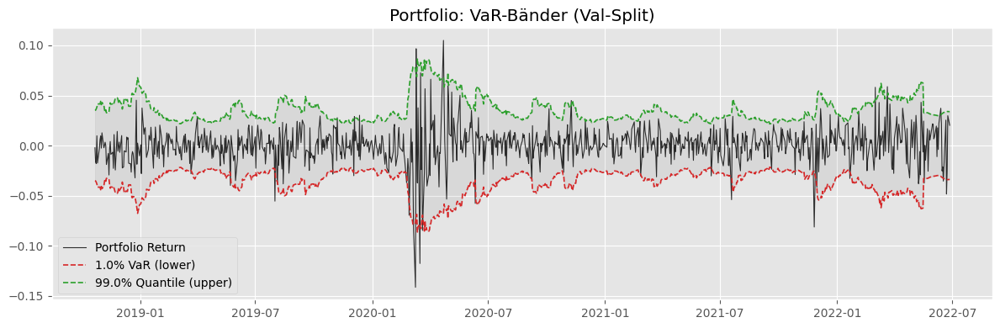

Portfolio hit rate = 2.706% (target 1.000%)


In [901]:
plot_var(alpha=0.01, lookback=lookback, view="Val-Split", portfolio=True, portfolio_df=portfolio_val)

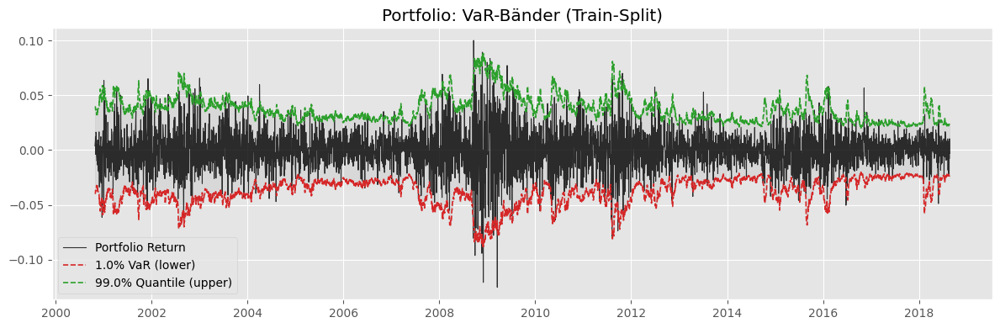

Portfolio hit rate = 1.548% (target 1.000%)


In [902]:
plot_var(alpha=0.01, lookback=lookback, view="Train-Split", portfolio=True, portfolio_df=portfolio_train)

## LSTM mit Student-t Loss

### Training

Modell mit Studen-t-Verteilung

$$r_t \sim t_\nu(0, S_t)$$

$$ S_t = \frac{\nu}{\nu-2} \Sigma_t = \frac{\nu}{\nu-2} L_t L_t^\top = (\sqrt{\frac{\nu}{\nu-2}} L) \cdot (\sqrt{\frac{\nu}{\nu-2}} L)^\top$$

In [903]:
from training_functions import StudentTLoss

In [904]:
seed_everything(SEED)
vol_train_loader = DataLoader(vol_train_ds, batch_size=batchsize, shuffle=True, generator=make_generator(SEED))
student_loss = StudentTLoss(init_nu=8.0, min_nu=2.01, max_nu=100.0)

In [905]:
k = len(macro_tickers)*(len(macro_tickers)+1)//2 # Anzahl an Cross Returns, die zusätzlich zu den normalen Returns als Input-Features für die Kovarianzmodellierung genutzt werden

cov_model_t = LSTMCovariance(input_size=(len(macro_tickers)+k), n_assets=len(macro_tickers), hidden_size=hidden_size, num_layers=2, dropout=dropout)
cov_model_t, hist_t = train_covariance_model(
    cov_model_t,
    vol_train_loader,
    vol_val_loader,
    loss_fn=student_loss,
    loss_kwargs=None,
    epochs=500,
    lr=lr,
    plateau_patience=20,
    device=device,
    scheduler_type="cosine",  # oder "cosine"
    early_stopping_patience=early_stopping_patience,
    early_stopping_min_delta=early_stopping_min_delta,
)

save_model_checkpoint(
    model_name="lstm_student",
    models_dir=models_dir,
    model=cov_model_t,
    history=hist_t,
    run_metadata=RUN_METADATA,
    loss_fn=student_loss,
    config={
        "model_class": "LSTMCovariance",
        "distribution": "student_t",
        "input_size": len(macro_tickers) + k,
        "n_assets": len(macro_tickers),
        "hidden_size": hidden_size,
        "num_layers": 2,
        "dropout": dropout,
        "lookback": lookback,
        "batchsize": batchsize,
        "epochs": 500,
        "lr": lr,
        "scheduler_type": "cosine",
        "early_stopping_patience": early_stopping_patience,
        "early_stopping_min_delta": early_stopping_min_delta,
        "nu": float(student_loss.nu.detach().cpu()),
    },
)

Epoch 001 | train NLL 5.286844 | val NLL 5.473092 | lr 3.00e-04
Epoch 002 | train NLL 5.051247 | val NLL 5.285733 | lr 3.00e-04
Epoch 003 | train NLL 4.928515 | val NLL 5.198577 | lr 3.00e-04
Epoch 004 | train NLL 4.882202 | val NLL 5.178916 | lr 3.00e-04
Epoch 005 | train NLL 4.843095 | val NLL 5.169478 | lr 3.00e-04
Epoch 006 | train NLL 4.821815 | val NLL 5.138660 | lr 3.00e-04
Epoch 007 | train NLL 4.806249 | val NLL 5.168112 | lr 3.00e-04
Epoch 008 | train NLL 4.793749 | val NLL 5.160212 | lr 3.00e-04
Epoch 009 | train NLL 4.770692 | val NLL 5.148049 | lr 3.00e-04
Epoch 010 | train NLL 4.759364 | val NLL 5.135762 | lr 3.00e-04
Epoch 011 | train NLL 4.747842 | val NLL 5.206526 | lr 3.00e-04
Epoch 012 | train NLL 4.730150 | val NLL 5.173603 | lr 3.00e-04
Epoch 013 | train NLL 4.728655 | val NLL 5.175314 | lr 3.00e-04
Epoch 014 | train NLL 4.718215 | val NLL 5.148439 | lr 2.99e-04
Epoch 015 | train NLL 4.701994 | val NLL 5.179044 | lr 2.99e-04
Epoch 016 | train NLL 4.697396 | val NLL

In [906]:
learned_nu = float(student_loss.nu.detach().cpu())
student_kwargs = {"nu": learned_nu}

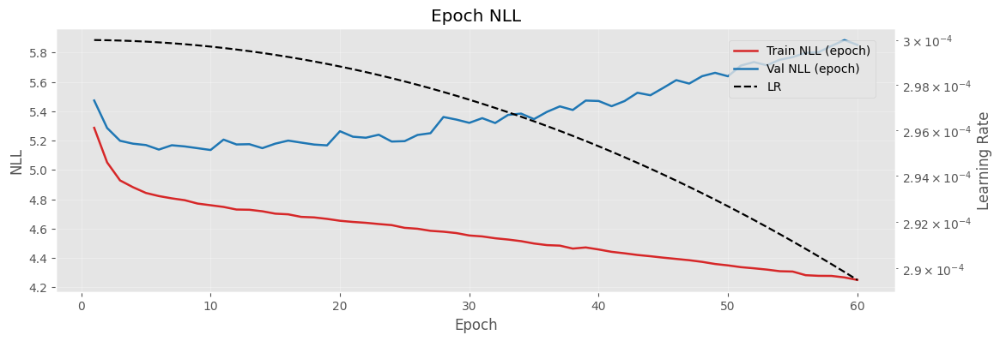

In [907]:
plot_loss(hist_t)

In [908]:
sigma_val_scaled_t, y_val_scale_t = predict_sigma(cov_model_t, vol_val_loader, device=device)
sigma_test_scaled_t, y_test_scaled_t = predict_sigma(cov_model_t, vol_test_loader, device=device)

sigma_val_real_t = scale_back(sigma_val_scaled_t, sigma=sigma, feature_cols=macro_tickers)
sigma_test_real_t = scale_back(sigma_test_scaled_t, sigma=sigma, feature_cols=macro_tickers)

In [909]:
vol_train_eval_loader = DataLoader(vol_train_ds, batch_size=batchsize, shuffle=False)
sigma_train_scaled_t, y_train_scaled_t = predict_sigma(cov_model_t, vol_train_eval_loader, device=device)
sigma_train_real_t = scale_back(sigma_train_scaled_t, sigma=sigma, feature_cols=macro_tickers)

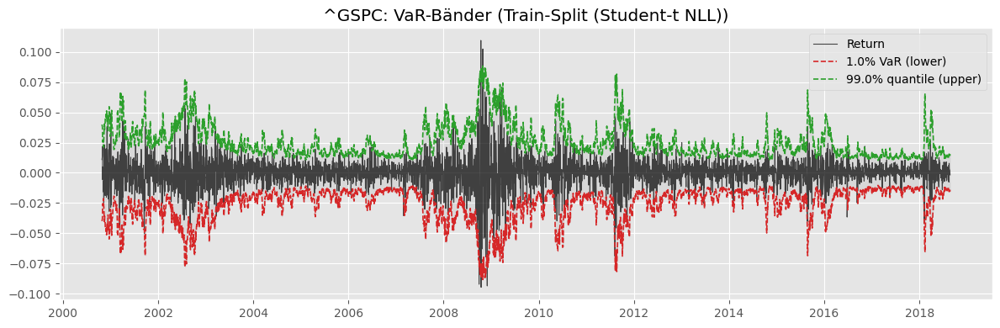

^GSPC: hit rate = 1.211% (target 1.000%)


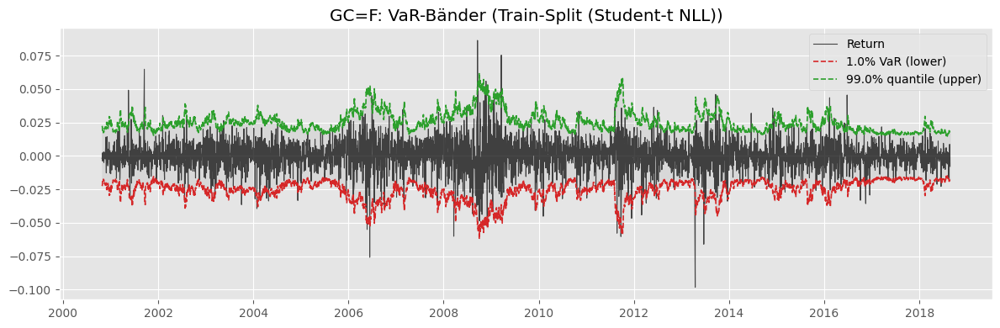

GC=F: hit rate = 1.525% (target 1.000%)


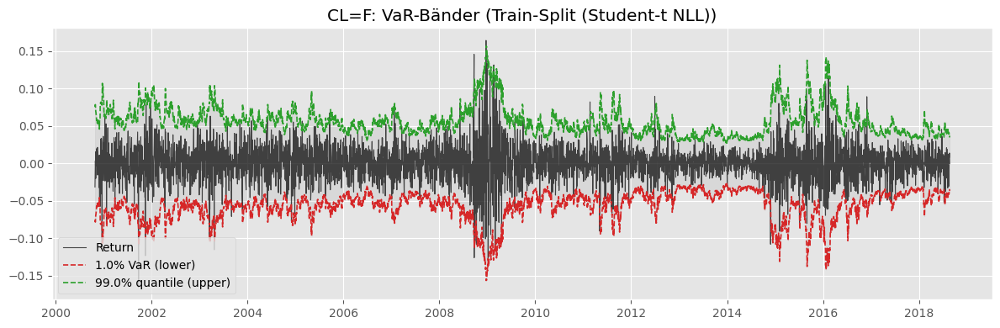

CL=F: hit rate = 0.897% (target 1.000%)


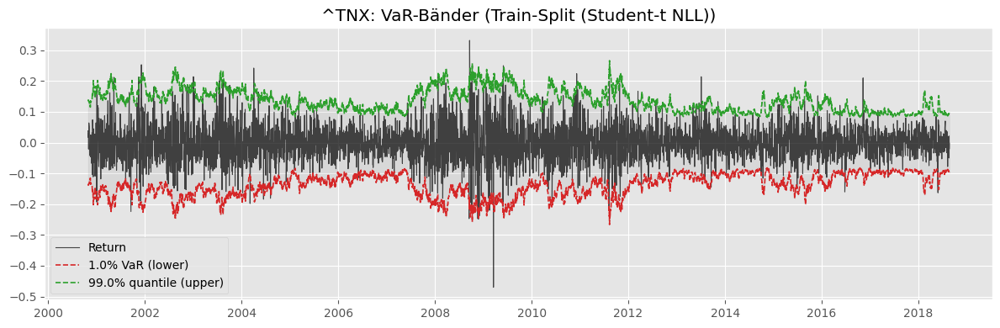

^TNX: hit rate = 0.718% (target 1.000%)


In [910]:
plot_var(alpha=0.01, lookback=lookback, cols=macro_tickers, view="Train-Split (Student-t NLL)", df=train_df, pred_vol=sigma_train_real_t, loss_fn=student_nll, loss_kwargs=student_kwargs)

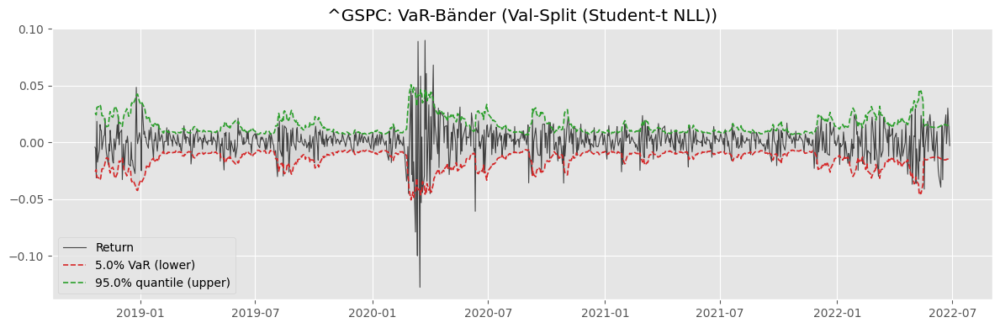

^GSPC: hit rate = 7.684% (target 5.000%)


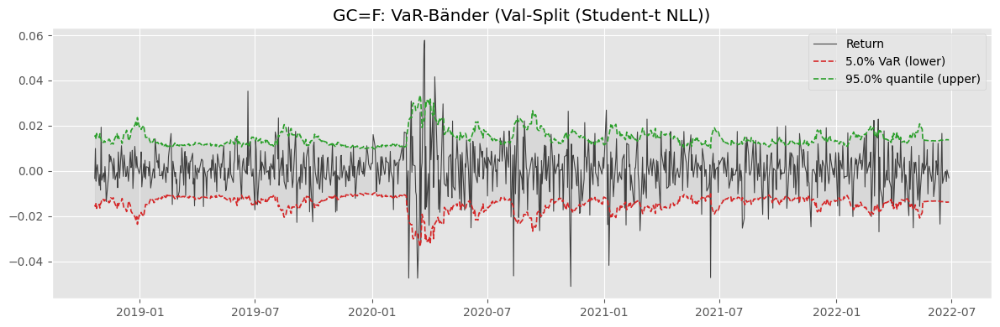

GC=F: hit rate = 6.385% (target 5.000%)


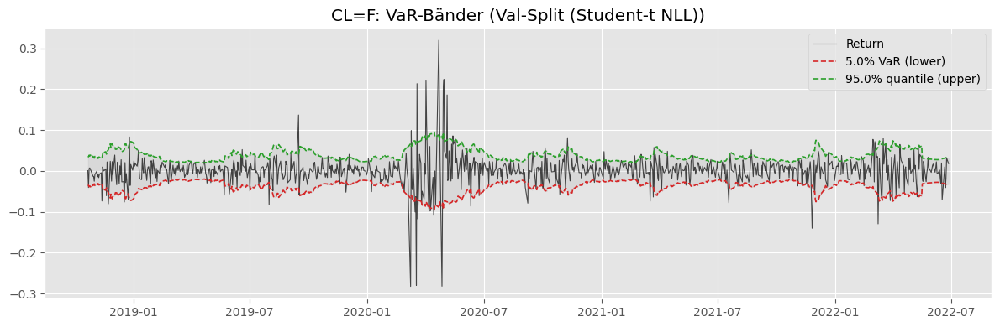

CL=F: hit rate = 8.009% (target 5.000%)


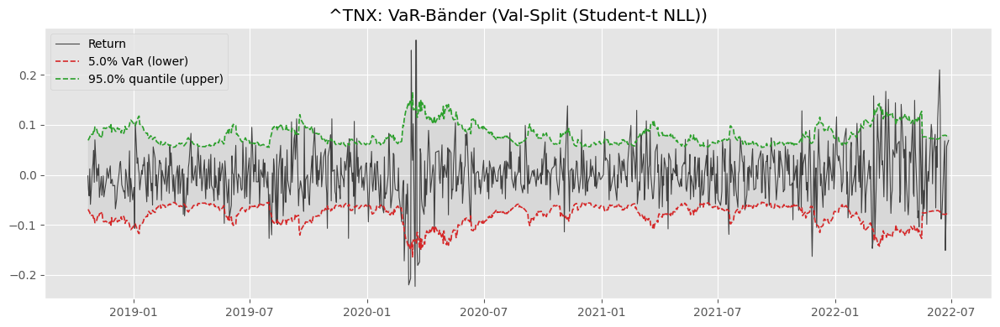

^TNX: hit rate = 4.870% (target 5.000%)


In [911]:
plot_var(alpha=0.05, lookback=lookback, cols=macro_tickers, view="Val-Split (Student-t NLL)", df=val_df, pred_vol=sigma_val_real_t, loss_fn=student_nll, loss_kwargs=student_kwargs)

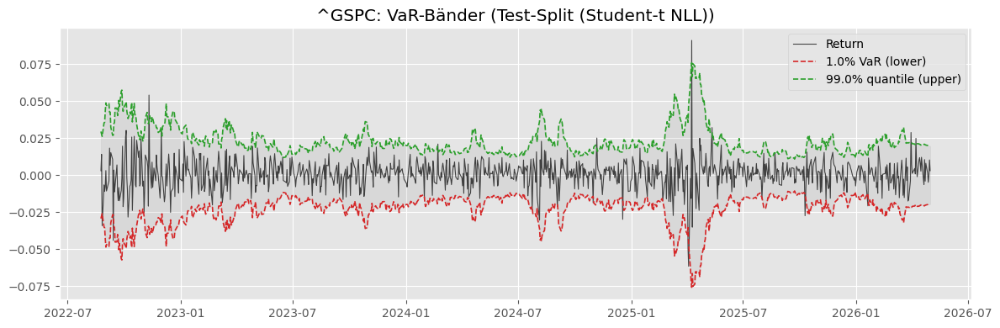

^GSPC: hit rate = 1.297% (target 1.000%)


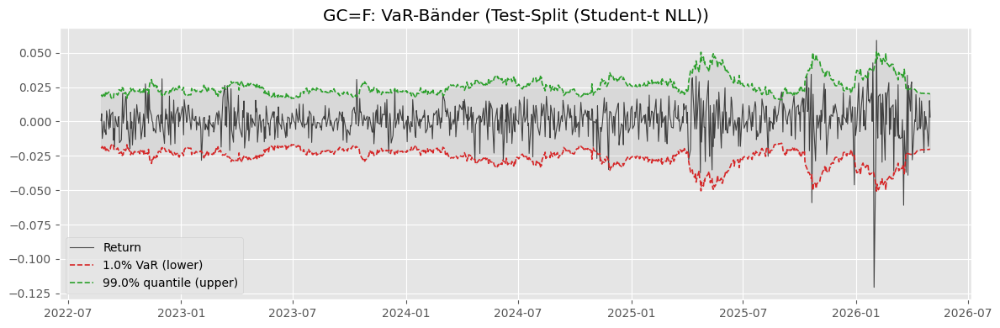

GC=F: hit rate = 1.730% (target 1.000%)


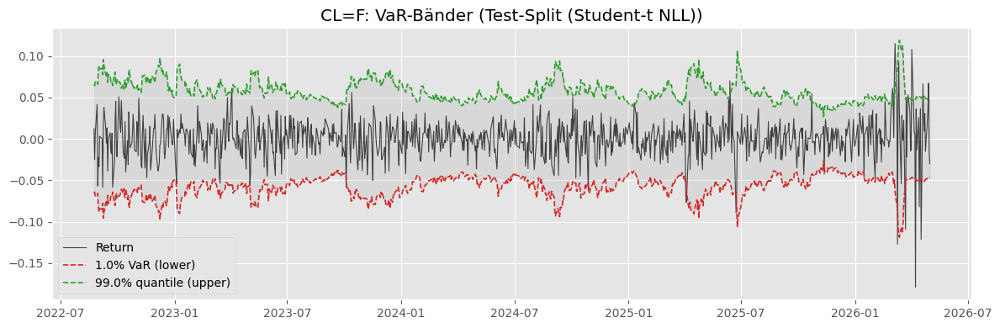

CL=F: hit rate = 1.297% (target 1.000%)


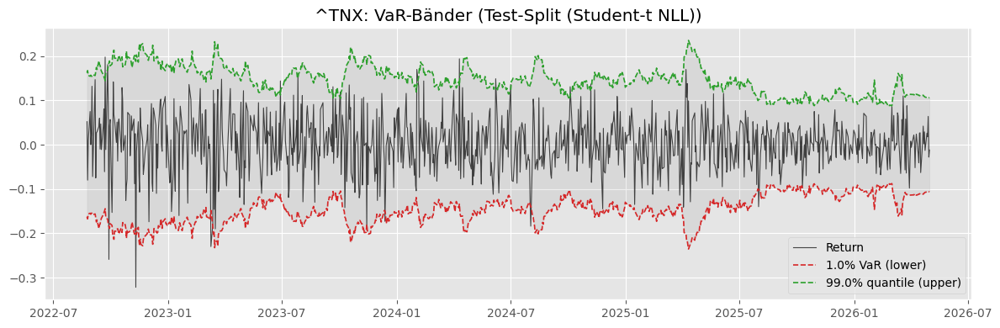

^TNX: hit rate = 0.757% (target 1.000%)


In [912]:
plot_var(alpha=0.01, lookback=lookback, cols=macro_tickers, view="Test-Split (Student-t NLL)", df=test_df, pred_vol=sigma_test_real_t, loss_fn=student_nll, loss_kwargs=student_kwargs)

### Portfolio Returns

- Hier müssten jetzt noch mal die Portfolio Returns & Volas mit ```make_portfolio_df``` berechnet werden für Student-t Verteilung!

In [913]:
idx_test_t, rp_test_t, varp_test_t, volp_test_t = calc_portfolio_variance(
    test_df, sigma_test_real_t, macro_tickers, lookback, w_np
)

idx_val_t, rp_val_t, varp_val_t, volp_val_t = calc_portfolio_variance(
    val_df, sigma_val_real_t, macro_tickers, lookback, w_np
)

idx_train_t, rp_train_t, varp_train_t, volp_train_t = calc_portfolio_variance(
    train_df, sigma_train_real_t, macro_tickers, lookback, w_np
)

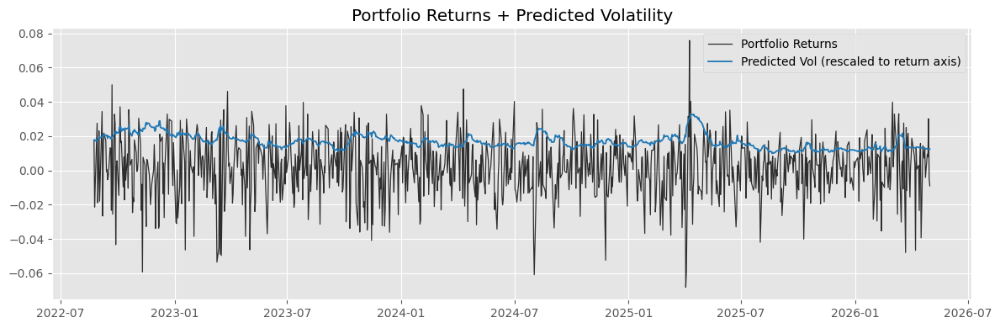

In [914]:
r = np.asarray(rp_test_t, dtype=float)
v = np.asarray(volp_test_t, dtype=float)

plt.figure(figsize=(12, 4))
plt.plot(idx_test, r, label="Portfolio Returns", color="black", lw=0.9, alpha=0.8)
plt.plot(idx_test, v, label="Predicted Vol (rescaled to return axis)", color="tab:blue", lw=1.3)
plt.title("Portfolio Returns + Predicted Volatility")
plt.legend()
plt.tight_layout()
plt.show()

In [915]:
portfolio_test_t = make_portfolio_df(idx_test_t, rp_test_t, varp_test_t, volp_test_t)
portfolio_val_t = make_portfolio_df(idx_val_t, rp_val_t, varp_val_t, volp_val_t)
portfolio_train_t = make_portfolio_df(idx_train_t, rp_train_t, varp_train_t, volp_train_t)

Modell mit skewed Studen-t-Verteilung

## Filtered Historical Simulation

- bisher FHS nur mit Normal Volas

In [916]:
from risk_metrics import fhs_var_es

In [917]:
alpha = 0.01
window = 1000  # z.B. 250/500/1000 testen

In [918]:
len(train_df), len(val_df), len(test_df)

(4498, 964, 965)

### Normal Loss (Portfolio)

In [919]:
z_train = portfolio_train["r_p"].values / np.clip(portfolio_train["vol_p"].values, 1e-12, None) # clip sichert nur nach unten ab (0 division)
z_val = portfolio_val["r_p"].values / np.clip(portfolio_val["vol_p"].values, 1e-12, None)
z_test = portfolio_test["r_p"].values / np.clip(portfolio_test["vol_p"].values, 1e-12, None)
z_train_val =np.concatenate([z_train, z_val])


var_fhs_test, es_fhs_test, hits_test = fhs_var_es(
    z_hist_init=z_train_val, # nimmt die letzen #window Werte als Historie
    r_oos=portfolio_test["r_p"].values,
    vol_oos=portfolio_test["vol_p"].values,
    alpha=alpha,
    window=window
)

hit_rate_test = hits_test.mean()
print(f"FHS Test hit rate = {hit_rate_test:.3%} (target {alpha:.3%})")

FHS Test hit rate = 1.081% (target 1.000%)


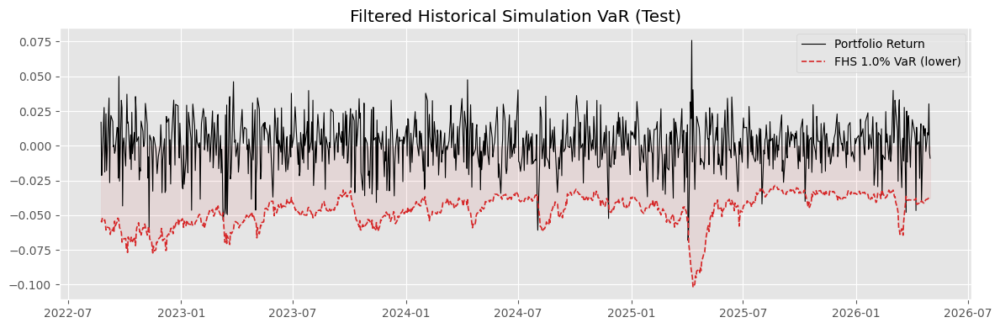

In [920]:
plt.figure(figsize=(12,4))
plt.plot(portfolio_test.index, portfolio_test["r_p"].values, color="black", lw=0.8, label="Portfolio Return")
plt.plot(portfolio_test.index, var_fhs_test, "--", color="tab:red", lw=1.2, label=f"FHS {alpha:.1%} VaR (lower)")
plt.fill_between(portfolio_test.index, var_fhs_test, np.zeros_like(var_fhs_test), color="tab:red", alpha=0.08)
plt.title("Filtered Historical Simulation VaR (Test)")
plt.legend()
plt.tight_layout()
plt.show()

- Falls FHS auf train genutzt werden soll, muss zuvor ein z_train_burn_in genutzt werden wo zb die ersten 500 z_t aus train genutzt werden für die historie und von dort aus wird dann der VaR rollierend berechnet!

In [921]:
z_train_burn_in = z_train[:window]

In [922]:
var_fhs_train, es_fhs_train, hit_train = fhs_var_es(
    z_hist_init=z_train_burn_in, # custom burn-in für Historie nötig
    r_oos=portfolio_train["r_p"][window:].values,
    vol_oos=portfolio_train["vol_p"][window:].values,
    alpha=alpha,
    window=window
)

hit_rate_train = hit_train.mean()
print(f"FHS Train hit rate = {hit_rate_train:.3%} (target {alpha:.3%})")

FHS Train hit rate = 1.186% (target 1.000%)


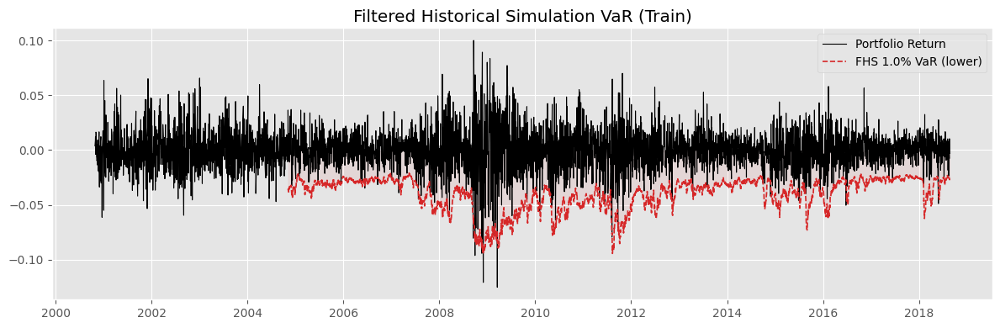

In [923]:
plt.figure(figsize=(12,4))
plt.plot(portfolio_train.index, portfolio_train["r_p"].values, color="black", lw=0.8, label="Portfolio Return")
plt.plot(portfolio_train[window:].index, var_fhs_train, "--", color="tab:red", lw=1.2, label=f"FHS {alpha:.1%} VaR (lower)")
plt.fill_between(portfolio_train[window:].index, var_fhs_train, np.zeros_like(var_fhs_train), color="tab:red", alpha=0.08)
plt.title("Filtered Historical Simulation VaR (Train)")
plt.legend()
plt.tight_layout()
plt.show()

In [924]:
var_fhs_val, es_fhs_val, hit_val = fhs_var_es(
    z_hist_init=z_train,
    r_oos=portfolio_val["r_p"].values,
    vol_oos=portfolio_val["vol_p"].values,
    alpha=alpha,
    window=window
)

hit_rate_val = hit_val.mean()
print(f"FHS Val hit rate = {hit_rate_val:.3%} (target {alpha:.3%})")

FHS Val hit rate = 1.732% (target 1.000%)


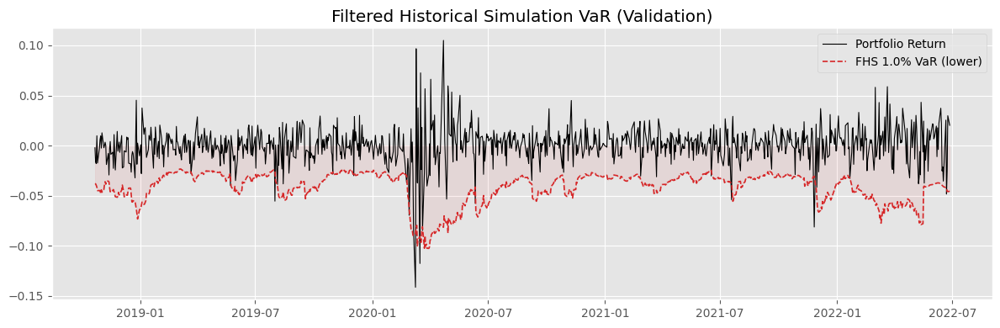

In [925]:
plt.figure(figsize=(12,4))
plt.plot(portfolio_val.index, portfolio_val["r_p"].values, color="black", lw=0.8, label="Portfolio Return")
plt.plot(portfolio_val.index, var_fhs_val, "--", color="tab:red", lw=1.2, label=f"FHS {alpha:.1%} VaR (lower)")
plt.fill_between(portfolio_val.index, var_fhs_val, np.zeros_like(var_fhs_val), color="tab:red", alpha=0.08)
plt.title("Filtered Historical Simulation VaR (Validation)")
plt.legend()
plt.tight_layout()
plt.show()

### Student-t Loss (Portfolio)

In [926]:
z_train_t = portfolio_train_t["r_p"].values / np.clip(portfolio_train_t["vol_p"].values, 1e-12, None) # clip sichert nur nach unten ab (0 division)
z_val_t = portfolio_val_t["r_p"].values / np.clip(portfolio_val_t["vol_p"].values, 1e-12, None)
z_test_t = portfolio_test_t["r_p"].values / np.clip(portfolio_test_t["vol_p"].values, 1e-12, None)
z_train_val_t =np.concatenate([z_train_t, z_val_t])


var_fhs_test_t, es_fhs_test_t, hits_test_t = fhs_var_es(
    z_hist_init=z_train_val_t, # nimmt die letzen #window Werte als Historie
    r_oos=portfolio_test_t["r_p"].values,
    vol_oos=portfolio_test_t["vol_p"].values,
    alpha=alpha,
    window=window
)

hit_rate_test_t = hits_test_t.mean()
print(f"FHS Test hit rate = {hit_rate_test_t:.3%} (target {alpha:.3%})")

FHS Test hit rate = 1.189% (target 1.000%)


# MGARCH-LSTM mit BEKK Kernel Function (Zhao et al. 2024)

$$
\textbf{Original LSTM:}
$$

$$
f_t = \sigma_g\!\left(W_f x_t 
    + U_f h_{t-1} 
    + b_f\right), \\

i_t = \sigma_g\!\left(W_i x_t 
    + U_i h_{t-1} 
    + b_i\right), \\

o_t = \sigma_g\!\left(W_o x_t 
    + U_o h_{t-1} 
    + b_o\right), \\

\tilde{c}_t = \sigma_c\!\left(W_c x_t 
    + U_c h_{t-1} 
    + b_c\right), \\

c_t = f_t \odot c_{t-1} 
    + i_t \odot \tilde{c}_t, \\

h_t = o_t \odot \tanh(c_t)
$$

$s_{t-1} := \operatorname{vech}(\Sigma_{t-1}) $

$x_{t} := [
  \text{standardisierte Returns,
  standardisierte Cross-Return-Features,
  ggf. weitere standardisierte Features}
]$

$$
\textbf{LSTM mit BEKK Kernel:}
$$

$$
f_t = \sigma_g\!\left(W_f x_{t} 
      + U_f s_{t-1} 
      + b_f\right), \\
i_t = \sigma_g\!\left(W_i x_{t} 
      + U_i s_{t-1} 
      + b_i\right), \\
\tilde c_t = \sigma_c\!\left(W_c x_{t} 
      + U_c s_{t-1} 
      + b_c\right), \\
c_t = f_t \odot c_{t-1} 
      + i_t \odot \tilde c_t.
$$

The output gate can then be reinterpreted as a BEKK kernel output
$$
o_t := \mathcal{K}_{\text{BEKK}}(\varepsilon_{t-1}, \Sigma_{t-1}; \Theta), \\
\mathcal{K}_{\text{BEKK}} = C C^\top 
      + A^\top \varepsilon_{t-1}\varepsilon_{t-1}^\top A 
      + B^\top \Sigma_{t-1} B.
$$

$$
\textbf{Scalar modulation:}
$$

$$m_t = 1 + \beta \tanh(w_o^\top \tanh(c_t) + b_o)$$

$$\Sigma_t
= m_t \times o_t = 
\underbrace{m_t}_{\text{LSTM}}
\times
\underbrace{
\left(
CC^\top
+
A^\top \varepsilon_{t-1}\varepsilon_{t-1}^\top A
+
B^\top \Sigma_{t-1} B
\right)
}_{\text{BEKK(1,1)}}$$

$$
\textbf{Vector modulation:}
$$

$$
m_t = \mathbf{1}_d + \beta \tanh\big(W_o \tanh(c_t) + b_o\big), \quad m_t \in (1-\beta, 1+\beta)^d
$$

$$
\Sigma_t = \operatorname{diag}(m_t)\, o_t\, \operatorname{diag}(m_t)
$$

$$
\textbf{Convex mixture (regime-switching) modulation:}
$$

$$
\alpha_t = \sigma\left(
W_\alpha 
\begin{bmatrix}
\tanh(c_t) \\
\operatorname{vech}(o_t)
\end{bmatrix}
+ b_\alpha
\right), 
\quad \alpha_t \in (0,1)
$$

$$
\Sigma_t^{\text{LSTM}} = L_t L_t^\top
$$

$$
\Sigma_t = (1-\alpha_t)\, o_t + \alpha_t\, \Sigma_t^{\text{LSTM}}
$$

In [927]:
from bekk_kernel import BEKKCell, BEKKLSTM
from neural_bekk import NeuralBekk

- Es müssen neue Dataset & Dataloader angelegt werden, da die MGARCH Kernel Function ein BEKK(1,1) ist. Daher ist der bisherige ```lookback=60``` nicht passend.

In [928]:
#loss_kwargs = {"nu": 10.0}

```train_cov```ggf. zur Initialisierung nutzen. 

In [929]:
train_cov = torch.cov(torch.tensor(train_norm[macro_tickers].values, dtype=torch.float32,).T)  # sample / long-term covariance from training data
train_cov

tensor([[ 1.0000, -0.0332,  0.2122,  0.3630],
        [-0.0332,  1.0000,  0.2231, -0.1267],
        [ 0.2122,  0.2231,  1.0000,  0.1834],
        [ 0.3630, -0.1267,  0.1834,  1.0000]])

In [930]:
Sigma0 = torch.tensor(np.cov((train_df[macro_tickers].values * 100).T),
                      dtype=torch.float32)

In [931]:
seed_everything(SEED)
vol_train_loader = DataLoader(vol_train_ds, batch_size=batchsize, shuffle=True, generator=make_generator(SEED))
student_loss_bekk = StudentTLoss(init_nu=8.0, min_nu=2.01, max_nu=100.0)

## Scalar Modulation

In [932]:
bekk_kernel_lstm = BEKKLSTM(input_size=(len(macro_tickers)+k), n_assets=len(macro_tickers), hidden_size=hidden_size, asym=True, Sigma0=train_cov, modulation="scalar", return_std=sigma[macro_tickers], bekk_scale=100.0, sigma0_in_bekk_scale=False, gate_cov_layernorm=True, init_c_from_sigma0=True, jitter=bekk_jitter)
bekk_kernel_lstm, hist_bekk = train_covariance_model(
    bekk_kernel_lstm,
    vol_train_loader,
    vol_val_loader,
    loss_fn=student_loss_bekk,
    loss_kwargs=None,
    epochs=500,
    lr=bekk_lr,
    plateau_patience=20,
    device=bekk_device,
    scheduler_type="cosine",  # oder "cosine"
    grad_clip_max_norm=0.5,
    early_stopping_patience=early_stopping_patience,
    early_stopping_min_delta=early_stopping_min_delta,
)

save_model_checkpoint(
    model_name="bekk_lstm_scalar",
    models_dir=models_dir,
    model=bekk_kernel_lstm,
    history=hist_bekk,
    run_metadata=RUN_METADATA,
    loss_fn=student_loss_bekk,
    config={
        "model_class": "BEKKLSTM",
        "distribution": "student_t",
        "modulation": "scalar",
        "asym": True,
        "input_size": len(macro_tickers) + k,
        "n_assets": len(macro_tickers),
        "hidden_size": hidden_size,
        "lookback": lookback,
        "batchsize": batchsize,
        "epochs": 500,
        "lr": bekk_lr,
        "scheduler_type": "cosine",
        "early_stopping_patience": early_stopping_patience,
        "early_stopping_min_delta": early_stopping_min_delta,
        "device": bekk_device,
        "bekk_scale": 100.0,
        "jitter": bekk_jitter,
        "sigma0_in_bekk_scale": False,
        "gate_cov_layernorm": True,
        "init_c_from_sigma0": True,
        "nu": float(student_loss_bekk.nu.detach().cpu()),
    },
)

Epoch 001 | train NLL 5.168014 | val NLL 5.337390 | lr 1.00e-04
Epoch 002 | train NLL 5.111330 | val NLL 5.267510 | lr 1.00e-04
Epoch 003 | train NLL 5.067394 | val NLL 5.215145 | lr 1.00e-04
Epoch 004 | train NLL 5.050581 | val NLL 5.193909 | lr 1.00e-04
Epoch 005 | train NLL 5.039895 | val NLL 5.180529 | lr 1.00e-04
Epoch 006 | train NLL 5.036233 | val NLL 5.171635 | lr 1.00e-04
Epoch 007 | train NLL 5.030981 | val NLL 5.163019 | lr 1.00e-04
Epoch 008 | train NLL 5.026888 | val NLL 5.158724 | lr 9.99e-05
Epoch 009 | train NLL 5.018121 | val NLL 5.151513 | lr 9.99e-05
Epoch 010 | train NLL 5.013975 | val NLL 5.143524 | lr 9.99e-05
Epoch 011 | train NLL 5.014905 | val NLL 5.137544 | lr 9.99e-05
Epoch 012 | train NLL 5.004861 | val NLL 5.131107 | lr 9.99e-05
Epoch 013 | train NLL 5.001821 | val NLL 5.124958 | lr 9.98e-05
Epoch 014 | train NLL 4.996063 | val NLL 5.120759 | lr 9.98e-05
Epoch 015 | train NLL 4.995551 | val NLL 5.116385 | lr 9.98e-05
Epoch 016 | train NLL 4.989038 | val NLL

In [933]:
learned_nu_bekk = float(student_loss_bekk.nu.detach().cpu())
bekk_student_kwargs = {"nu": learned_nu_bekk}

In [934]:
learned_nu, learned_nu_bekk

(7.945110321044922, 8.182964324951172)

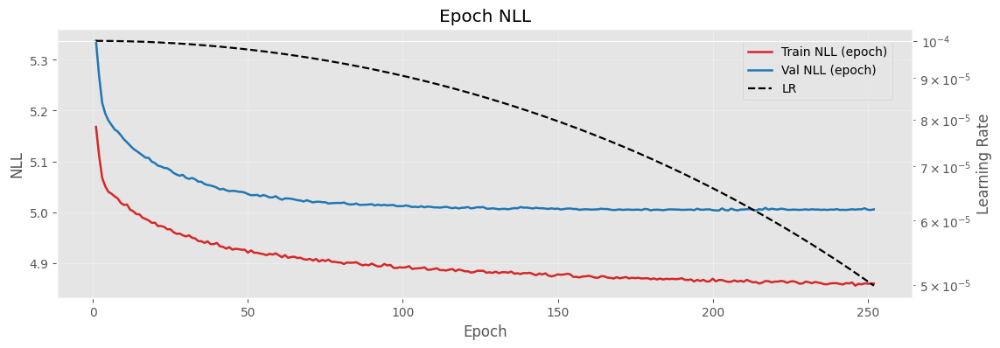

In [935]:
plot_loss(hist_bekk)

In [936]:
sigma_val_scaled_bekk, y_val_scaled_bekk = predict_sigma(bekk_kernel_lstm, vol_val_loader, device=bekk_device)
sigma_val_real_bekk = scale_back(sigma_val_scaled_bekk, sigma=sigma, feature_cols=macro_tickers)

sigma_test_scaled_bekk, y_test_scaled_bekk = predict_sigma(bekk_kernel_lstm, vol_test_loader, device=bekk_device)
sigma_test_real_bekk = scale_back(sigma_test_scaled_bekk, sigma=sigma, feature_cols=macro_tickers)


sigma_train_scaled_bekk, y_train_scaled_bekk = predict_sigma(bekk_kernel_lstm, vol_train_eval_loader, device=bekk_device)
sigma_train_real_bekk = scale_back(sigma_train_scaled_bekk, sigma=sigma, feature_cols=macro_tickers)

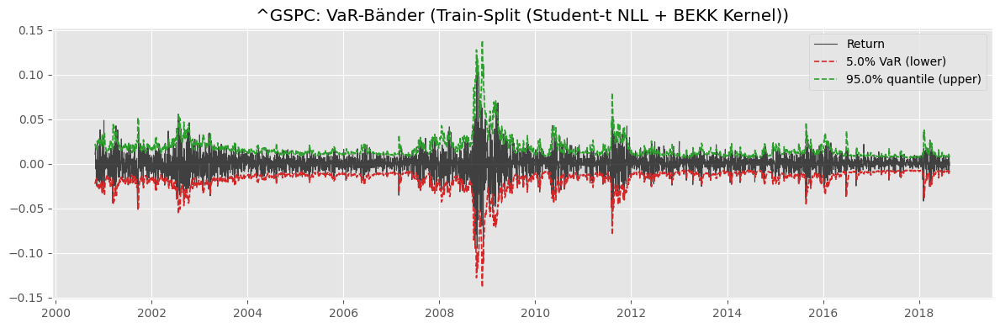

^GSPC: hit rate = 5.114% (target 5.000%)


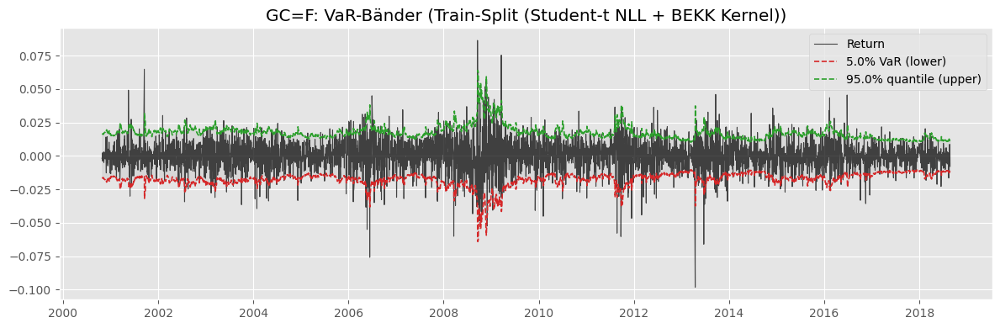

GC=F: hit rate = 4.957% (target 5.000%)


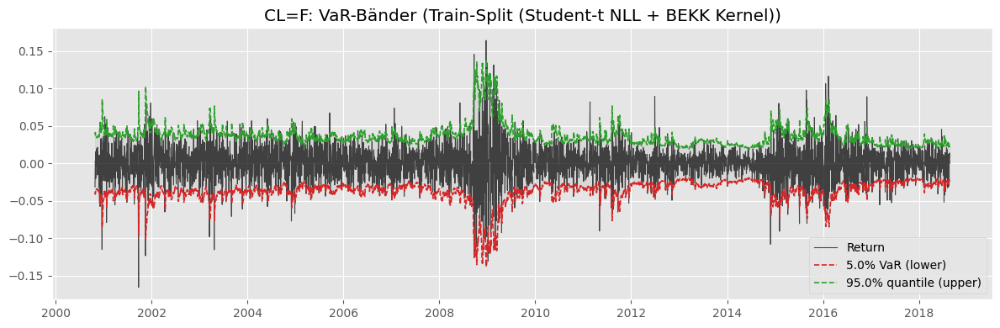

CL=F: hit rate = 4.800% (target 5.000%)


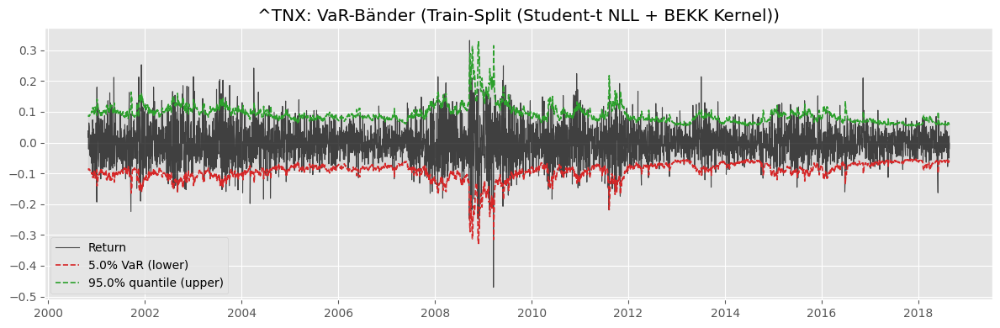

^TNX: hit rate = 4.374% (target 5.000%)


In [937]:
plot_var(alpha=0.05, lookback=lookback, cols=macro_tickers, view="Train-Split (Student-t NLL + BEKK Kernel)", df=train_df, pred_vol=sigma_train_real_bekk, loss_fn=student_nll, loss_kwargs=bekk_student_kwargs)

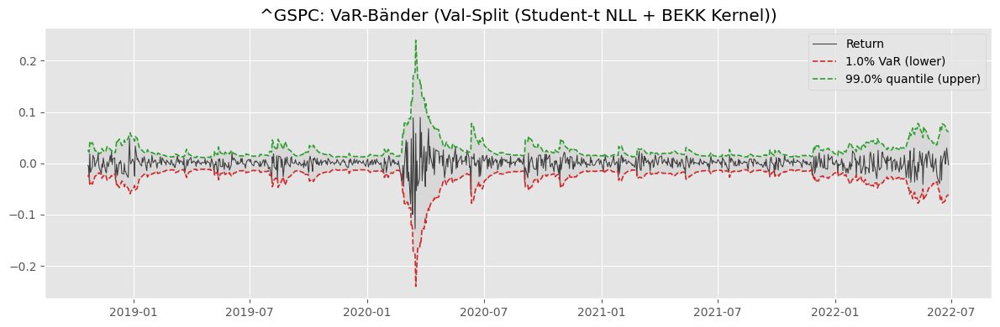

^GSPC: hit rate = 2.165% (target 1.000%)


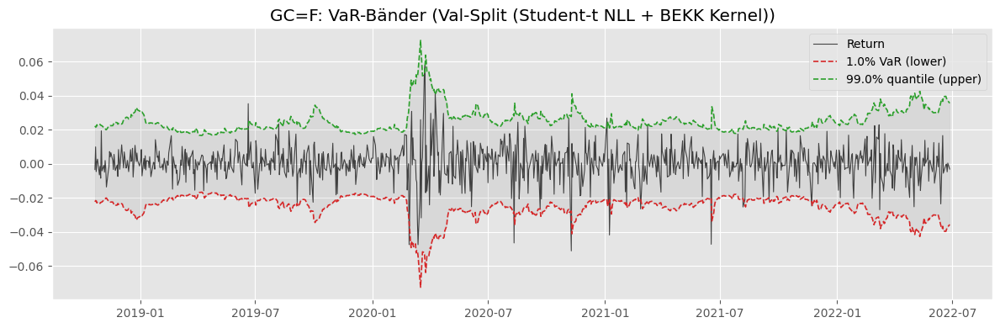

GC=F: hit rate = 1.299% (target 1.000%)


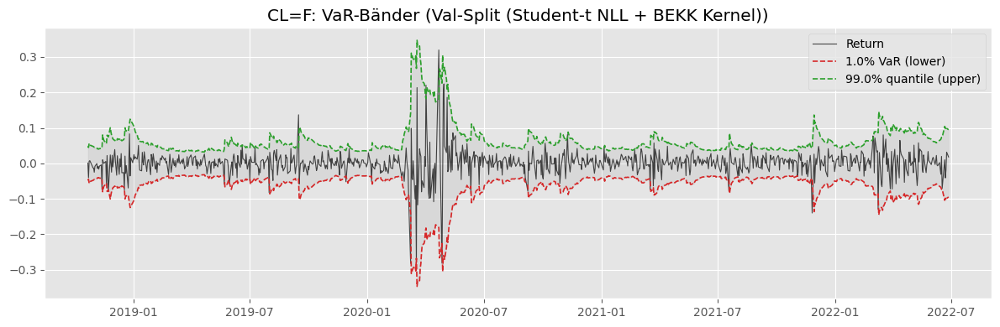

CL=F: hit rate = 2.273% (target 1.000%)


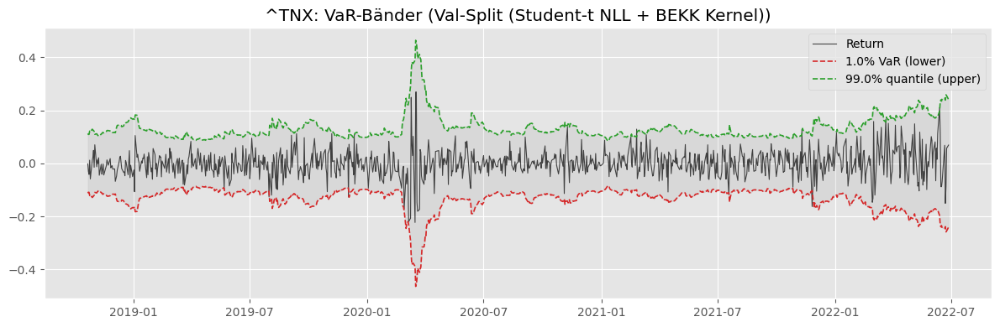

^TNX: hit rate = 0.541% (target 1.000%)


In [938]:
plot_var(alpha=0.01, lookback=lookback, cols=macro_tickers, view="Val-Split (Student-t NLL + BEKK Kernel)", df=val_df, pred_vol=sigma_val_real_bekk, loss_fn=student_nll, loss_kwargs=bekk_student_kwargs)

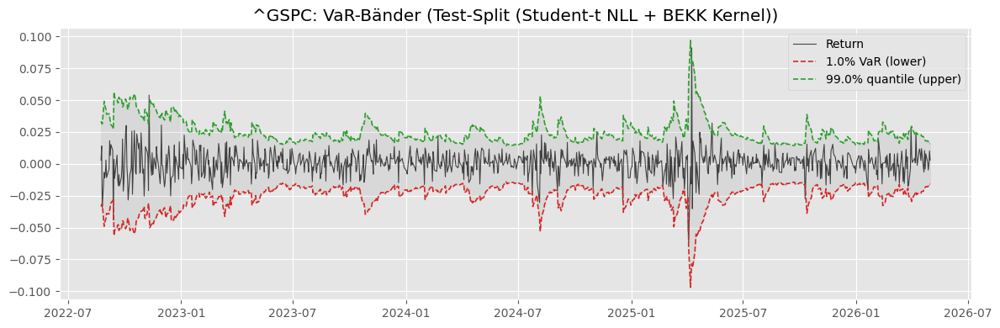

^GSPC: hit rate = 0.865% (target 1.000%)


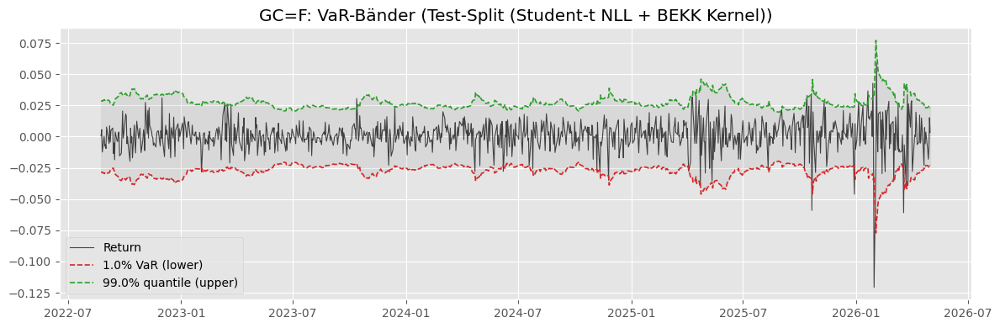

GC=F: hit rate = 1.622% (target 1.000%)


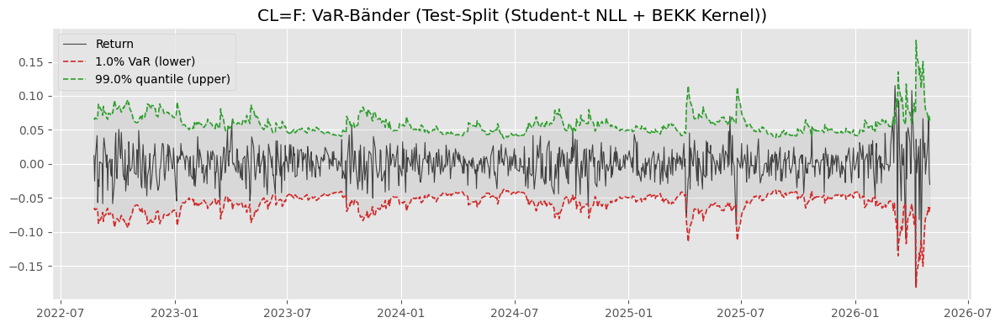

CL=F: hit rate = 0.973% (target 1.000%)


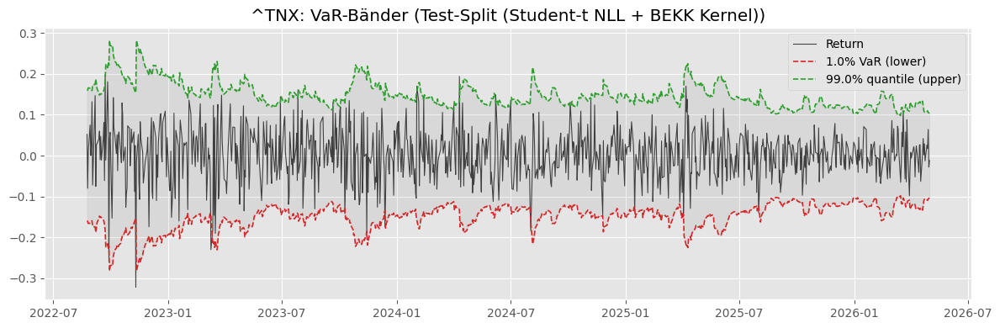

^TNX: hit rate = 1.081% (target 1.000%)


In [939]:
plot_var(alpha=0.01, lookback=lookback, cols=macro_tickers, view="Test-Split (Student-t NLL + BEKK Kernel)", df=test_df, pred_vol=sigma_test_real_bekk, loss_fn=student_nll, loss_kwargs=bekk_student_kwargs)

### Portfolio

In [940]:
idx_test_bekk, rp_test_bekk, varp_test_bekk, volp_test_bekk = calc_portfolio_variance(
    test_df, sigma_test_real_bekk, macro_tickers, lookback, w_np
)

idx_val_bekk, rp_val_bekk, varp_val_bekk, volp_val_bekk = calc_portfolio_variance(
    val_df, sigma_val_real_bekk, macro_tickers, lookback, w_np
)

idx_train_bekk, rp_train_bekk, varp_train_bekk, volp_train_bekk = calc_portfolio_variance(
    train_df, sigma_train_real_bekk, macro_tickers, lookback, w_np
)

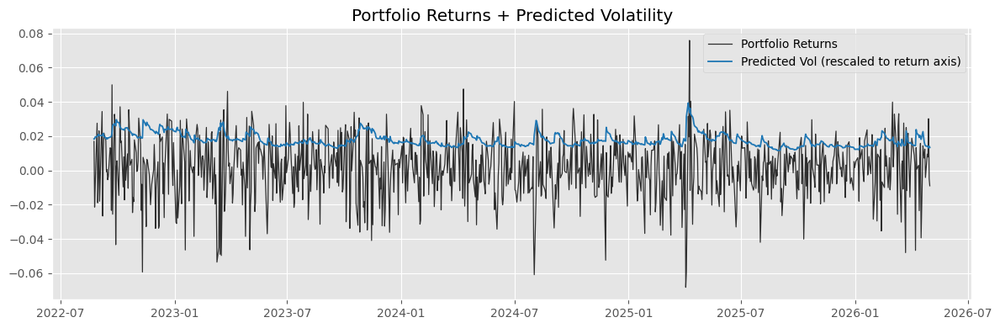

In [941]:
r = np.asarray(rp_test_bekk, dtype=float)
v = np.asarray(volp_test_bekk, dtype=float)

plt.figure(figsize=(12, 4))
plt.plot(idx_test_bekk, r, label="Portfolio Returns", color="black", lw=0.9, alpha=0.8)
plt.plot(idx_test_bekk, v, label="Predicted Vol (rescaled to return axis)", color="tab:blue", lw=1.3)
plt.title("Portfolio Returns + Predicted Volatility")
plt.legend()
plt.tight_layout()
plt.show()

In [942]:
portfolio_test_bekk = make_portfolio_df(idx_test_bekk, rp_test_bekk, varp_test_bekk, volp_test_bekk)
portfolio_val_bekk = make_portfolio_df(idx_val_bekk, rp_val_bekk, varp_val_bekk, volp_val_bekk)
portfolio_train_bekk = make_portfolio_df(idx_train_bekk, rp_train_bekk, varp_train_bekk, volp_train_bekk)

### FHS

In [943]:
z_train_bekk = portfolio_train_bekk["r_p"].values / np.clip(portfolio_train_bekk["vol_p"].values, 1e-12, None) # clip sichert nur nach unten ab (0 division)
z_val_bekk = portfolio_val_bekk["r_p"].values / np.clip(portfolio_val_bekk["vol_p"].values, 1e-12, None)
z_test_bekk = portfolio_test_bekk["r_p"].values / np.clip(portfolio_test_bekk["vol_p"].values, 1e-12, None)
z_train_val_bekk =np.concatenate([z_train_bekk, z_val_bekk])


var_fhs_test_bekk, es_fhs_test_bekk, hits_test_bekk = fhs_var_es(
    z_hist_init=z_train_val_bekk, # nimmt die letzen #window Werte als Historie
    r_oos=portfolio_test_bekk["r_p"].values,
    vol_oos=portfolio_test_bekk["vol_p"].values,
    alpha=alpha,
    window=window
)

hit_rate_test_bekk = hits_test_bekk.mean()
print(f"FHS Test hit rate = {hit_rate_test_bekk:.3%} (target {alpha:.3%})")

FHS Test hit rate = 1.189% (target 1.000%)


In [944]:
len(close)

6430

## Vector Modulation

In [945]:
seed_everything(SEED)
vol_train_loader = DataLoader(vol_train_ds, batch_size=batchsize, shuffle=True, generator=make_generator(SEED))
student_loss_bekk_vec = StudentTLoss(init_nu=8.0, min_nu=2.01, max_nu=100.0)

In [946]:
bekk_kernel_lstm_vec = BEKKLSTM(input_size=(len(macro_tickers)+k), n_assets=len(macro_tickers), hidden_size=hidden_size, asym=True, Sigma0=train_cov, modulation="vector", return_std=sigma[macro_tickers], bekk_scale=100.0, sigma0_in_bekk_scale=False, gate_cov_layernorm=True, init_c_from_sigma0=True, jitter=bekk_jitter)
bekk_kernel_lstm_vec, hist_bekk_vec = train_covariance_model(
    bekk_kernel_lstm_vec,
    vol_train_loader,
    vol_val_loader,
    loss_fn=student_loss_bekk_vec,
    loss_kwargs=None,
    epochs=500,
    lr=bekk_lr,
    plateau_patience=20,
    device=bekk_device,
    scheduler_type="cosine",  # oder "cosine"
    grad_clip_max_norm=0.5,
    early_stopping_patience=early_stopping_patience,
    early_stopping_min_delta=early_stopping_min_delta,
)

save_model_checkpoint(
    model_name="bekk_lstm_vector",
    models_dir=models_dir,
    model=bekk_kernel_lstm_vec,
    history=hist_bekk_vec,
    run_metadata=RUN_METADATA,
    loss_fn=student_loss_bekk_vec,
    config={
        "model_class": "BEKKLSTM",
        "distribution": "student_t",
        "modulation": "vector",
        "asym": True,
        "input_size": len(macro_tickers) + k,
        "n_assets": len(macro_tickers),
        "hidden_size": hidden_size,
        "lookback": lookback,
        "batchsize": batchsize,
        "epochs": 500,
        "lr": bekk_lr,
        "scheduler_type": "cosine",
        "early_stopping_patience": early_stopping_patience,
        "early_stopping_min_delta": early_stopping_min_delta,
        "device": bekk_device,
        "bekk_scale": 100.0,
        "jitter": bekk_jitter,
        "sigma0_in_bekk_scale": False,
        "gate_cov_layernorm": True,
        "init_c_from_sigma0": True,
        "nu": float(student_loss_bekk_vec.nu.detach().cpu()),
    },
)

Epoch 001 | train NLL 5.151262 | val NLL 5.329301 | lr 1.00e-04
Epoch 002 | train NLL 5.073433 | val NLL 5.232879 | lr 1.00e-04
Epoch 003 | train NLL 5.020497 | val NLL 5.184974 | lr 1.00e-04
Epoch 004 | train NLL 4.996551 | val NLL 5.163309 | lr 1.00e-04
Epoch 005 | train NLL 4.979012 | val NLL 5.155260 | lr 1.00e-04
Epoch 006 | train NLL 4.967832 | val NLL 5.115195 | lr 1.00e-04
Epoch 007 | train NLL 4.955240 | val NLL 5.127800 | lr 1.00e-04
Epoch 008 | train NLL 4.946646 | val NLL 5.121046 | lr 9.99e-05
Epoch 009 | train NLL 4.933081 | val NLL 5.087759 | lr 9.99e-05
Epoch 010 | train NLL 4.928473 | val NLL 5.102493 | lr 9.99e-05
Epoch 011 | train NLL 4.928142 | val NLL 5.106653 | lr 9.99e-05
Epoch 012 | train NLL 4.917914 | val NLL 5.087992 | lr 9.99e-05
Epoch 013 | train NLL 4.914076 | val NLL 5.086814 | lr 9.98e-05
Epoch 014 | train NLL 4.910878 | val NLL 5.083656 | lr 9.98e-05
Epoch 015 | train NLL 4.908518 | val NLL 5.070741 | lr 9.98e-05
Epoch 016 | train NLL 4.902544 | val NLL

In [947]:
learned_nu_bekk_vec = float(student_loss_bekk_vec.nu.detach().cpu())
bekk_vec_student_kwargs = {"nu": learned_nu_bekk_vec}

In [948]:
learned_nu_bekk_vec, learned_nu_bekk_vec

(8.041350364685059, 8.041350364685059)

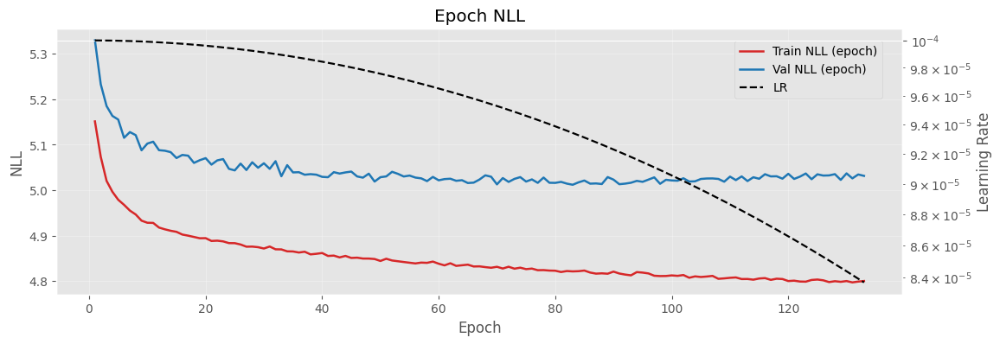

In [949]:
plot_loss(hist_bekk_vec)

In [950]:
sigma_val_scaled_bekk_vec, y_val_scaled_bekk_vec = predict_sigma(bekk_kernel_lstm_vec, vol_val_loader, device=bekk_device)
sigma_val_real_bekk_vec = scale_back(sigma_val_scaled_bekk_vec, sigma=sigma, feature_cols=macro_tickers)

sigma_test_scaled_bekk_vec, y_test_scaled_bekk_vec = predict_sigma(bekk_kernel_lstm_vec, vol_test_loader, device=bekk_device)
sigma_test_real_bekk_vec = scale_back(sigma_test_scaled_bekk_vec, sigma=sigma, feature_cols=macro_tickers)


sigma_train_scaled_bekk_vec, y_train_scaled_bekk_vec = predict_sigma(bekk_kernel_lstm_vec, vol_train_eval_loader, device=bekk_device)
sigma_train_real_bekk_vec = scale_back(sigma_train_scaled_bekk_vec, sigma=sigma, feature_cols=macro_tickers)

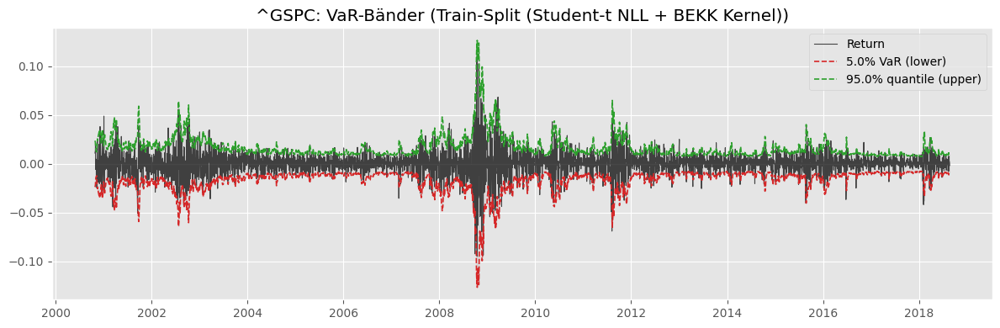

^GSPC: hit rate = 5.585% (target 5.000%)


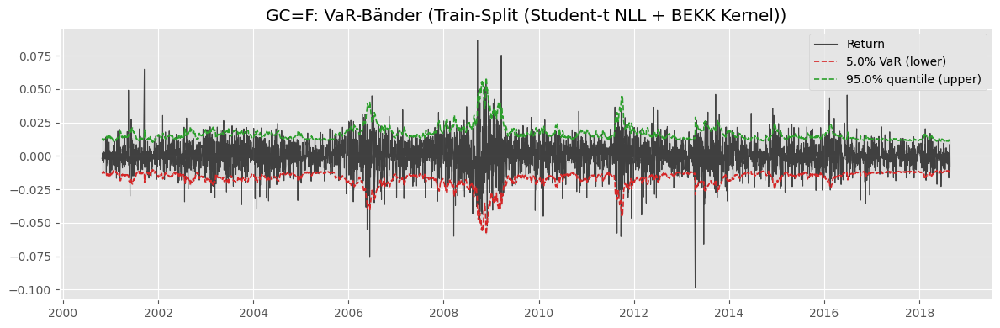

GC=F: hit rate = 5.339% (target 5.000%)


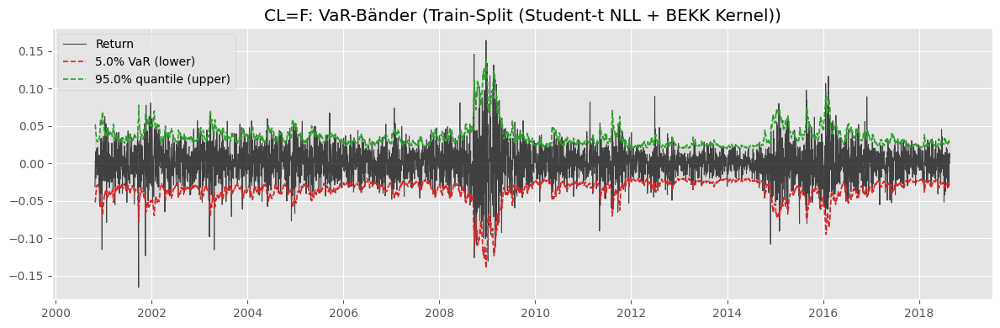

CL=F: hit rate = 5.182% (target 5.000%)


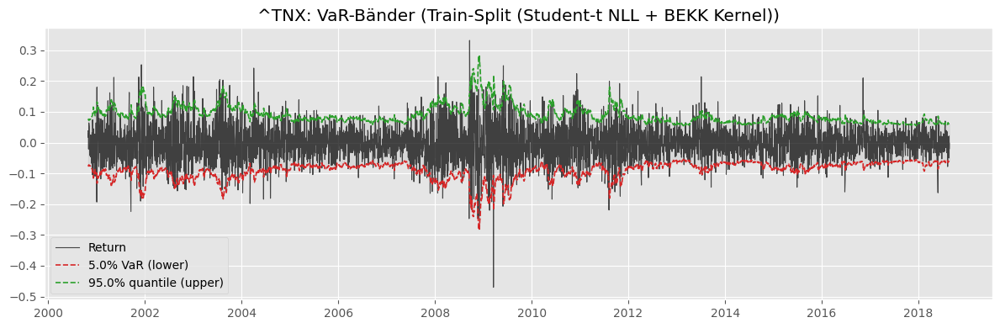

^TNX: hit rate = 4.419% (target 5.000%)


In [951]:
plot_var(alpha=0.05, lookback=lookback, cols=macro_tickers, view="Train-Split (Student-t NLL + BEKK Kernel)", df=train_df, pred_vol=sigma_train_real_bekk_vec, loss_fn=student_nll, loss_kwargs=bekk_vec_student_kwargs)

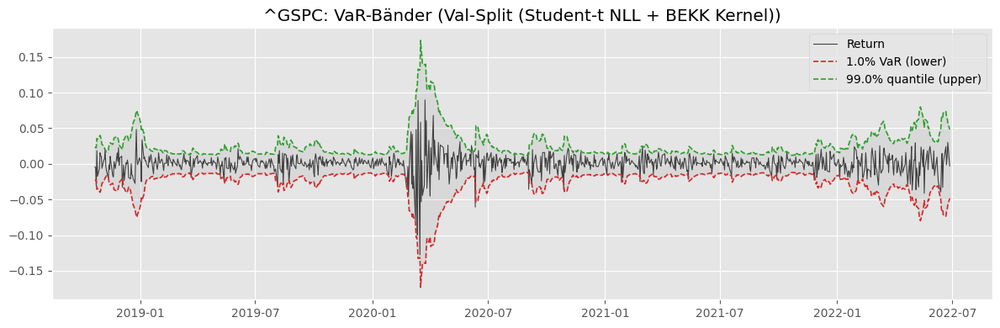

^GSPC: hit rate = 2.706% (target 1.000%)


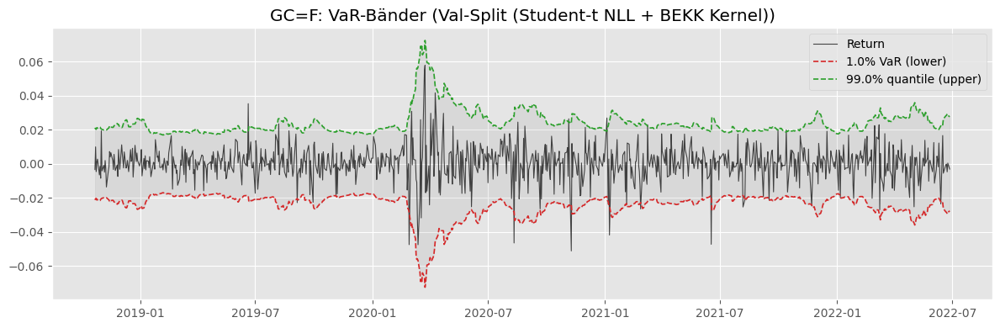

GC=F: hit rate = 1.623% (target 1.000%)


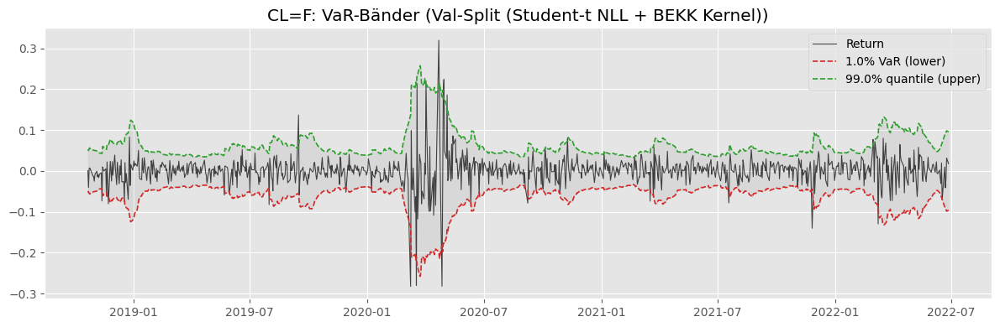

CL=F: hit rate = 2.489% (target 1.000%)


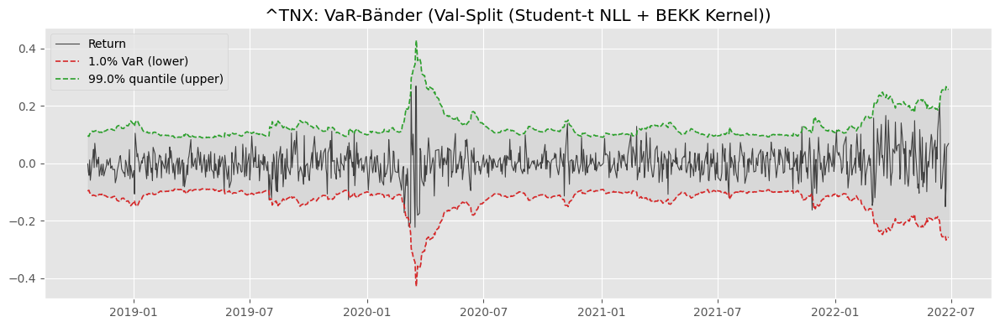

^TNX: hit rate = 0.758% (target 1.000%)


In [952]:
plot_var(alpha=0.01, lookback=lookback, cols=macro_tickers, view="Val-Split (Student-t NLL + BEKK Kernel)", df=val_df, pred_vol=sigma_val_real_bekk_vec, loss_fn=student_nll, loss_kwargs=bekk_vec_student_kwargs)

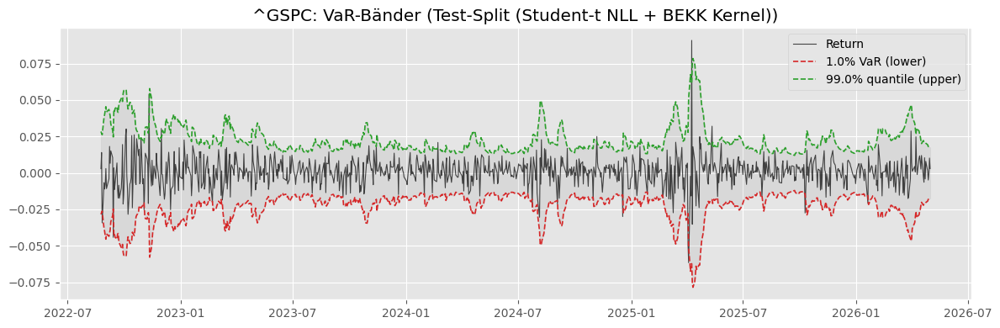

^GSPC: hit rate = 1.730% (target 1.000%)


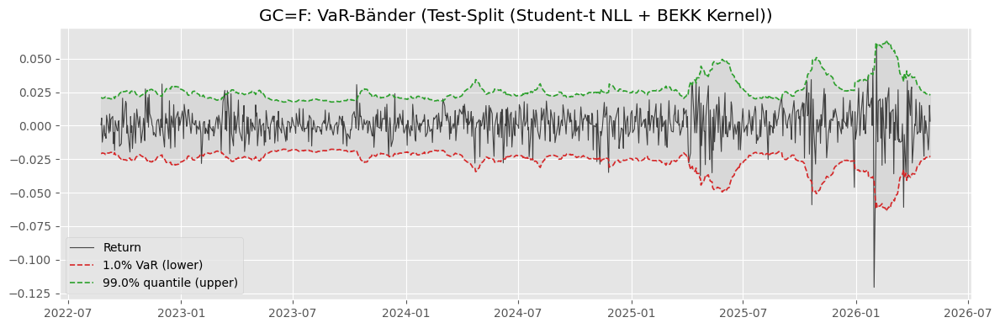

GC=F: hit rate = 1.622% (target 1.000%)


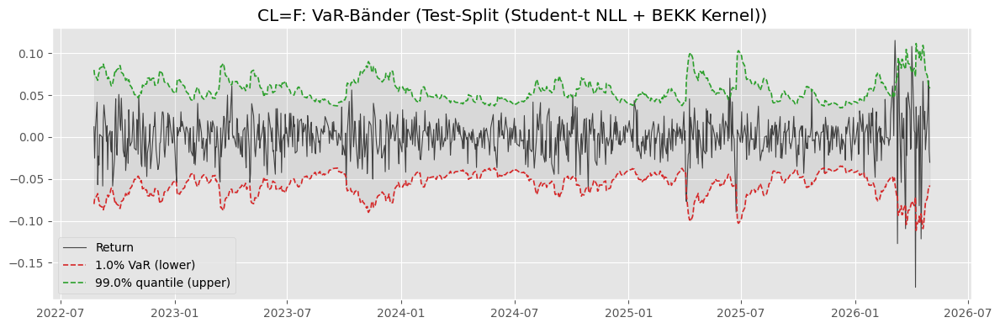

CL=F: hit rate = 1.189% (target 1.000%)


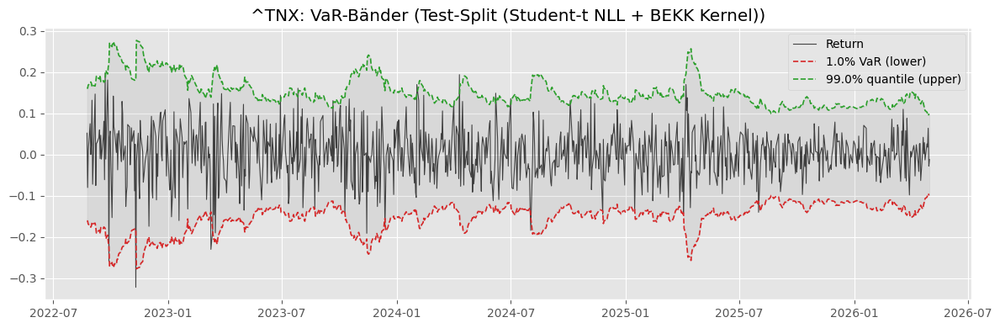

^TNX: hit rate = 1.081% (target 1.000%)


In [953]:
plot_var(alpha=0.01, lookback=lookback, cols=macro_tickers, view="Test-Split (Student-t NLL + BEKK Kernel)", df=test_df, pred_vol=sigma_test_real_bekk_vec, loss_fn=student_nll, loss_kwargs=bekk_vec_student_kwargs)

### Portfolio

In [954]:
idx_test_bekk_vec, rp_test_bekk_vec, varp_test_bekk_vec, volp_test_bekk_vec = calc_portfolio_variance(
    test_df, sigma_test_real_bekk_vec, macro_tickers, lookback, w_np
)

idx_val_bekk_vec, rp_val_bekk_vec, varp_val_bekk_vec, volp_val_bekk_vec = calc_portfolio_variance(
    val_df, sigma_val_real_bekk_vec, macro_tickers, lookback, w_np
)

idx_train_bekk_vec, rp_train_bekk_vec, varp_train_bekk_vec, volp_train_bekk_vec = calc_portfolio_variance(
    train_df, sigma_train_real_bekk_vec, macro_tickers, lookback, w_np
)

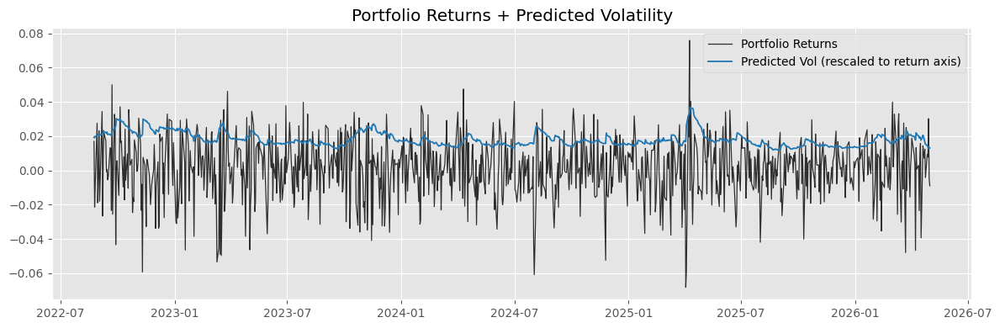

In [955]:
r = np.asarray(rp_test_bekk_vec, dtype=float)
v = np.asarray(volp_test_bekk_vec, dtype=float)

plt.figure(figsize=(12, 4))
plt.plot(idx_test_bekk_vec, r, label="Portfolio Returns", color="black", lw=0.9, alpha=0.8)
plt.plot(idx_test_bekk_vec, v, label="Predicted Vol (rescaled to return axis)", color="tab:blue", lw=1.3)
plt.title("Portfolio Returns + Predicted Volatility")
plt.legend()
plt.tight_layout()
plt.show()

In [956]:
portfolio_test_bekk_vec = make_portfolio_df(idx_test_bekk_vec, rp_test_bekk_vec, varp_test_bekk_vec, volp_test_bekk_vec)
portfolio_val_bekk_vec = make_portfolio_df(idx_val_bekk_vec, rp_val_bekk_vec, varp_val_bekk_vec, volp_val_bekk_vec)
portfolio_train_bekk_vec = make_portfolio_df(idx_train_bekk_vec, rp_train_bekk_vec, varp_train_bekk_vec, volp_train_bekk_vec)

### FHS

In [957]:
z_train_bekk_vec = portfolio_train_bekk_vec["r_p"].values / np.clip(portfolio_train_bekk_vec["vol_p"].values, 1e-12, None) # clip sichert nur nach unten ab (0 division)
z_val_bekk_vec = portfolio_val_bekk_vec["r_p"].values / np.clip(portfolio_val_bekk_vec["vol_p"].values, 1e-12, None)
z_test_bekk_vec = portfolio_test_bekk_vec["r_p"].values / np.clip(portfolio_test_bekk_vec["vol_p"].values, 1e-12, None)
z_train_val_bekk_vec =np.concatenate([z_train_bekk_vec, z_val_bekk_vec])


var_fhs_test_bekk_vec, es_fhs_test_bekk_vec, hits_test_bekk_vec = fhs_var_es(
    z_hist_init=z_train_val_bekk_vec, # nimmt die letzen #window Werte als Historie
    r_oos=portfolio_test_bekk_vec["r_p"].values,
    vol_oos=portfolio_test_bekk_vec["vol_p"].values,
    alpha=alpha,
    window=window
)

hit_rate_test_bekk_vec = hits_test_bekk_vec.mean()
print(f"FHS Test hit rate = {hit_rate_test_bekk_vec:.3%} (target {alpha:.3%})")

FHS Test hit rate = 1.189% (target 1.000%)


In [958]:
len(close)

6430

### Backtesting

!!! Backtestings müssen mit dem selben $\alpha$ vorgenommen werden wie mit FHS !!!

Backtests sind für univariate Zeitreihen definiert, d.h. wir testen alle Modelle im Kontext eines vordefinierten Portfolios.

In [959]:
results_bekk_vec = run_backtest_suite(
    returns=portfolio_test_bekk_vec["r_p"].values,
    var=var_fhs_test_bekk_vec,
    es=es_fhs_test_bekk_vec,
    alpha=alpha,
    volatility=portfolio_test_bekk_vec["vol_p"].values,
)

results_bekk_vec

{'meta': {'alpha': 0.01, 'n_obs': 925},
 'var': {'kupiec': {'test': 'kupiec_uc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 11,
   'expected_exceptions': 9.25,
   'hit_rate': 0.011891891891891892,
   'lr_uc': 0.31532425370244255,
   'p_value': 0.5744312405273544},
  'christoffersen': {'test': 'christoffersen_cc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 11,
   'hit_rate': 0.011891891891891892,
   'transition_counts': {'n00': 903, 'n01': 10, 'n10': 10, 'n11': 1},
   'transition_probs': {'pi_01': 0.01095290251916758,
    'pi_11': 0.09090909090909091,
    'pi_pooled': 0.011904761904761904},
   'lr_ind': 2.4714156487165866,
   'p_value_ind': 0.11593346518086627,
   'lr_uc': 0.31532425370244255,
   'lr_cc': 2.786739902419029,
   'p_value_cc': 0.2482373457408814},
  'dq': {'test': 'dynamic_quantile',
   'implementation': 'segMGarch::DQtest',
   'alpha': 0.01,
   'var_level': 0.99,
   'n_obs': 921,
   'n_exceptions': 11,
   'expected_exceptions': 9.21,
   'hit_rate': 0

## Convex Mixture Modulation

In [960]:
seed_everything(SEED)
vol_train_loader = DataLoader(vol_train_ds, batch_size=batchsize, shuffle=True, generator=make_generator(SEED))
student_loss_bekk_mix = StudentTLoss(init_nu=8.0, min_nu=2.01, max_nu=100.0)

In [961]:
bekk_kernel_lstm_mix = BEKKLSTM(input_size=(len(macro_tickers)+k), n_assets=len(macro_tickers), hidden_size=hidden_size, asym=True, Sigma0=train_cov, modulation="convex_mixture", return_std=sigma[macro_tickers], bekk_scale=100.0, sigma0_in_bekk_scale=False, gate_cov_layernorm=True, init_c_from_sigma0=True, jitter=bekk_jitter)
bekk_kernel_lstm_mix, hist_bekk_mix = train_covariance_model(
    bekk_kernel_lstm_mix,
    vol_train_loader,
    vol_val_loader,
    loss_fn=student_loss_bekk_mix,
    loss_kwargs=None,
    epochs=500,
    lr=bekk_mix_lr,
    plateau_patience=20,
    device=bekk_device,
    scheduler_type="cosine",  # oder "cosine"
    grad_clip_max_norm=0.5,
    early_stopping_patience=early_stopping_patience,
    early_stopping_min_delta=early_stopping_min_delta,
)

save_model_checkpoint(
    model_name="bekk_lstm_mix",
    models_dir=models_dir,
    model=bekk_kernel_lstm_mix,
    history=hist_bekk_mix,
    run_metadata=RUN_METADATA,
    loss_fn=student_loss_bekk_mix,
    config={
        "model_class": "BEKKLSTM",
        "distribution": "student_t",
        "modulation": "convex_mixture",
        "asym": True,
        "input_size": len(macro_tickers) + k,
        "n_assets": len(macro_tickers),
        "hidden_size": hidden_size,
        "lookback": lookback,
        "batchsize": batchsize,
        "epochs": 500,
        "lr": bekk_mix_lr,
        "scheduler_type": "cosine",
        "early_stopping_patience": early_stopping_patience,
        "early_stopping_min_delta": early_stopping_min_delta,
        "device": bekk_device,
        "bekk_scale": 100.0,
        "jitter": bekk_jitter,
        "sigma0_in_bekk_scale": False,
        "gate_cov_layernorm": True,
        "convex_mixture_nn_on_bekk_scale": True,
        "init_c_from_sigma0": True,
        "nu": float(student_loss_bekk_mix.nu.detach().cpu()),
    },
)

Epoch 001 | train NLL 5.205969 | val NLL 5.414951 | lr 5.00e-05
Epoch 002 | train NLL 5.197796 | val NLL 5.408117 | lr 5.00e-05
Epoch 003 | train NLL 5.191671 | val NLL 5.400071 | lr 5.00e-05
Epoch 004 | train NLL 5.187950 | val NLL 5.392931 | lr 5.00e-05
Epoch 005 | train NLL 5.177985 | val NLL 5.383490 | lr 5.00e-05
Epoch 006 | train NLL 5.173176 | val NLL 5.374103 | lr 5.00e-05
Epoch 007 | train NLL 5.164339 | val NLL 5.362185 | lr 5.00e-05
Epoch 008 | train NLL 5.156734 | val NLL 5.351223 | lr 5.00e-05
Epoch 009 | train NLL 5.141543 | val NLL 5.336978 | lr 5.00e-05
Epoch 010 | train NLL 5.130347 | val NLL 5.319942 | lr 5.00e-05
Epoch 011 | train NLL 5.123552 | val NLL 5.304076 | lr 4.99e-05
Epoch 012 | train NLL 5.105024 | val NLL 5.292179 | lr 4.99e-05
Epoch 013 | train NLL 5.095966 | val NLL 5.279607 | lr 4.99e-05
Epoch 014 | train NLL 5.082825 | val NLL 5.265800 | lr 4.99e-05
Epoch 015 | train NLL 5.076607 | val NLL 5.256002 | lr 4.99e-05
Epoch 016 | train NLL 5.062119 | val NLL

In [962]:
learned_nu_bekk_mix = float(student_loss_bekk_mix.nu.detach().cpu())
bekk_mix_student_kwargs = {"nu": learned_nu_bekk_mix}

In [963]:
learned_nu_bekk_vec, learned_nu_bekk_mix

(8.041350364685059, 8.083785057067871)

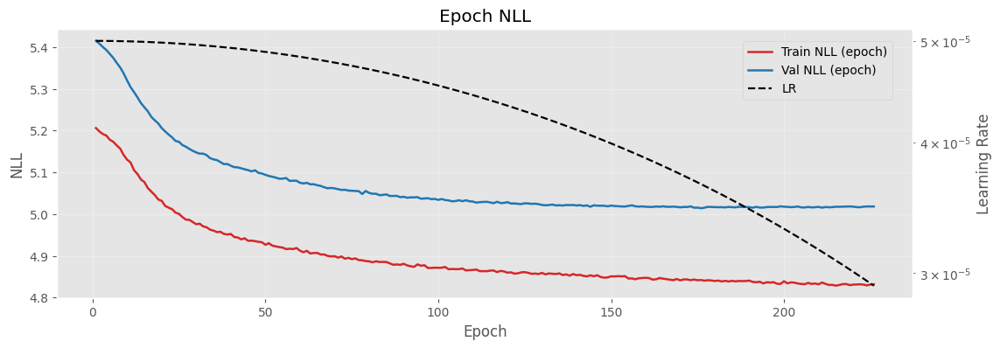

In [964]:
plot_loss(hist_bekk_mix)

In [965]:
sigma_val_scaled_bekk_mix, y_val_scaled_bekk_mix = predict_sigma(bekk_kernel_lstm_mix, vol_val_loader, device=bekk_device)
sigma_val_real_bekk_mix = scale_back(sigma_val_scaled_bekk_mix, sigma=sigma, feature_cols=macro_tickers)

sigma_test_scaled_bekk_mix, y_test_scaled_bekk_mix = predict_sigma(bekk_kernel_lstm_mix, vol_test_loader, device=bekk_device)
sigma_test_real_bekk_mix = scale_back(sigma_test_scaled_bekk_mix, sigma=sigma, feature_cols=macro_tickers)


sigma_train_scaled_bekk_mix, y_train_scaled_bekk_mix = predict_sigma(bekk_kernel_lstm_mix, vol_train_eval_loader, device=bekk_device)
sigma_train_real_bekk_mix = scale_back(sigma_train_scaled_bekk_mix, sigma=sigma, feature_cols=macro_tickers)

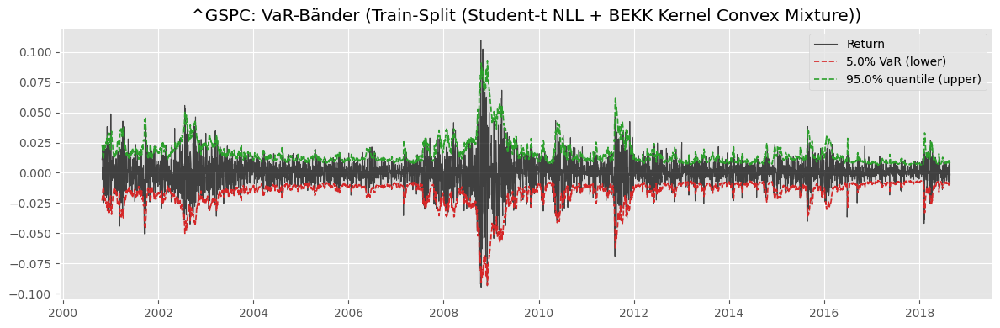

^GSPC: hit rate = 5.653% (target 5.000%)


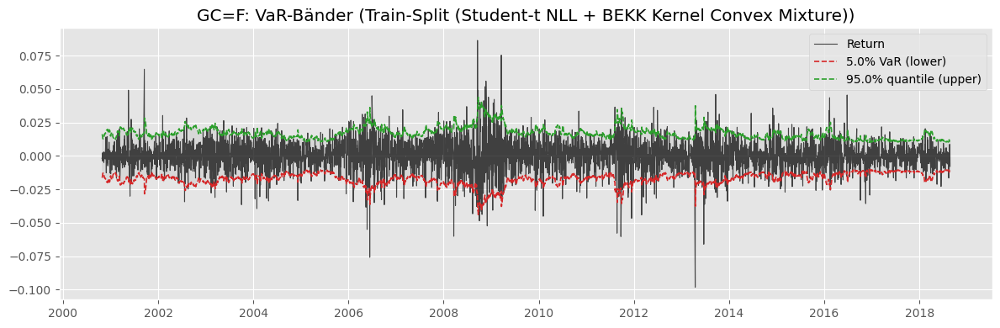

GC=F: hit rate = 5.227% (target 5.000%)


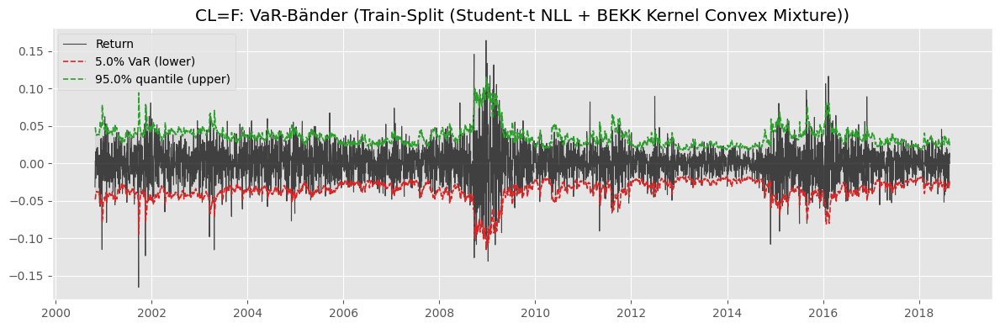

CL=F: hit rate = 5.070% (target 5.000%)


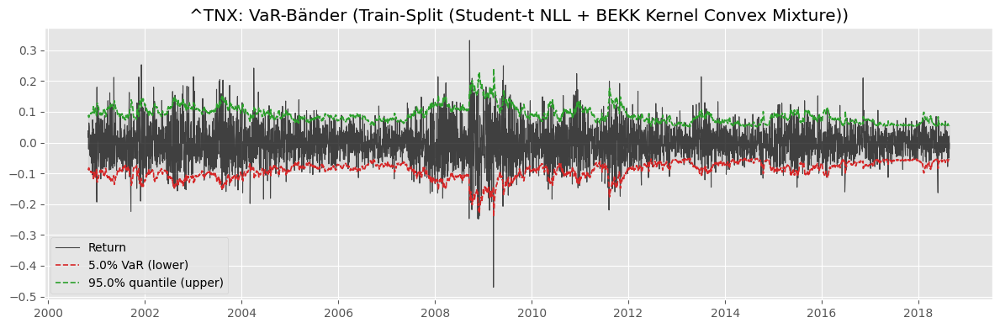

^TNX: hit rate = 4.509% (target 5.000%)


In [966]:
plot_var(alpha=0.05, lookback=lookback, cols=macro_tickers, view="Train-Split (Student-t NLL + BEKK Kernel Convex Mixture)", df=train_df, pred_vol=sigma_train_real_bekk_mix, loss_fn=student_nll, loss_kwargs=bekk_mix_student_kwargs)

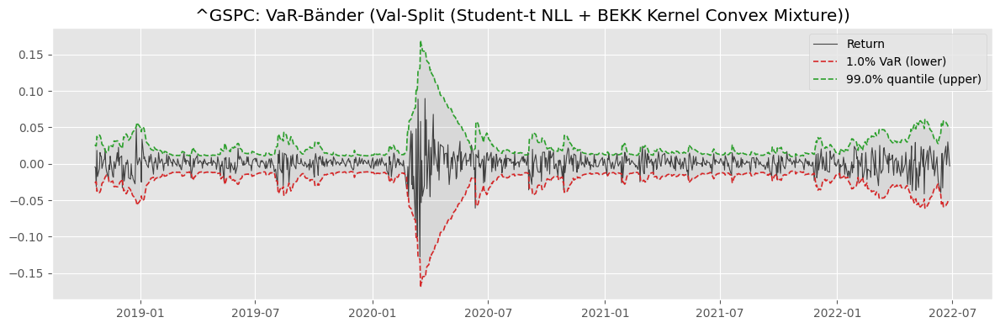

^GSPC: hit rate = 2.706% (target 1.000%)


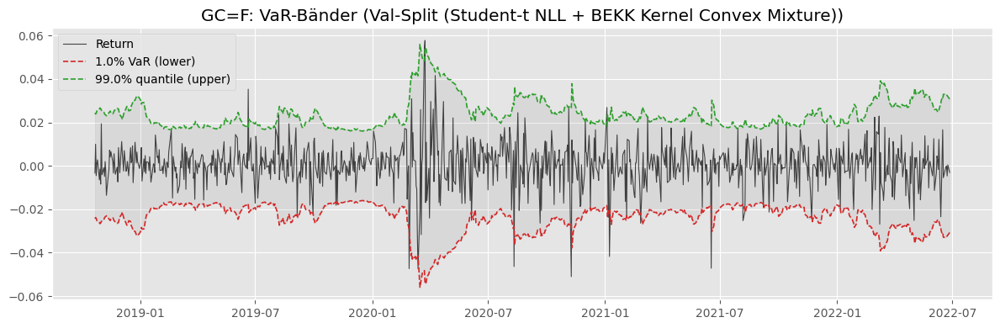

GC=F: hit rate = 2.273% (target 1.000%)


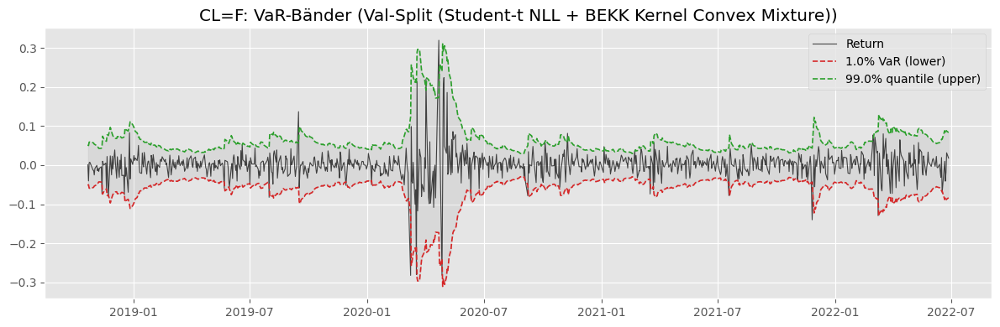

CL=F: hit rate = 2.273% (target 1.000%)


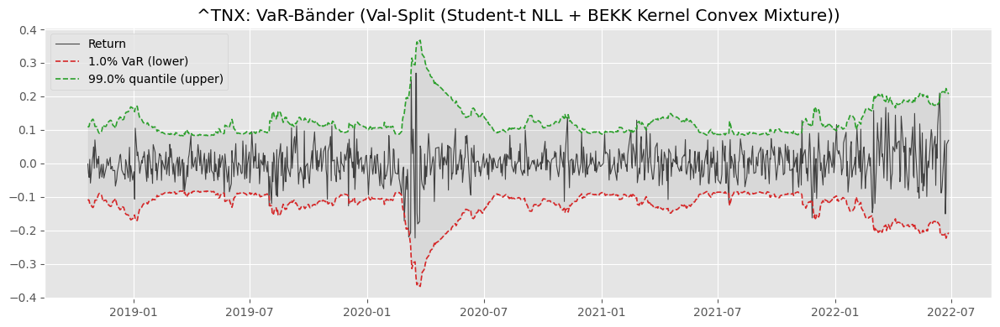

^TNX: hit rate = 0.866% (target 1.000%)


In [967]:
plot_var(alpha=0.01, lookback=lookback, cols=macro_tickers, view="Val-Split (Student-t NLL + BEKK Kernel Convex Mixture)", df=val_df, pred_vol=sigma_val_real_bekk_mix, loss_fn=student_nll, loss_kwargs=bekk_mix_student_kwargs)

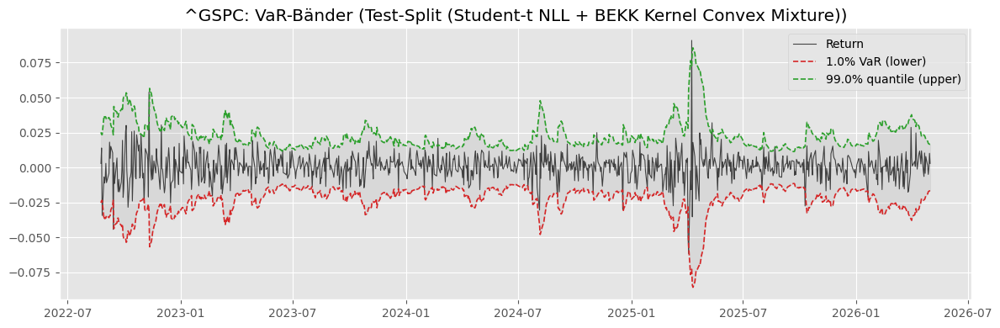

^GSPC: hit rate = 1.838% (target 1.000%)


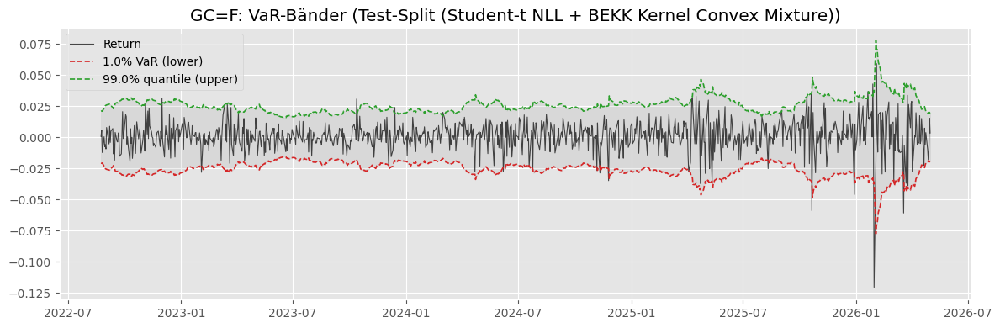

GC=F: hit rate = 1.622% (target 1.000%)


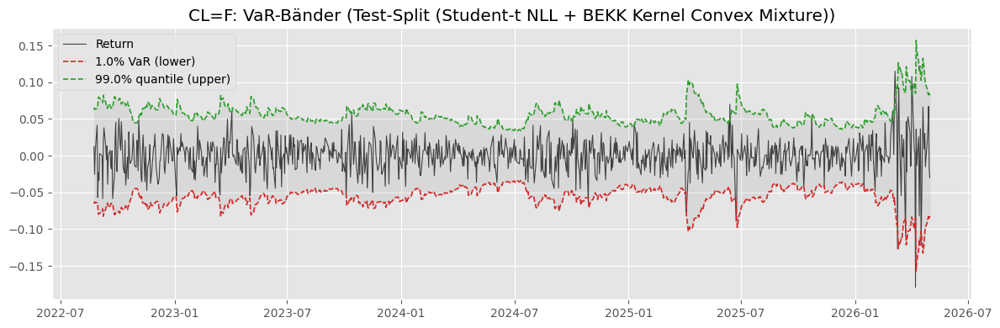

CL=F: hit rate = 1.189% (target 1.000%)


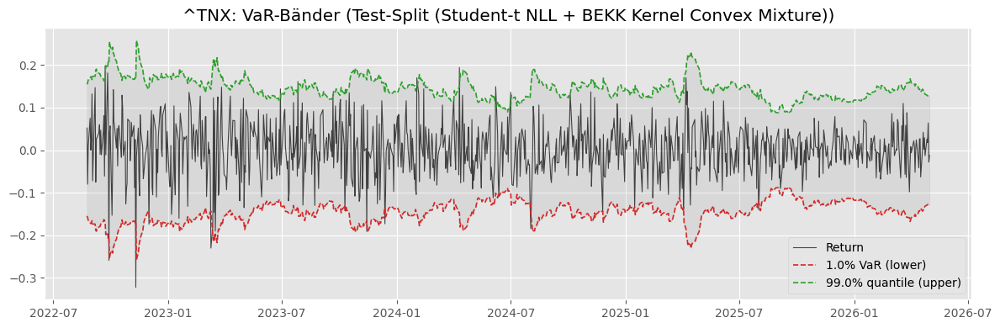

^TNX: hit rate = 1.514% (target 1.000%)


In [968]:
plot_var(alpha=0.01, lookback=lookback, cols=macro_tickers, view="Test-Split (Student-t NLL + BEKK Kernel Convex Mixture)", df=test_df, pred_vol=sigma_test_real_bekk_mix, loss_fn=student_nll, loss_kwargs=bekk_mix_student_kwargs)

### Portfolio

In [969]:
idx_test_bekk_mix, rp_test_bekk_mix, varp_test_bekk_mix, volp_test_bekk_mix = calc_portfolio_variance(
    test_df, sigma_test_real_bekk_mix, macro_tickers, lookback, w_np
)

idx_val_bekk_mix, rp_val_bekk_mix, varp_val_bekk_mix, volp_val_bekk_mix = calc_portfolio_variance(
    val_df, sigma_val_real_bekk_mix, macro_tickers, lookback, w_np
)

idx_train_bekk_mix, rp_train_bekk_mix, varp_train_bekk_mix, volp_train_bekk_mix = calc_portfolio_variance(
    train_df, sigma_train_real_bekk_mix, macro_tickers, lookback, w_np
)

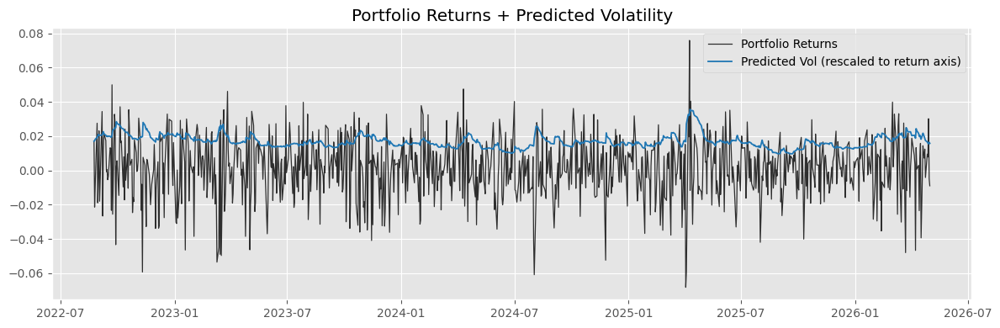

In [970]:
r = np.asarray(rp_test_bekk_mix, dtype=float)
v = np.asarray(volp_test_bekk_mix, dtype=float)

plt.figure(figsize=(12, 4))
plt.plot(idx_test_bekk_mix, r, label="Portfolio Returns", color="black", lw=0.9, alpha=0.8)
plt.plot(idx_test_bekk_mix, v, label="Predicted Vol (rescaled to return axis)", color="tab:blue", lw=1.3)
plt.title("Portfolio Returns + Predicted Volatility")
plt.legend()
plt.tight_layout()
plt.show()

In [971]:
portfolio_test_bekk_mix = make_portfolio_df(idx_test_bekk_mix, rp_test_bekk_mix, varp_test_bekk_mix, volp_test_bekk_mix)
portfolio_val_bekk_mix = make_portfolio_df(idx_val_bekk_mix, rp_val_bekk_mix, varp_val_bekk_mix, volp_val_bekk_mix)
portfolio_train_bekk_mix = make_portfolio_df(idx_train_bekk_mix, rp_train_bekk_mix, varp_train_bekk_mix, volp_train_bekk_mix)

### FHS

In [972]:
z_train_bekk_mix = portfolio_train_bekk_mix["r_p"].values / np.clip(portfolio_train_bekk_mix["vol_p"].values, 1e-12, None) # clip sichert nur nach unten ab (0 division)
z_val_bekk_mix = portfolio_val_bekk_mix["r_p"].values / np.clip(portfolio_val_bekk_mix["vol_p"].values, 1e-12, None)
z_test_bekk_mix = portfolio_test_bekk_mix["r_p"].values / np.clip(portfolio_test_bekk_mix["vol_p"].values, 1e-12, None)
z_train_val_bekk_mix =np.concatenate([z_train_bekk_mix, z_val_bekk_mix])


var_fhs_test_bekk_mix, es_fhs_test_bekk_mix, hits_test_bekk_mix = fhs_var_es(
    z_hist_init=z_train_val_bekk_mix, # nimmt die letzen #window Werte als Historie
    r_oos=portfolio_test_bekk_mix["r_p"].values,
    vol_oos=portfolio_test_bekk_mix["vol_p"].values,
    alpha=alpha,
    window=window
)

hit_rate_test_bekk_mix = hits_test_bekk_mix.mean()
print(f"FHS Test hit rate = {hit_rate_test_bekk_mix:.3%} (target {alpha:.3%})")

FHS Test hit rate = 0.973% (target 1.000%)


### Backtesting

!!! Backtestings müssen mit dem selben $\alpha$ vorgenommen werden wie mit FHS !!!

Backtests sind für univariate Zeitreihen definiert, d.h. wir testen alle Modelle im Kontext eines vordefinierten Portfolios.

In [973]:
results_bekk_mix = run_backtest_suite(
    returns=portfolio_test_bekk_mix["r_p"].values,
    var=var_fhs_test_bekk_mix,
    es=es_fhs_test_bekk_mix,
    alpha=alpha,
    volatility=portfolio_test_bekk_mix["vol_p"].values,
)

results_bekk_mix

{'meta': {'alpha': 0.01, 'n_obs': 925},
 'var': {'kupiec': {'test': 'kupiec_uc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 9,
   'expected_exceptions': 9.25,
   'hit_rate': 0.00972972972972973,
   'lr_uc': 0.006886708472265468,
   'p_value': 0.9338625169657003},
  'christoffersen': {'test': 'christoffersen_cc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 9,
   'hit_rate': 0.00972972972972973,
   'transition_counts': {'n00': 907, 'n01': 8, 'n10': 8, 'n11': 1},
   'transition_probs': {'pi_01': 0.008743169398907104,
    'pi_11': 0.1111111111111111,
    'pi_pooled': 0.00974025974025974},
   'lr_ind': 3.238278543932978,
   'p_value_ind': 0.07193618589473723,
   'lr_uc': 0.006886708472265468,
   'lr_cc': 3.2451652524052435,
   'p_value_cc': 0.19738826013811153},
  'dq': {'test': 'dynamic_quantile',
   'implementation': 'segMGarch::DQtest',
   'alpha': 0.01,
   'var_level': 0.99,
   'n_obs': 921,
   'n_exceptions': 9,
   'expected_exceptions': 9.21,
   'hit_rate': 0.0097

# Neural-BEKK models

**Deterministic Neural-BEKK**

$$\gamma_t = \left(\operatorname{vech}(C_t)^\top, \operatorname{vec}(A_t)^\top, \operatorname{vec}(G_t)^\top, \operatorname{vec}(B_t)^\top \right)^\top = f_\theta(\mathcal F_{t-1})$$

$$H_t =
C_t C_t^\top
+
A_t^\top r_{t-1}r_{t-1}^\top A_t
+
G_t^\top \eta_{t-1}\eta_{t-1}^\top G_t
+
B_t^\top H_{t-1}B_t$$

$$r_t \mid \mathcal F_{t-1}
\sim
t_\nu(0,H_t)$$

**Probabilistic Neural-BEKK with stochastic \(C_t\)**

$$\mu_{C,t},\; s_{C,t},\; A_t,\; G_t,\; B_t =
f_\theta(\mathcal F_{t-1})$$

$$c_t =
\operatorname{vech}(C_t),
\qquad
c_t \mid \mathcal F_{t-1}
\sim
\mathcal N
\left(
\mu_{C,t},
\operatorname{diag}(s_{C,t}^2)
\right)$$

$$H_t^{(m)} = C_t^{(m)} C_t^{(m)\top} + A_t^\top r_{t-1}r_{t-1}^\top A_t + G_t^\top \eta_{t-1}\eta_{t-1}^\top G_t + B_t^\top H_{t-1}B_t$$

$$r_t \mid C_t^{(m)},\mathcal F_{t-1}
\sim
t_\nu(0,H_t^{(m)})$$

$$p(r_t \mid \mathcal F_{t-1})
\approx
\frac{1}{M}
\sum_{m=1}^{M}
t_\nu
\left(
r_t;0,H_t^{(m)}
\right)$$

$$\mathcal L_t = -
\log
\left[
\frac{1}{M}
\sum_{m=1}^{M}
t_\nu
\left(
r_t;0,H_t^{(m)}
\right)
\right]$$

## Deterministic

In [99]:
seed_everything(SEED)
vol_train_loader = DataLoader(vol_train_ds, batch_size=batchsize, shuffle=True, generator=make_generator(SEED))
student_loss_neural_bekk = StudentTLoss(init_nu=8.0, min_nu=2.01, max_nu=100.0)

In [98]:
neural_bekk_asym_diag = NeuralBekk(
    n_assets=len(macro_tickers),
    input_size=(len(macro_tickers) + k),
    hidden_size=hidden_size,
    num_layers=1,
    dropout=dropout,
    bekk_type="diag",
    asym=True,
    Sigma0=train_cov,
    return_std=sigma[macro_tickers],
    bekk_scale=100.0,
    sigma0_in_bekk_scale=False,
    tau_max=0.995,
    c_delta_scale=0.01,
    init_C_from_sigma0=True,
    init_a=0.05,
    init_g=0.90,
    init_b=0.05,
    jitter=bekk_jitter,
)
neural_bekk_asym_diag, hist_neural_bekk = train_covariance_model(
    neural_bekk_asym_diag,
    vol_train_loader,
    vol_val_loader,
    loss_fn=student_loss_neural_bekk,
    loss_kwargs=None,
    epochs=500,
    lr=neural_bekk_lr,
    plateau_patience=20,
    device=bekk_device,
    scheduler_type="cosine",
    grad_clip_max_norm=0.5,
    early_stopping_patience=early_stopping_patience,
    early_stopping_min_delta=early_stopping_min_delta,
)

save_model_checkpoint(
    model_name="neural_bekk_asym_diag",
    models_dir=models_dir,
    model=neural_bekk_asym_diag,
    history=hist_neural_bekk,
    run_metadata=RUN_METADATA,
    loss_fn=student_loss_neural_bekk,
    config={
        "model_class": "NeuralBekk",
        "distribution": "student_t",
        "bekk_type": "diag",
        "asym": True,
        "input_size": len(macro_tickers) + k,
        "n_assets": len(macro_tickers),
        "hidden_size": hidden_size,
        "num_layers": 1,
        "dropout": dropout,
        "lookback": lookback,
        "batchsize": batchsize,
        "epochs": 500,
        "lr": neural_bekk_lr,
        "scheduler_type": "cosine",
        "early_stopping_patience": early_stopping_patience,
        "early_stopping_min_delta": early_stopping_min_delta,
        "device": bekk_device,
        "bekk_scale": 100.0,
        "jitter": bekk_jitter,
        "sigma0_in_bekk_scale": False,
        "tau_max": 0.995,
        "c_delta_scale": 0.01,
        "init_C_from_sigma0": True,
        "init_a": 0.05,
        "recursion_jitter": 0.0,
        "cholesky_jitter": bekk_jitter,
        "init_g": 0.90,
        "init_b": 0.05,
        "nu": float(student_loss_neural_bekk.nu.detach().cpu()),
    },
)

TypeError: NeuralBekk.__init__() got an unexpected keyword argument 'tau_max'

In [ ]:
learned_nu_neural_bekk = float(student_loss_neural_bekk.nu.detach().cpu())
neural_bekk_student_kwargs = {"nu": learned_nu_neural_bekk}
learned_nu_neural_bekk

In [ ]:
plot_loss(hist_neural_bekk)

In [ ]:
sigma_val_scaled_neural_bekk, y_val_scaled_neural_bekk = predict_sigma(neural_bekk_asym_diag, vol_val_loader, device=bekk_device)
sigma_val_real_neural_bekk = scale_back(sigma_val_scaled_neural_bekk, sigma=sigma, feature_cols=macro_tickers)

sigma_test_scaled_neural_bekk, y_test_scaled_neural_bekk = predict_sigma(neural_bekk_asym_diag, vol_test_loader, device=bekk_device)
sigma_test_real_neural_bekk = scale_back(sigma_test_scaled_neural_bekk, sigma=sigma, feature_cols=macro_tickers)

sigma_train_scaled_neural_bekk, y_train_scaled_neural_bekk = predict_sigma(neural_bekk_asym_diag, vol_train_eval_loader, device=bekk_device)
sigma_train_real_neural_bekk = scale_back(sigma_train_scaled_neural_bekk, sigma=sigma, feature_cols=macro_tickers)

In [ ]:
def predict_neural_bekk_params(model, loader, device="cpu"):
    model.eval()
    collected = {
        "C": [],
        "A": [],
        "G": [],
        "B": [],
        "a": [],
        "g": [],
        "b": [],
        "tau": [],
        "weights": [],
    }

    with torch.no_grad():
        for xb, _ in loader:
            xb = xb.to(device)
            _, _, params = model(xb, return_params=True)
            for key in collected:
                if params[key] is not None:
                    collected[key].append(params[key].cpu().numpy())

    return {key: np.concatenate(value, axis=0) for key, value in collected.items() if value}


neural_bekk_test_params = predict_neural_bekk_params(
    neural_bekk_asym_diag,
    vol_test_loader,
    device=bekk_device,
)

neural_bekk_param_npz_path = run_dir / "neural_bekk_asym_diag_test_param_sequences.npz"
np.savez_compressed(neural_bekk_param_npz_path, **neural_bekk_test_params)

neural_bekk_param_columns = {}
for param_name in ("a", "g", "b", "tau"):
    last_step_values = neural_bekk_test_params[param_name][:, -1, :]
    for asset_idx, ticker in enumerate(macro_tickers):
        neural_bekk_param_columns[f"{param_name}_{ticker}"] = last_step_values[:, asset_idx]

last_weights = neural_bekk_test_params["weights"][:, -1, :, :]
for weight_idx, weight_name in enumerate(("a", "g", "b")):
    for asset_idx, ticker in enumerate(macro_tickers):
        neural_bekk_param_columns[f"weight_{weight_name}_{ticker}"] = last_weights[:, asset_idx, weight_idx]

neural_bekk_param_df = pd.DataFrame(
    neural_bekk_param_columns,
    index=test_df.index[lookback:],
)
neural_bekk_param_df.index.name = "Date"
neural_bekk_param_path = run_dir / "neural_bekk_asym_diag_test_params.csv"
neural_bekk_param_df.to_csv(neural_bekk_param_path)
neural_bekk_param_df.head()

In [ ]:
plot_var(alpha=0.05, lookback=lookback, cols=macro_tickers, view="Train-Split (Student-t NLL + Neural Asymmetric Diagonal BEKK)", df=train_df, pred_vol=sigma_train_real_neural_bekk, loss_fn=student_nll, loss_kwargs=neural_bekk_student_kwargs)

In [ ]:
plot_var(alpha=0.01, lookback=lookback, cols=macro_tickers, view="Val-Split (Student-t NLL + Neural Asymmetric Diagonal BEKK)", df=val_df, pred_vol=sigma_val_real_neural_bekk, loss_fn=student_nll, loss_kwargs=neural_bekk_student_kwargs)

In [ ]:
plot_var(alpha=0.01, lookback=lookback, cols=macro_tickers, view="Test-Split (Student-t NLL + Neural Asymmetric Diagonal BEKK)", df=test_df, pred_vol=sigma_test_real_neural_bekk, loss_fn=student_nll, loss_kwargs=neural_bekk_student_kwargs)

### Portfolio

In [ ]:
idx_test_neural_bekk, rp_test_neural_bekk, varp_test_neural_bekk, volp_test_neural_bekk = calc_portfolio_variance(
    test_df, sigma_test_real_neural_bekk, macro_tickers, lookback, w_np
)

idx_val_neural_bekk, rp_val_neural_bekk, varp_val_neural_bekk, volp_val_neural_bekk = calc_portfolio_variance(
    val_df, sigma_val_real_neural_bekk, macro_tickers, lookback, w_np
)

idx_train_neural_bekk, rp_train_neural_bekk, varp_train_neural_bekk, volp_train_neural_bekk = calc_portfolio_variance(
    train_df, sigma_train_real_neural_bekk, macro_tickers, lookback, w_np
)

In [ ]:
r = np.asarray(rp_test_neural_bekk, dtype=float)
v = np.asarray(volp_test_neural_bekk, dtype=float)

plt.figure(figsize=(12, 4))
plt.plot(idx_test_neural_bekk, r, label="Portfolio Returns", color="black", lw=0.9, alpha=0.8)
plt.plot(idx_test_neural_bekk, v, label="Predicted Vol (rescaled to return axis)", color="tab:blue", lw=1.3)
plt.title("Portfolio Returns + Predicted Volatility")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
portfolio_test_neural_bekk = make_portfolio_df(idx_test_neural_bekk, rp_test_neural_bekk, varp_test_neural_bekk, volp_test_neural_bekk)
portfolio_val_neural_bekk = make_portfolio_df(idx_val_neural_bekk, rp_val_neural_bekk, varp_val_neural_bekk, volp_val_neural_bekk)
portfolio_train_neural_bekk = make_portfolio_df(idx_train_neural_bekk, rp_train_neural_bekk, varp_train_neural_bekk, volp_train_neural_bekk)

### FHS

In [ ]:
z_train_neural_bekk = portfolio_train_neural_bekk["r_p"].values / np.clip(portfolio_train_neural_bekk["vol_p"].values, 1e-12, None)
z_val_neural_bekk = portfolio_val_neural_bekk["r_p"].values / np.clip(portfolio_val_neural_bekk["vol_p"].values, 1e-12, None)
z_test_neural_bekk = portfolio_test_neural_bekk["r_p"].values / np.clip(portfolio_test_neural_bekk["vol_p"].values, 1e-12, None)
z_train_val_neural_bekk = np.concatenate([z_train_neural_bekk, z_val_neural_bekk])

var_fhs_test_neural_bekk, es_fhs_test_neural_bekk, hits_test_neural_bekk = fhs_var_es(
    z_hist_init=z_train_val_neural_bekk,
    r_oos=portfolio_test_neural_bekk["r_p"].values,
    vol_oos=portfolio_test_neural_bekk["vol_p"].values,
    alpha=alpha,
    window=window,
)

hit_rate_test_neural_bekk = hits_test_neural_bekk.mean()
print(f"FHS Test hit rate = {hit_rate_test_neural_bekk:.3%} (target {alpha:.3%})")

### Backtesting

In [ ]:
results_neural_bekk_asym_diag = run_backtest_suite(
    returns=portfolio_test_neural_bekk["r_p"].values,
    var=var_fhs_test_neural_bekk,
    es=es_fhs_test_neural_bekk,
    alpha=alpha,
    volatility=portfolio_test_neural_bekk["vol_p"].values,
)

results_neural_bekk_asym_diag

## Probablistic

# GRU for Covariance Matrix

In [974]:
from GRUCovariance import GRUCovariance

In [975]:
# GRU Hyperparameters
gru_lookback = lookback
gru_batchsize = 128
gru_hidden_size = 64
gru_num_layers = 2
gru_dropout = 0.2
gru_epochs = 500
gru_lr = 1e-4

if gru_lookback != lookback:
    raise ValueError(
        "GRU uses the existing SequenceDataset objects. "
        "Keep gru_lookback == lookback or rebuild the datasets/loaders first."
    )

## Helper Functions


In [976]:
gru_split_frames = {
    "train": train_df,
    "val": val_df,
    "test": test_df,
}

gru_eval_loaders = {
    "train": DataLoader(vol_train_ds, batch_size=gru_batchsize, shuffle=False),
    "val": DataLoader(vol_val_ds, batch_size=gru_batchsize, shuffle=False),
    "test": DataLoader(vol_test_ds, batch_size=gru_batchsize, shuffle=False),
}

def fit_gru_model(loss_fn=gaussian_nll, loss_kwargs=None, epochs=gru_epochs, lr=gru_lr):
    k = len(macro_tickers) * (len(macro_tickers) + 1) // 2
    seed_everything(SEED)
    gru_train_loader = DataLoader(
        vol_train_ds,
        batch_size=gru_batchsize,
        shuffle=True,
        generator=make_generator(SEED),
    )
    model = GRUCovariance(
        input_size=len(macro_tickers) + k,
        n_assets=len(macro_tickers),
        hidden_size=gru_hidden_size,
        num_layers=gru_num_layers,
        dropout=gru_dropout,
    )

    model, history = train_covariance_model(
        model,
        gru_train_loader,
        gru_eval_loaders["val"],
        loss_fn=loss_fn,
        loss_kwargs=loss_kwargs,
        epochs=epochs,
        lr=lr,
        plateau_patience=20,
        device=device,
        scheduler_type="cosine",
        early_stopping_patience=early_stopping_patience,
        early_stopping_min_delta=early_stopping_min_delta,
    )

    sigma_train_scaled, y_train_scaled = predict_sigma(model, gru_eval_loaders["train"], device=device)
    sigma_val_scaled, y_val_scaled = predict_sigma(model, gru_eval_loaders["val"], device=device)
    sigma_test_scaled, y_test_scaled = predict_sigma(model, gru_eval_loaders["test"], device=device)

    sigma_splits = {
        "train": scale_back(sigma_train_scaled, sigma=sigma, feature_cols=macro_tickers),
        "val": scale_back(sigma_val_scaled, sigma=sigma, feature_cols=macro_tickers),
        "test": scale_back(sigma_test_scaled, sigma=sigma, feature_cols=macro_tickers),
    }
    y_splits = {
        "train": y_train_scaled,
        "val": y_val_scaled,
        "test": y_test_scaled,
    }
    return model, history, sigma_splits, y_splits

def build_gru_portfolio_splits(sigma_splits, w):
    portfolio_splits = {}
    for split_name, df_split in gru_split_frames.items():
        idx, rp, varp, volp = calc_portfolio_variance(
            df_split,
            sigma_splits[split_name],
            macro_tickers,
            gru_lookback,
            w,
        )
        portfolio_splits[split_name] = make_portfolio_df(idx, rp, varp, volp)
    return portfolio_splits

def standardized_portfolio_returns(portfolio_df):
    return portfolio_df["r_p"].values / np.clip(portfolio_df["vol_p"].values, 1e-12, None)

def run_fhs_pipeline(portfolio_train, portfolio_val, portfolio_test, alpha=0.01, window=1000):
    z_train = standardized_portfolio_returns(portfolio_train)
    z_val = standardized_portfolio_returns(portfolio_val)
    z_test = standardized_portfolio_returns(portfolio_test)
    z_train_val = np.concatenate([z_train, z_val])

    train_burn_in = min(window, len(z_train) - 1)
    if train_burn_in < 1:
        raise ValueError("Training split is too short for FHS burn-in.")

    var_fhs_test, es_fhs_test, hits_test = fhs_var_es(
        z_hist_init=z_train_val,
        r_oos=portfolio_test["r_p"].values,
        vol_oos=portfolio_test["vol_p"].values,
        alpha=alpha,
        window=window,
    )
    var_fhs_val, es_fhs_val, hit_val = fhs_var_es(
        z_hist_init=z_train,
        r_oos=portfolio_val["r_p"].values,
        vol_oos=portfolio_val["vol_p"].values,
        alpha=alpha,
        window=window,
    )
    var_fhs_train, es_fhs_train, hit_train = fhs_var_es(
        z_hist_init=z_train[:train_burn_in],
        r_oos=portfolio_train["r_p"].iloc[train_burn_in:].values,
        vol_oos=portfolio_train["vol_p"].iloc[train_burn_in:].values,
        alpha=alpha,
        window=window,
    )

    return {
        "z": {
            "train": z_train,
            "val": z_val,
            "test": z_test,
            "train_val": z_train_val,
        },
        "burn_in": train_burn_in,
        "train": {"var": var_fhs_train, "es": es_fhs_train, "hits": hit_train},
        "val": {"var": var_fhs_val, "es": es_fhs_val, "hits": hit_val},
        "test": {"var": var_fhs_test, "es": es_fhs_test, "hits": hits_test},
    }

def plot_fhs_var(portfolio_df, var_fhs, alpha, title, start=0):
    idx = portfolio_df.index[start:]
    returns = portfolio_df["r_p"].iloc[start:].values
    plt.figure(figsize=(12, 4))
    plt.plot(idx, returns, color="black", lw=0.8, label="Portfolio Return")
    plt.plot(idx, var_fhs, "--", color="tab:red", lw=1.2, label=f"FHS {alpha:.1%} VaR (lower)")
    plt.fill_between(idx, var_fhs, np.zeros_like(var_fhs), color="tab:red", alpha=0.08)
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

## GRU with Gaussian NLL


Epoch 001 | train NLL 6.535315 | val NLL 8.151506 | lr 1.00e-04
Epoch 002 | train NLL 6.100103 | val NLL 7.409650 | lr 1.00e-04
Epoch 003 | train NLL 5.768015 | val NLL 6.806385 | lr 1.00e-04
Epoch 004 | train NLL 5.520701 | val NLL 6.332276 | lr 1.00e-04
Epoch 005 | train NLL 5.356580 | val NLL 6.022819 | lr 1.00e-04
Epoch 006 | train NLL 5.269768 | val NLL 5.860298 | lr 1.00e-04
Epoch 007 | train NLL 5.207179 | val NLL 5.773374 | lr 1.00e-04
Epoch 008 | train NLL 5.165797 | val NLL 5.748620 | lr 9.99e-05
Epoch 009 | train NLL 5.139564 | val NLL 5.726490 | lr 9.99e-05
Epoch 010 | train NLL 5.122875 | val NLL 5.714032 | lr 9.99e-05
Epoch 011 | train NLL 5.114009 | val NLL 5.696470 | lr 9.99e-05
Epoch 012 | train NLL 5.104562 | val NLL 5.676244 | lr 9.99e-05
Epoch 013 | train NLL 5.097451 | val NLL 5.651749 | lr 9.98e-05
Epoch 014 | train NLL 5.089520 | val NLL 5.639015 | lr 9.98e-05
Epoch 015 | train NLL 5.086337 | val NLL 5.620905 | lr 9.98e-05
Epoch 016 | train NLL 5.076226 | val NLL

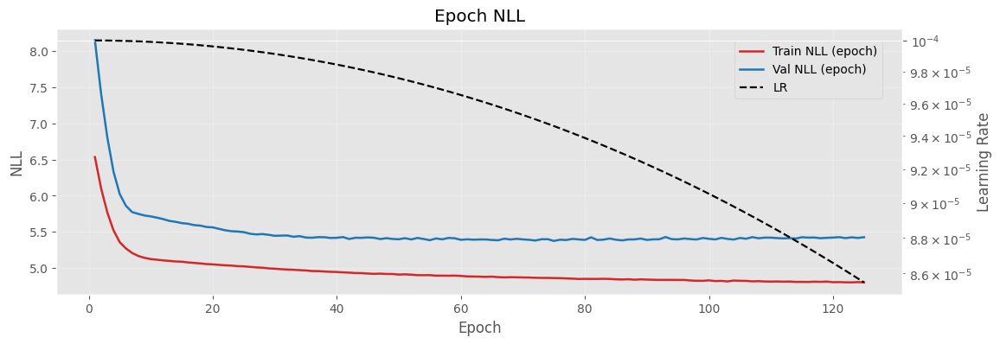

In [977]:
gru_model, gru_hist, gru_sigma_splits, gru_y_splits = fit_gru_model(loss_fn=gaussian_nll)

gru_sigma_train_real = gru_sigma_splits["train"]
gru_sigma_val_real = gru_sigma_splits["val"]
gru_sigma_test_real = gru_sigma_splits["test"]

save_model_checkpoint(
    model_name="gru_normal",
    models_dir=models_dir,
    model=gru_model,
    history=gru_hist,
    run_metadata=RUN_METADATA,
    loss_fn=None,
    config={
        "model_class": "GRUCovariance",
        "distribution": "gaussian",
        "input_size": len(macro_tickers) + k,
        "n_assets": len(macro_tickers),
        "hidden_size": gru_hidden_size,
        "num_layers": gru_num_layers,
        "dropout": gru_dropout,
        "lookback": gru_lookback,
        "batchsize": gru_batchsize,
        "epochs": gru_epochs,
        "lr": gru_lr,
        "scheduler_type": "cosine",
        "early_stopping_patience": early_stopping_patience,
        "early_stopping_min_delta": early_stopping_min_delta,
    },
)

plot_loss(gru_hist)

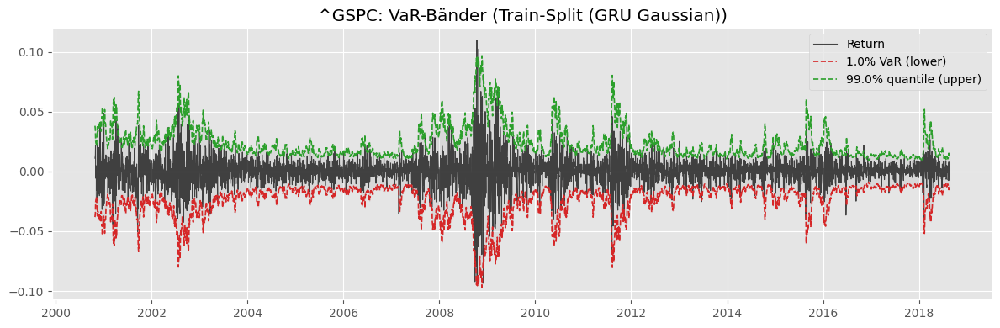

^GSPC: hit rate = 1.480% (target 1.000%)


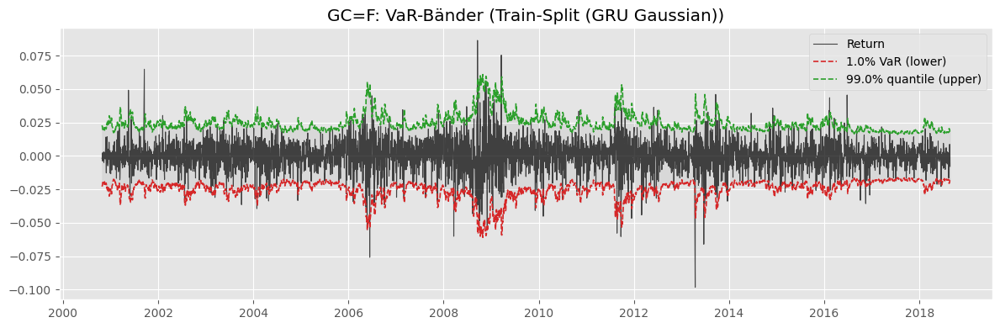

GC=F: hit rate = 1.682% (target 1.000%)


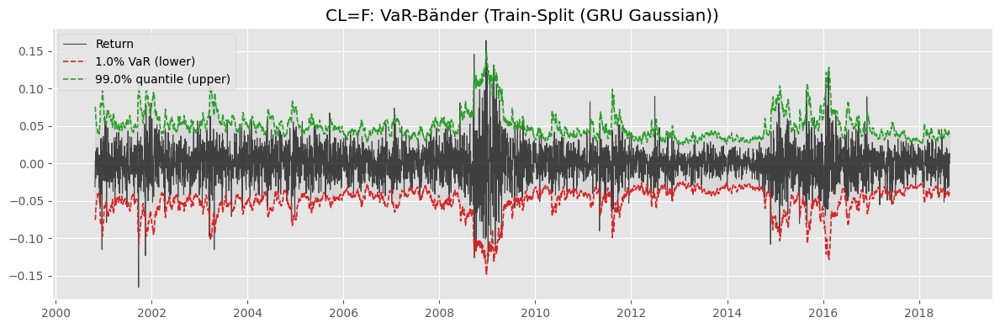

CL=F: hit rate = 1.503% (target 1.000%)


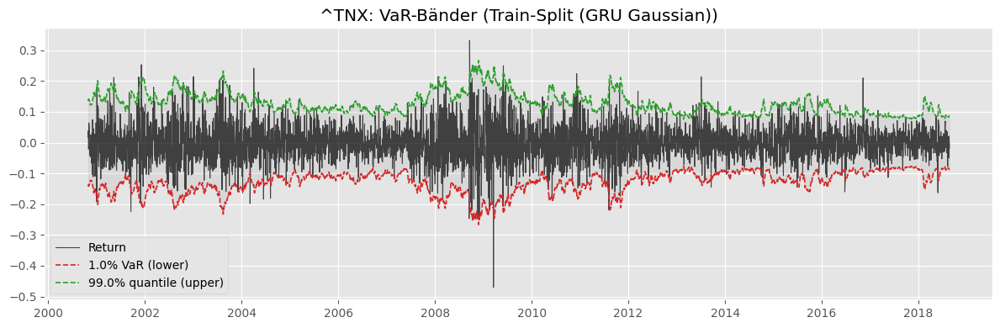

^TNX: hit rate = 0.965% (target 1.000%)


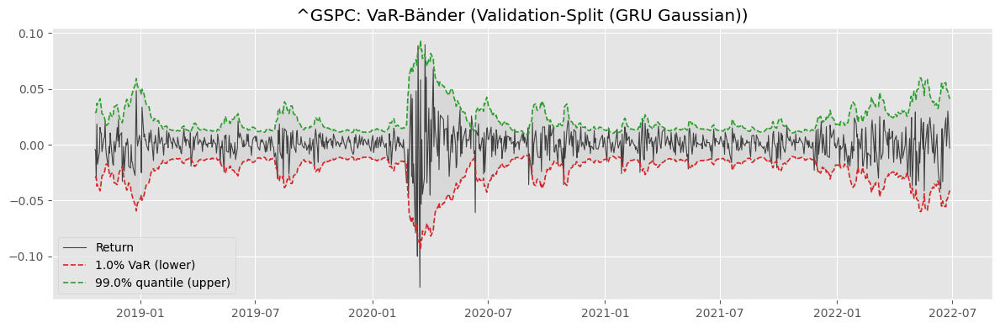

^GSPC: hit rate = 3.463% (target 1.000%)


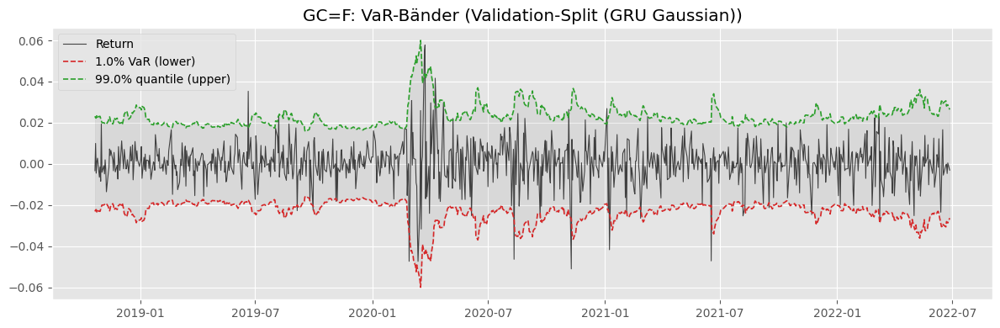

GC=F: hit rate = 1.948% (target 1.000%)


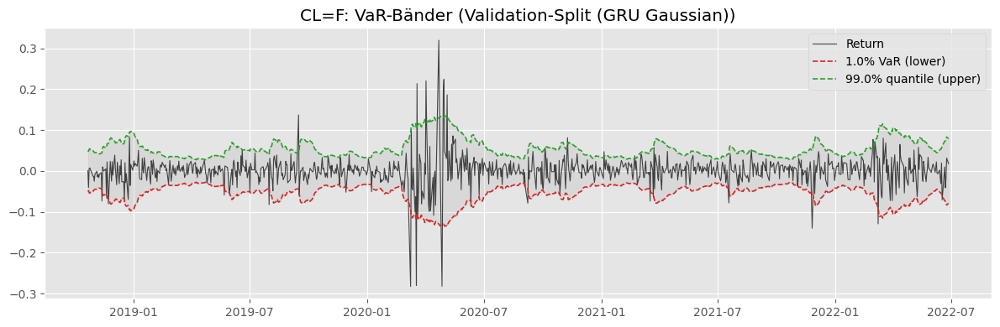

CL=F: hit rate = 2.922% (target 1.000%)


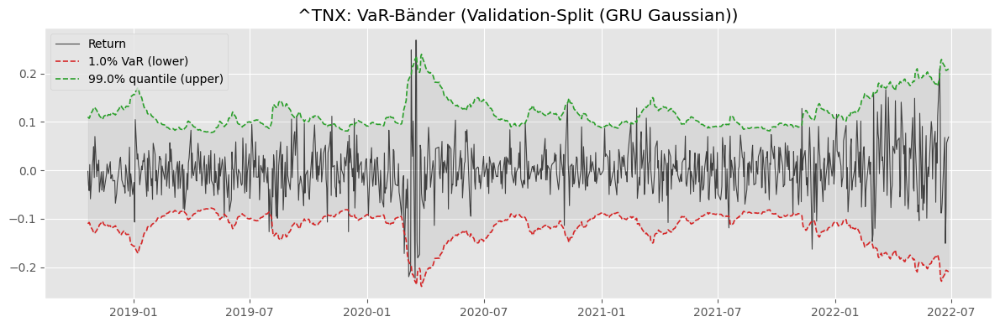

^TNX: hit rate = 1.190% (target 1.000%)


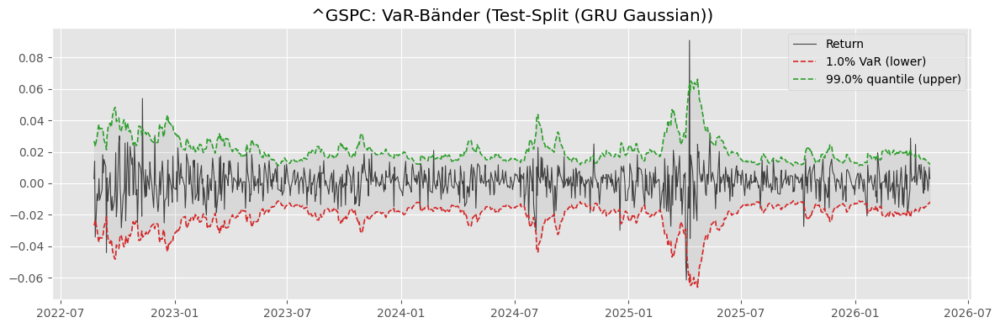

^GSPC: hit rate = 1.730% (target 1.000%)


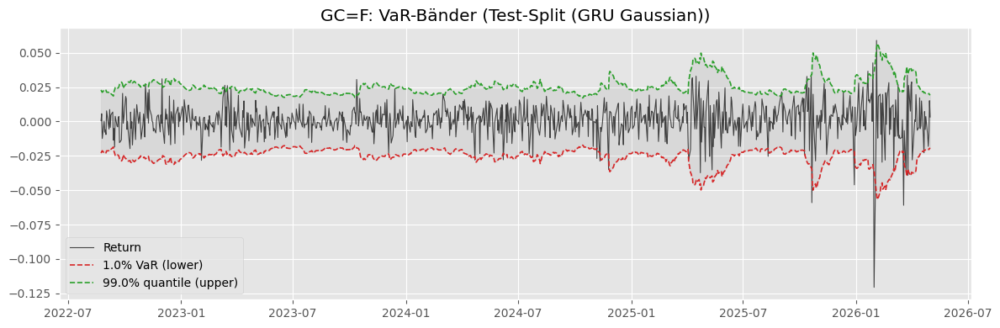

GC=F: hit rate = 1.838% (target 1.000%)


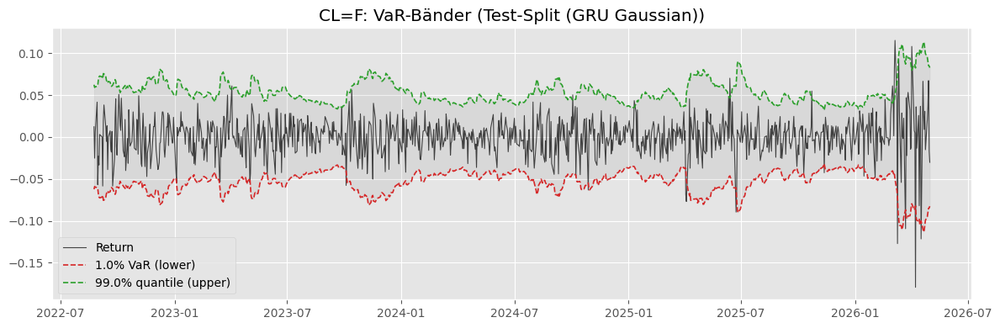

CL=F: hit rate = 1.622% (target 1.000%)


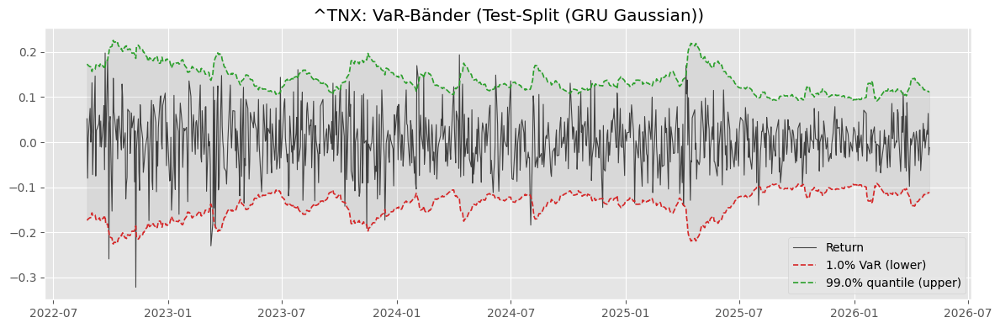

^TNX: hit rate = 1.622% (target 1.000%)


In [978]:
plot_var(alpha=0.01, lookback=gru_lookback, cols=macro_tickers, view="Train-Split (GRU Gaussian)", df=train_df, pred_vol=gru_sigma_train_real)
plot_var(alpha=0.01, lookback=gru_lookback, cols=macro_tickers, view="Validation-Split (GRU Gaussian)", df=val_df, pred_vol=gru_sigma_val_real)
plot_var(alpha=0.01, lookback=gru_lookback, cols=macro_tickers, view="Test-Split (GRU Gaussian)", df=test_df, pred_vol=gru_sigma_test_real)

## Portfolio (Gaussian NLL)


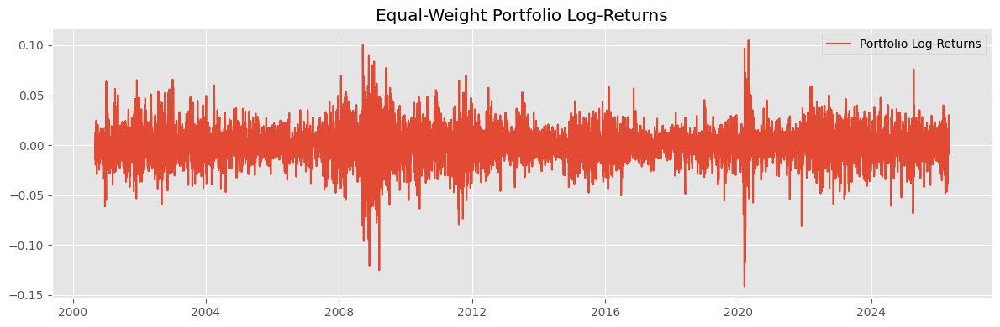

,r_p,var_p,vol_p
Date,,,
2022-08-24,0.016919,0.000395,0.019884
2022-08-25,-0.021413,0.000382,0.019538
2022-08-26,-0.007953,0.000378,0.019450
2022-08-29,0.027542,0.000378,0.019446
2022-08-30,-0.018945,0.000380,0.019494


In [979]:
portfolio_logrets = torch.tensor(logret[macro_tickers].values, dtype=torch.float32, device=device) @ w
portfolio_logrets_np = portfolio_logrets.detach().cpu().numpy()

plt.figure(figsize=(12, 4))
plt.plot(logret.index, portfolio_logrets_np, label="Portfolio Log-Returns")
plt.title("Equal-Weight Portfolio Log-Returns")
plt.legend()
plt.tight_layout()
plt.show()

portfolio_splits_gru = build_gru_portfolio_splits(gru_sigma_splits, w_np)
portfolio_train_gru = portfolio_splits_gru["train"]
portfolio_val_gru = portfolio_splits_gru["val"]
portfolio_test_gru = portfolio_splits_gru["test"]

portfolio_test_gru.head()

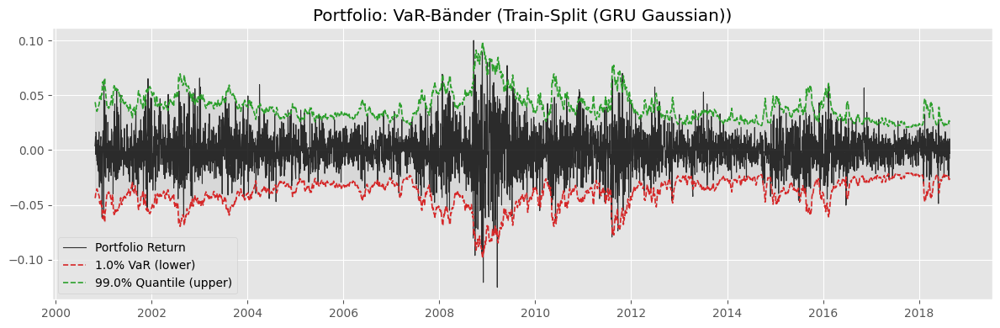

Portfolio hit rate = 1.301% (target 1.000%)


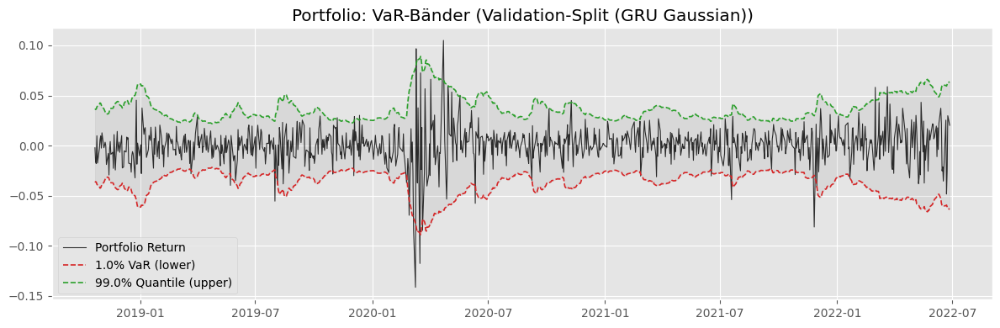

Portfolio hit rate = 2.381% (target 1.000%)


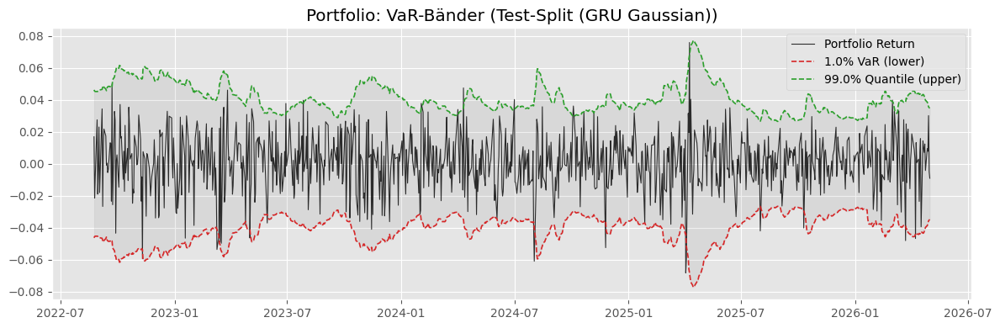

Portfolio hit rate = 1.730% (target 1.000%)


In [980]:
plot_var(alpha=0.01, lookback=gru_lookback, view="Train-Split (GRU Gaussian)", portfolio=True, portfolio_df=portfolio_train_gru)
plot_var(alpha=0.01, lookback=gru_lookback, view="Validation-Split (GRU Gaussian)", portfolio=True, portfolio_df=portfolio_val_gru)
plot_var(alpha=0.01, lookback=gru_lookback, view="Test-Split (GRU Gaussian)", portfolio=True, portfolio_df=portfolio_test_gru)

## GRU with Student-t NLL


In [981]:
gru_student_loss = StudentTLoss(init_nu=8.0, min_nu=2.01, max_nu=100.0)
gru_model_t, gru_hist_t, gru_sigma_splits_t, gru_y_splits_t = fit_gru_model(loss_fn=gru_student_loss)

gru_learned_nu = float(gru_student_loss.nu.detach().cpu())
gru_student_kwargs = {"nu": gru_learned_nu}

gru_sigma_train_real_t = gru_sigma_splits_t["train"]
gru_sigma_val_real_t = gru_sigma_splits_t["val"]
gru_sigma_test_real_t = gru_sigma_splits_t["test"]

save_model_checkpoint(
    model_name="gru_student",
    models_dir=models_dir,
    model=gru_model_t,
    history=gru_hist_t,
    run_metadata=RUN_METADATA,
    loss_fn=gru_student_loss,
    config={
        "model_class": "GRUCovariance",
        "distribution": "student_t",
        "input_size": len(macro_tickers) + k,
        "n_assets": len(macro_tickers),
        "hidden_size": gru_hidden_size,
        "num_layers": gru_num_layers,
        "dropout": gru_dropout,
        "lookback": gru_lookback,
        "batchsize": gru_batchsize,
        "epochs": gru_epochs,
        "lr": gru_lr,
        "scheduler_type": "cosine",
        "early_stopping_patience": early_stopping_patience,
        "early_stopping_min_delta": early_stopping_min_delta,
        "nu": gru_learned_nu,
    },
)

gru_learned_nu

Epoch 001 | train NLL 5.600683 | val NLL 5.885321 | lr 1.00e-04
Epoch 002 | train NLL 5.418225 | val NLL 5.732447 | lr 1.00e-04
Epoch 003 | train NLL 5.281666 | val NLL 5.618524 | lr 1.00e-04
Epoch 004 | train NLL 5.196483 | val NLL 5.546848 | lr 1.00e-04
Epoch 005 | train NLL 5.142725 | val NLL 5.488320 | lr 1.00e-04
Epoch 006 | train NLL 5.106527 | val NLL 5.441144 | lr 1.00e-04
Epoch 007 | train NLL 5.070387 | val NLL 5.399141 | lr 1.00e-04
Epoch 008 | train NLL 5.036743 | val NLL 5.373778 | lr 9.99e-05
Epoch 009 | train NLL 5.009353 | val NLL 5.359469 | lr 9.99e-05
Epoch 010 | train NLL 4.994189 | val NLL 5.346633 | lr 9.99e-05
Epoch 011 | train NLL 4.987065 | val NLL 5.335013 | lr 9.99e-05
Epoch 012 | train NLL 4.978478 | val NLL 5.324192 | lr 9.99e-05
Epoch 013 | train NLL 4.971449 | val NLL 5.308107 | lr 9.98e-05
Epoch 014 | train NLL 4.963976 | val NLL 5.299287 | lr 9.98e-05
Epoch 015 | train NLL 4.959289 | val NLL 5.285275 | lr 9.98e-05
Epoch 016 | train NLL 4.951463 | val NLL

8.12798023223877

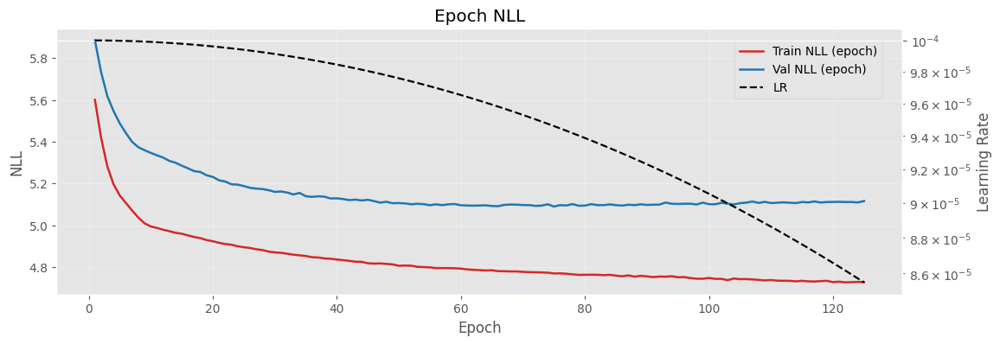

In [982]:
plot_loss(gru_hist_t)

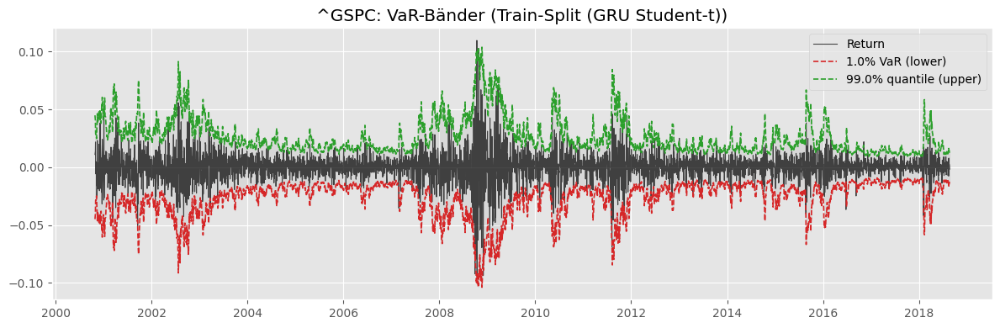

^GSPC: hit rate = 1.009% (target 1.000%)


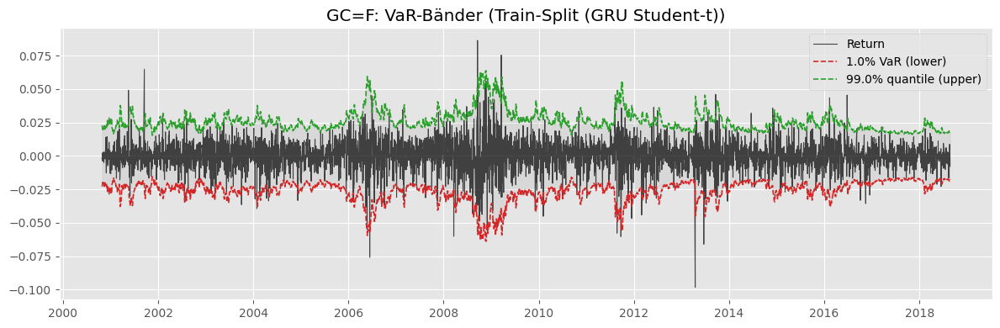

GC=F: hit rate = 1.436% (target 1.000%)


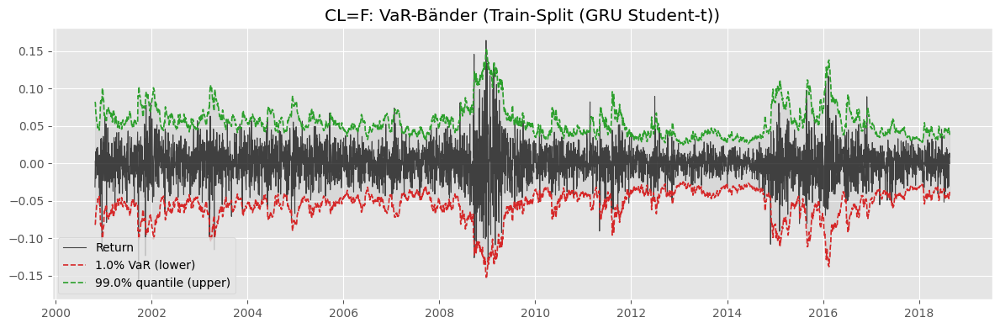

CL=F: hit rate = 1.077% (target 1.000%)


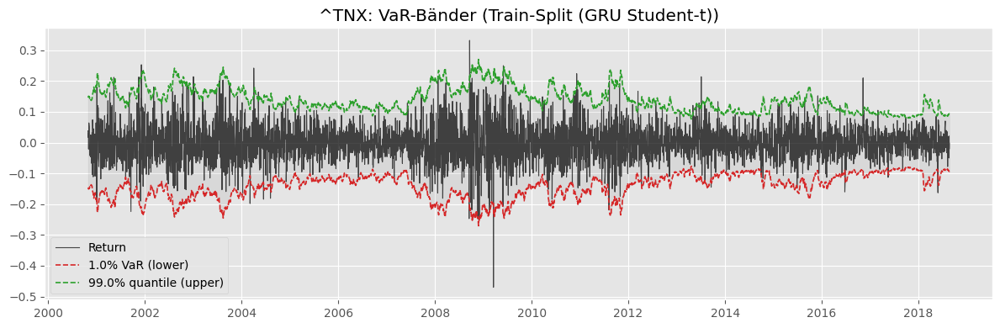

^TNX: hit rate = 0.606% (target 1.000%)


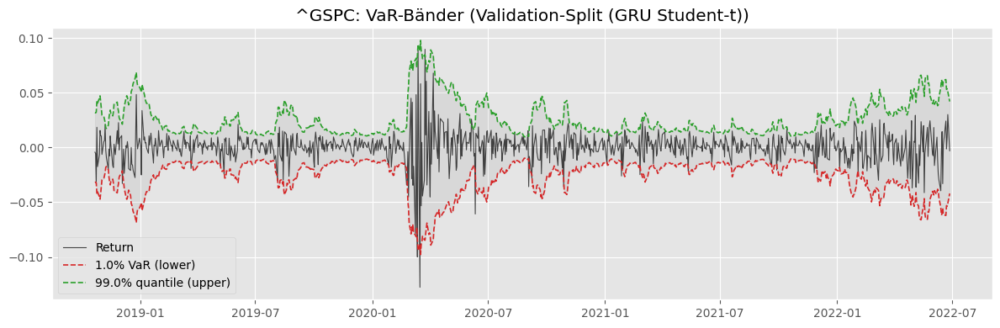

^GSPC: hit rate = 2.273% (target 1.000%)


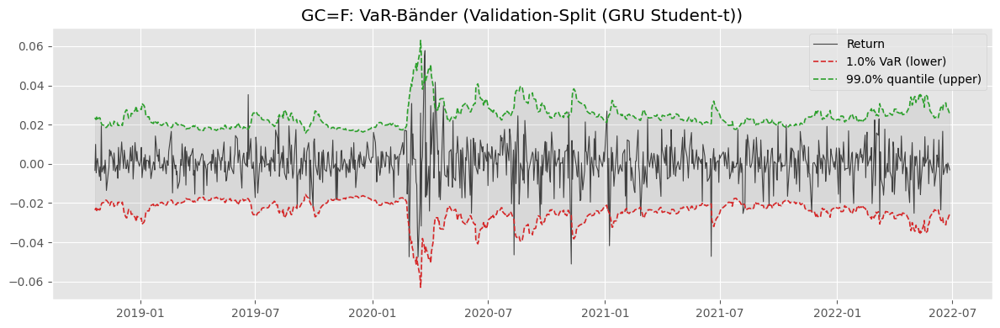

GC=F: hit rate = 1.515% (target 1.000%)


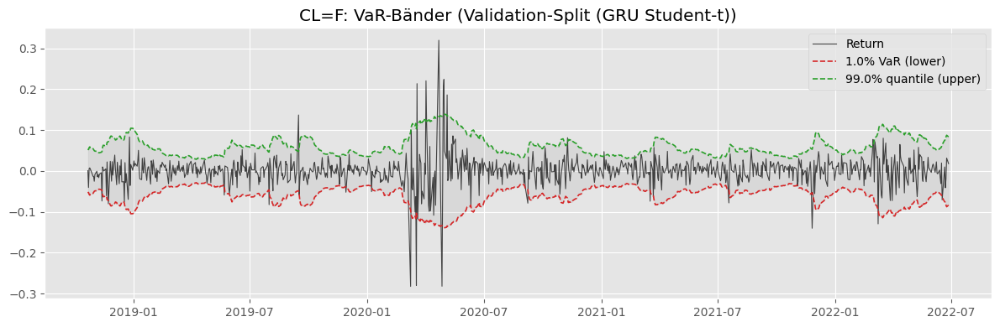

CL=F: hit rate = 2.273% (target 1.000%)


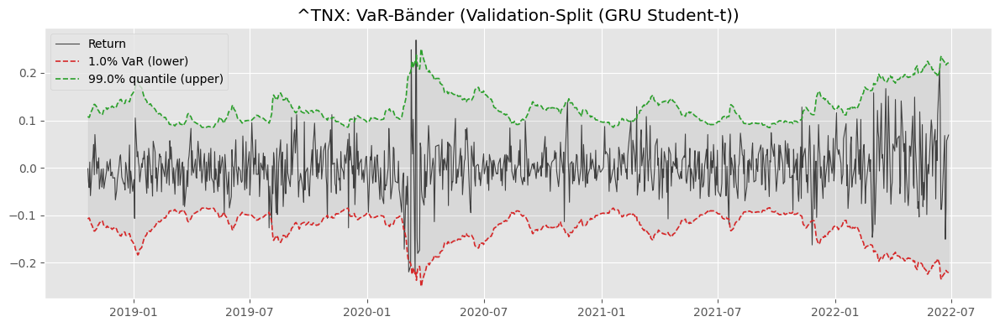

^TNX: hit rate = 1.082% (target 1.000%)


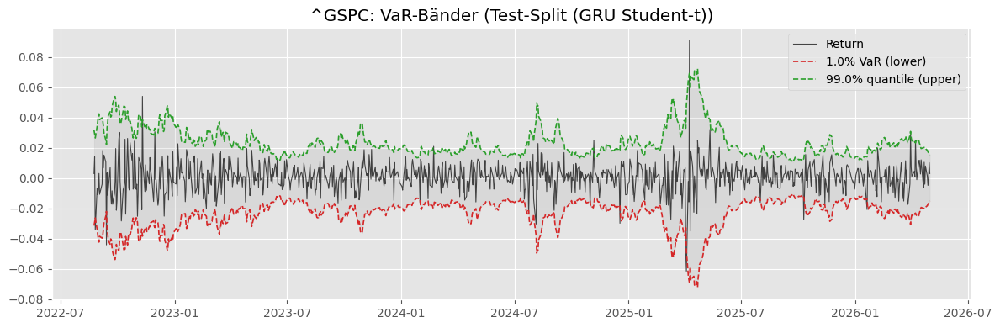

^GSPC: hit rate = 1.189% (target 1.000%)


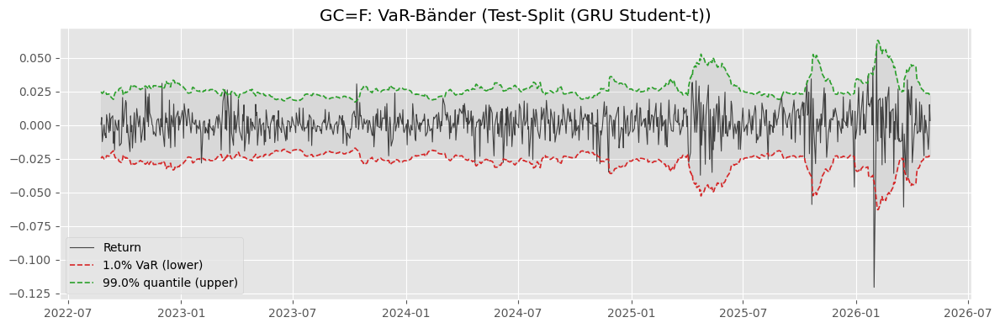

GC=F: hit rate = 1.405% (target 1.000%)


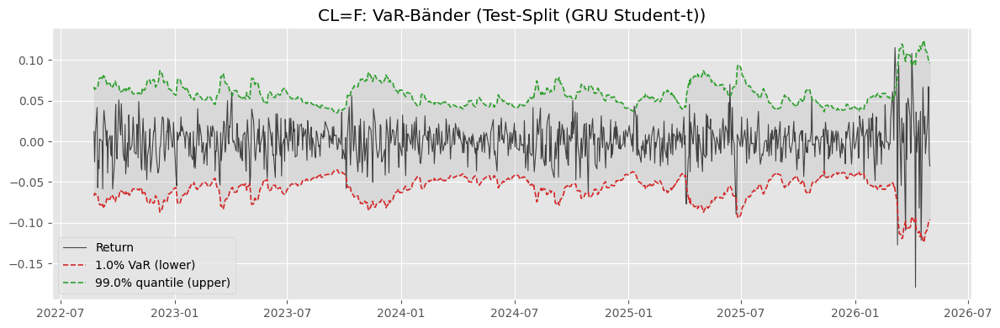

CL=F: hit rate = 1.297% (target 1.000%)


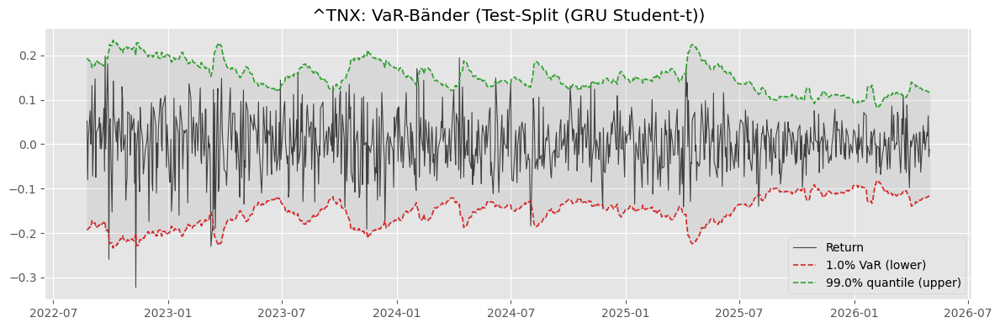

^TNX: hit rate = 0.973% (target 1.000%)


In [983]:
plot_var(alpha=0.01, lookback=gru_lookback, cols=macro_tickers, view="Train-Split (GRU Student-t)", df=train_df, pred_vol=gru_sigma_train_real_t, loss_fn=student_nll, loss_kwargs=gru_student_kwargs)
plot_var(alpha=0.01, lookback=gru_lookback, cols=macro_tickers, view="Validation-Split (GRU Student-t)", df=val_df, pred_vol=gru_sigma_val_real_t, loss_fn=student_nll, loss_kwargs=gru_student_kwargs)
plot_var(alpha=0.01, lookback=gru_lookback, cols=macro_tickers, view="Test-Split (GRU Student-t)", df=test_df, pred_vol=gru_sigma_test_real_t, loss_fn=student_nll, loss_kwargs=gru_student_kwargs)

## Portfolio (Student-t NLL)


In [984]:
portfolio_splits_gru_t = build_gru_portfolio_splits(gru_sigma_splits_t, w_np)
portfolio_train_gru_t = portfolio_splits_gru_t["train"]
portfolio_val_gru_t = portfolio_splits_gru_t["val"]
portfolio_test_gru_t = portfolio_splits_gru_t["test"]

portfolio_test_gru_t.head()

,r_p,var_p,vol_p
Date,,,
2022-08-24,0.016919,0.000421,0.020512
2022-08-25,-0.021413,0.000414,0.020348
2022-08-26,-0.007953,0.000410,0.020257
2022-08-29,0.027542,0.000401,0.020025
2022-08-30,-0.018945,0.000403,0.020072


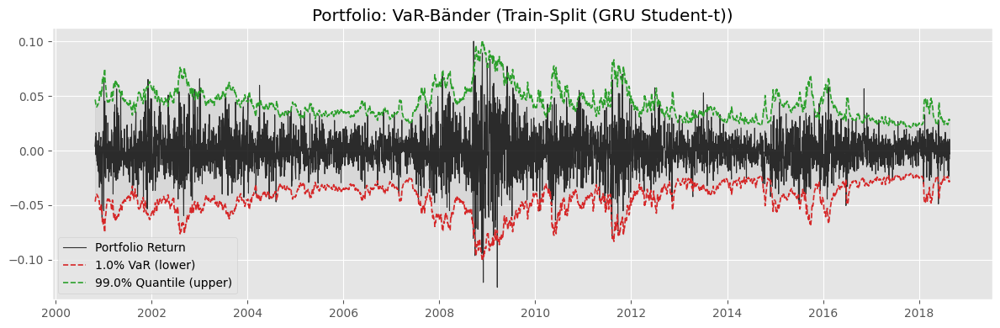

Portfolio hit rate = 0.718% (target 1.000%)


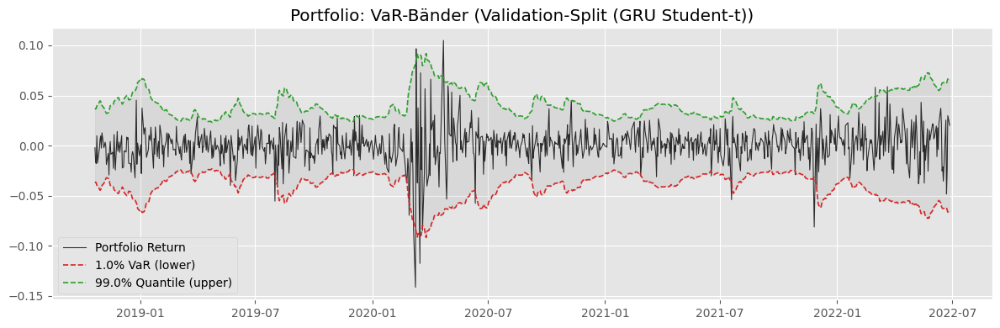

Portfolio hit rate = 1.948% (target 1.000%)


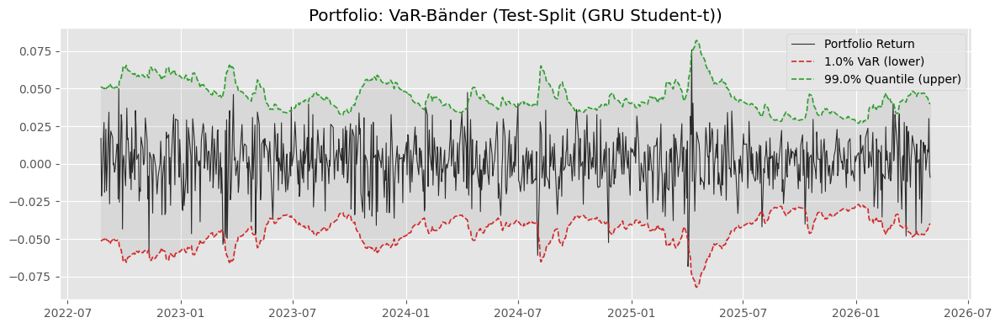

Portfolio hit rate = 1.297% (target 1.000%)


In [985]:
plot_var(alpha=0.01, lookback=gru_lookback, view="Train-Split (GRU Student-t)", portfolio=True, portfolio_df=portfolio_train_gru_t, loss_fn=student_nll, loss_kwargs=gru_student_kwargs)
plot_var(alpha=0.01, lookback=gru_lookback, view="Validation-Split (GRU Student-t)", portfolio=True, portfolio_df=portfolio_val_gru_t, loss_fn=student_nll, loss_kwargs=gru_student_kwargs)
plot_var(alpha=0.01, lookback=gru_lookback, view="Test-Split (GRU Student-t)", portfolio=True, portfolio_df=portfolio_test_gru_t, loss_fn=student_nll, loss_kwargs=gru_student_kwargs)

## Filtered Historical Simulation


In [986]:
alpha = 0.01
window = 1000

fhs_gru_normal = run_fhs_pipeline(portfolio_train_gru, portfolio_val_gru, portfolio_test_gru, alpha=alpha, window=window)
var_fhs_train_gru = fhs_gru_normal["train"]["var"]
es_fhs_train_gru = fhs_gru_normal["train"]["es"]
hit_train_gru = fhs_gru_normal["train"]["hits"]

var_fhs_val_gru = fhs_gru_normal["val"]["var"]
es_fhs_val_gru = fhs_gru_normal["val"]["es"]
hit_val_gru = fhs_gru_normal["val"]["hits"]

var_fhs_test_gru = fhs_gru_normal["test"]["var"]
es_fhs_test_gru = fhs_gru_normal["test"]["es"]
hits_test_gru = fhs_gru_normal["test"]["hits"]

pd.DataFrame(
    {
        "hit_rate": [hit_train_gru.mean(), hit_val_gru.mean(), hits_test_gru.mean()],
    },
    index=["train", "val", "test"],
)

,hit_rate
train,0.013013
val,0.015152
test,0.009730


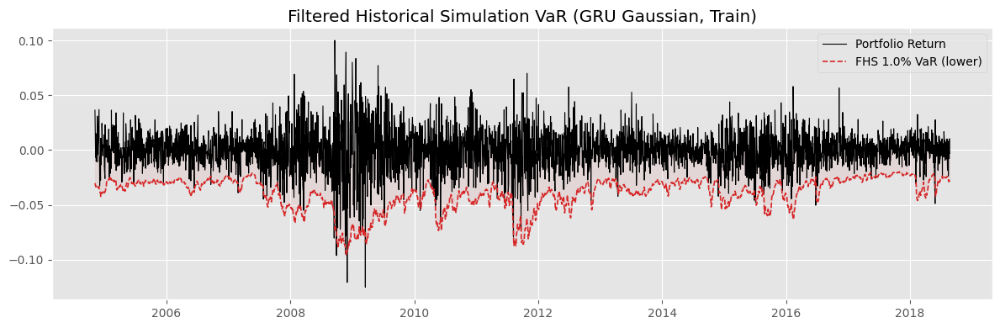

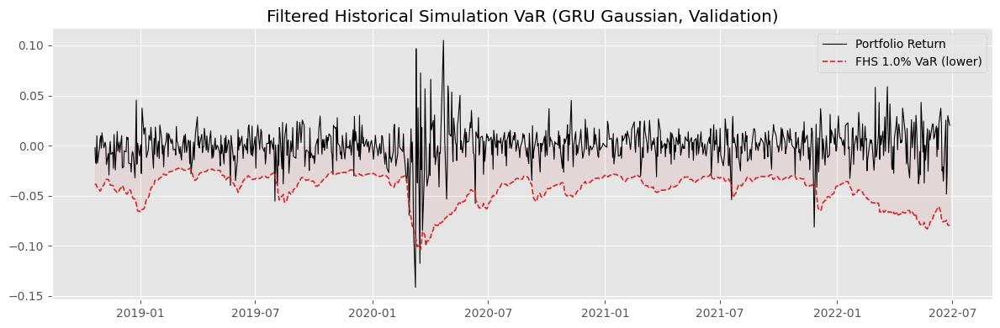

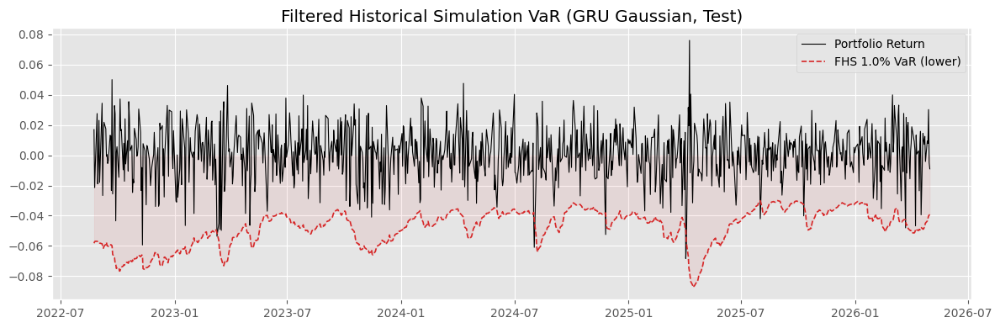

In [987]:
plot_fhs_var(
    portfolio_train_gru,
    var_fhs_train_gru,
    alpha=alpha,
    title="Filtered Historical Simulation VaR (GRU Gaussian, Train)",
    start=fhs_gru_normal["burn_in"],
)
plot_fhs_var(
    portfolio_val_gru,
    var_fhs_val_gru,
    alpha=alpha,
    title="Filtered Historical Simulation VaR (GRU Gaussian, Validation)",
)
plot_fhs_var(
    portfolio_test_gru,
    var_fhs_test_gru,
    alpha=alpha,
    title="Filtered Historical Simulation VaR (GRU Gaussian, Test)",
)

In [988]:
fhs_gru_student = run_fhs_pipeline(portfolio_train_gru_t, portfolio_val_gru_t, portfolio_test_gru_t, alpha=alpha, window=window)
var_fhs_train_gru_t = fhs_gru_student["train"]["var"]
es_fhs_train_gru_t = fhs_gru_student["train"]["es"]
hit_train_gru_t = fhs_gru_student["train"]["hits"]

var_fhs_val_gru_t = fhs_gru_student["val"]["var"]
es_fhs_val_gru_t = fhs_gru_student["val"]["es"]
hit_val_gru_t = fhs_gru_student["val"]["hits"]

var_fhs_test_gru_t = fhs_gru_student["test"]["var"]
es_fhs_test_gru_t = fhs_gru_student["test"]["es"]
hits_test_gru_t = fhs_gru_student["test"]["hits"]

pd.DataFrame(
    {
        "hit_rate": [hit_train_gru_t.mean(), hit_val_gru_t.mean(), hits_test_gru_t.mean()],
    },
    index=["train", "val", "test"],
)

,hit_rate
train,0.014170
val,0.015152
test,0.008649


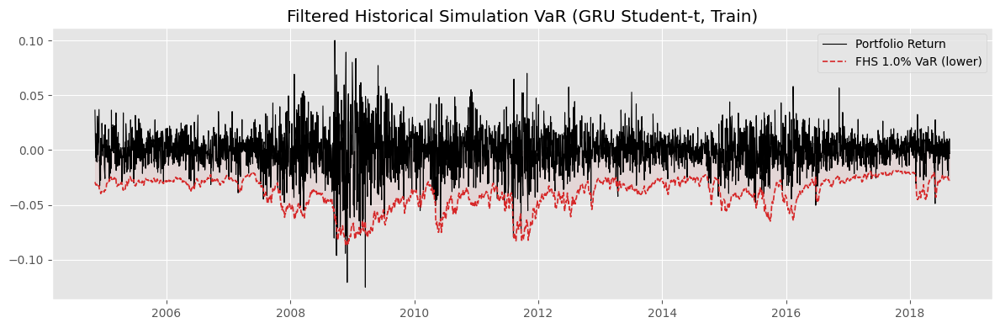

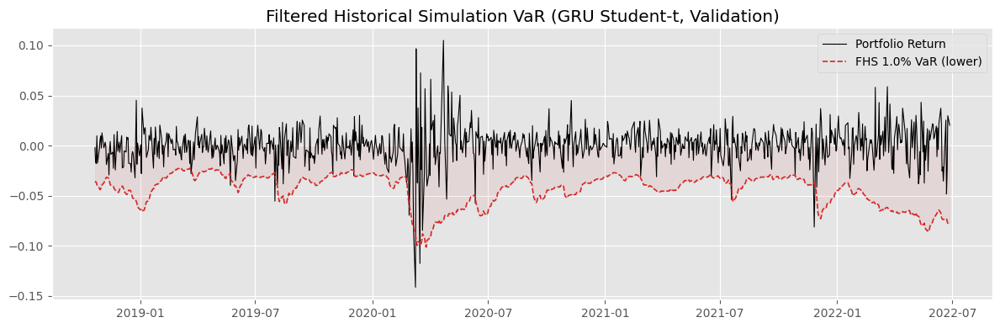

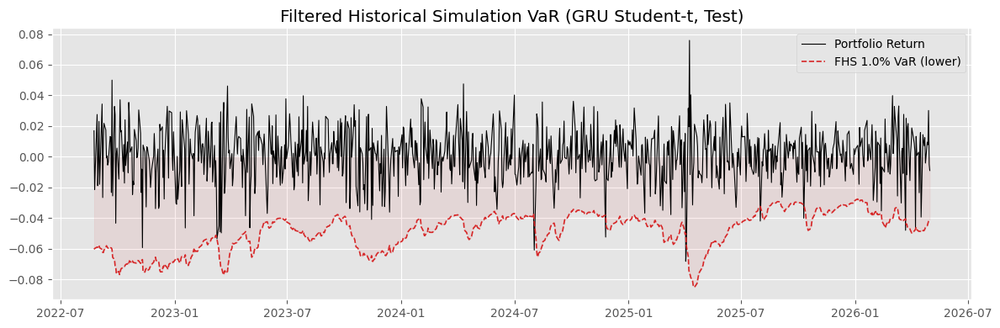

In [989]:
plot_fhs_var(
    portfolio_train_gru_t,
    var_fhs_train_gru_t,
    alpha=alpha,
    title="Filtered Historical Simulation VaR (GRU Student-t, Train)",
    start=fhs_gru_student["burn_in"],
)
plot_fhs_var(
    portfolio_val_gru_t,
    var_fhs_val_gru_t,
    alpha=alpha,
    title="Filtered Historical Simulation VaR (GRU Student-t, Validation)",
)
plot_fhs_var(
    portfolio_test_gru_t,
    var_fhs_test_gru_t,
    alpha=alpha,
    title="Filtered Historical Simulation VaR (GRU Student-t, Test)",
)

## GRU Backtesting


In [990]:
from backtesting import build_fz_loss_matrix, run_backtest_suite, run_fz_dm_comparison_plan

In [991]:
results_gru_normal = run_backtest_suite(
    returns=portfolio_test_gru["r_p"].values,
    var=var_fhs_test_gru,
    es=es_fhs_test_gru,
    alpha=alpha,
    volatility=portfolio_test_gru["vol_p"].values,
)

results_gru_student = run_backtest_suite(
    returns=portfolio_test_gru_t["r_p"].values,
    var=var_fhs_test_gru_t,
    es=es_fhs_test_gru_t,
    alpha=alpha,
    volatility=portfolio_test_gru_t["vol_p"].values,
)

{
    "gru_normal": results_gru_normal,
    "gru_student": results_gru_student,
}

{'gru_normal': {'meta': {'alpha': 0.01, 'n_obs': 925},
  'var': {'kupiec': {'test': 'kupiec_uc',
    'alpha': 0.01,
    'n_obs': 925,
    'n_exceptions': 9,
    'expected_exceptions': 9.25,
    'hit_rate': 0.00972972972972973,
    'lr_uc': 0.006886708472265468,
    'p_value': 0.9338625169657003},
   'christoffersen': {'test': 'christoffersen_cc',
    'alpha': 0.01,
    'n_obs': 925,
    'n_exceptions': 9,
    'hit_rate': 0.00972972972972973,
    'transition_counts': {'n00': 908, 'n01': 7, 'n10': 7, 'n11': 2},
    'transition_probs': {'pi_01': 0.007650273224043716,
     'pi_11': 0.2222222222222222,
     'pi_pooled': 0.00974025974025974},
    'lr_ind': 9.575609137057455,
    'p_value_ind': 0.0019717941960926085,
    'lr_uc': 0.006886708472265468,
    'lr_cc': 9.58249584552972,
    'p_value_cc': 0.008302090546974316},
   'dq': {'test': 'dynamic_quantile',
    'implementation': 'segMGarch::DQtest',
    'alpha': 0.01,
    'var_level': 0.99,
    'n_obs': 921,
    'n_exceptions': 9,
    'expe

# Backtesting

!!! Backtestings müssen mit dem selben $\alpha$ vorgenommen werden wie mit FHS !!!

Backtests sind für univariate Zeitreihen definiert, d.h. wir testen alle Modelle im Kontext eines vordefinierten Portfolios.

In [992]:
#importlib.reload(backtesting)

In [993]:
from backtesting import build_fz_loss_matrix, run_backtest_suite, run_fz_dm_comparison_plan

In [994]:
results_lstm_normal = run_backtest_suite(
    returns=portfolio_test["r_p"].values,
    var=var_fhs_test,
    es=es_fhs_test,
    alpha=alpha,
    volatility=portfolio_test["vol_p"].values,  # optional, aber für CC/ER sinnvoll
)

results_lstm_normal

{'meta': {'alpha': 0.01, 'n_obs': 925},
 'var': {'kupiec': {'test': 'kupiec_uc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 10,
   'expected_exceptions': 9.25,
   'hit_rate': 0.010810810810810811,
   'lr_uc': 0.05984524776779665,
   'p_value': 0.8067407000532538},
  'christoffersen': {'test': 'christoffersen_cc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 10,
   'hit_rate': 0.010810810810810811,
   'transition_counts': {'n00': 905, 'n01': 9, 'n10': 9, 'n11': 1},
   'transition_probs': {'pi_01': 0.009846827133479213,
    'pi_11': 0.1,
    'pi_pooled': 0.010822510822510822},
   'lr_ind': 2.8302683186683595,
   'p_value_ind': 0.09250290332999839,
   'lr_uc': 0.05984524776779665,
   'lr_cc': 2.890113566436156,
   'p_value_cc': 0.2357326905150423},
  'dq': {'test': 'dynamic_quantile',
   'implementation': 'segMGarch::DQtest',
   'alpha': 0.01,
   'var_level': 0.99,
   'n_obs': 921,
   'n_exceptions': 10,
   'expected_exceptions': 9.21,
   'hit_rate': 0.0108577633007600

In [995]:
results_lstm_student = run_backtest_suite(
    returns=portfolio_test_t["r_p"].values,
    var=var_fhs_test_t,
    es=es_fhs_test_t,
    alpha=alpha,
    volatility=portfolio_test_t["vol_p"].values,
)

results_lstm_student

{'meta': {'alpha': 0.01, 'n_obs': 925},
 'var': {'kupiec': {'test': 'kupiec_uc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 11,
   'expected_exceptions': 9.25,
   'hit_rate': 0.011891891891891892,
   'lr_uc': 0.31532425370244255,
   'p_value': 0.5744312405273544},
  'christoffersen': {'test': 'christoffersen_cc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 11,
   'hit_rate': 0.011891891891891892,
   'transition_counts': {'n00': 903, 'n01': 10, 'n10': 10, 'n11': 1},
   'transition_probs': {'pi_01': 0.01095290251916758,
    'pi_11': 0.09090909090909091,
    'pi_pooled': 0.011904761904761904},
   'lr_ind': 2.4714156487165866,
   'p_value_ind': 0.11593346518086627,
   'lr_uc': 0.31532425370244255,
   'lr_cc': 2.786739902419029,
   'p_value_cc': 0.2482373457408814},
  'dq': {'test': 'dynamic_quantile',
   'implementation': 'segMGarch::DQtest',
   'alpha': 0.01,
   'var_level': 0.99,
   'n_obs': 921,
   'n_exceptions': 11,
   'expected_exceptions': 9.21,
   'hit_rate': 0

In [996]:
results_bekk_scalar = run_backtest_suite(
    returns=portfolio_test_bekk["r_p"].values,
    var=var_fhs_test_bekk,
    es=es_fhs_test_bekk,
    alpha=alpha,
    volatility=portfolio_test_bekk["vol_p"].values,
)

results_bekk_scalar # BEKK-LSTM scalar modulation

{'meta': {'alpha': 0.01, 'n_obs': 925},
 'var': {'kupiec': {'test': 'kupiec_uc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 11,
   'expected_exceptions': 9.25,
   'hit_rate': 0.011891891891891892,
   'lr_uc': 0.31532425370244255,
   'p_value': 0.5744312405273544},
  'christoffersen': {'test': 'christoffersen_cc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 11,
   'hit_rate': 0.011891891891891892,
   'transition_counts': {'n00': 903, 'n01': 10, 'n10': 10, 'n11': 1},
   'transition_probs': {'pi_01': 0.01095290251916758,
    'pi_11': 0.09090909090909091,
    'pi_pooled': 0.011904761904761904},
   'lr_ind': 2.4714156487165866,
   'p_value_ind': 0.11593346518086627,
   'lr_uc': 0.31532425370244255,
   'lr_cc': 2.786739902419029,
   'p_value_cc': 0.2482373457408814},
  'dq': {'test': 'dynamic_quantile',
   'implementation': 'segMGarch::DQtest',
   'alpha': 0.01,
   'var_level': 0.99,
   'n_obs': 921,
   'n_exceptions': 11,
   'expected_exceptions': 9.21,
   'hit_rate': 0

# BEKK(1, 1) symmetrisch & asymmetrisch

importiert aus R bzw BEKKs Library.

## Daten import

In [997]:
import shutil
import subprocess

In [998]:
rscript = shutil.which("Rscript")
if rscript is None:
    raise RuntimeError("Rscript wurde nicht gefunden. Prüfe, ob R im PATH liegt.")

In [999]:
cmd = [
    rscript,
    str(project_dir / "r" / "bekks.R"),
    "--data-id", DATA_ID,
    "--run-id", RUN_ID,
    "--project-dir", str(project_dir),
    "--seed", str(SEED),
    "--max-iter", "200",
]

result = subprocess.run(
    cmd,
    cwd=project_dir,
    capture_output=True,
    text=True,
    check=False,
)

print("R stdout:")
print(result.stdout)

if result.stderr:
    print("R stderr:")
    print(result.stderr)

if result.returncode != 0:
    raise RuntimeError(f"bekks.R failed with return code {result.returncode}")

print(f"BEKK run finished: {RUN_ID}")


R stdout:
BEKK(1,1) forecasts finished
data_id: 2026-05-03
run_id: asof_2026-05-03_seed3
seed: 3
max_iter: 200
project_dir: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk
output_dir: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk/r/output
assets: ^GSPC, GC=F, CL=F, ^TNX
train / val / test rows: 4498 / 964 / 965
symmetric train+val CSV: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk/r/output/bekk_forecasts_fitted_train_val_symmetric_asof_2026-05-03_seed3.csv
symmetric forecast CSV: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk/r/output/bekk_forecasts_symmetric_asof_2026-05-03_seed3.csv
asymmetric train+val CSV: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk/r/output/bekk_forecasts_fitted_train_val_asymmetric_asof_2026-05-03_seed3.csv
asymmetric forecast CSV: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk/r/output/bekk_forecasts_asymmetric_asof_2026-05-03_seed3.csv

BEKK run finished: asof_2026-05-03_see

In [1000]:
def load_covariances(path, d, model_label="covariance"):
    path = Path(path)

    if not path.exists():
        raise FileNotFoundError(f"{model_label} forecast file not found: {path}")

    df = pd.read_csv(path, parse_dates=["Date"]).set_index("Date")

    expected_cols = [
        f"h_{i}{j}"
        for i in range(1, d + 1)
        for j in range(1, d + 1)
    ]

    missing_cols = [col for col in expected_cols if col not in df.columns]
    if missing_cols:
        raise ValueError(f"Missing covariance columns in {path}: {missing_cols}")

    H = df[expected_cols].to_numpy(dtype=float).reshape(len(df), d, d)

    return df, H

load_bekk_covariances = load_covariances

sym_path = output_dir / f"bekk_forecasts_symmetric_{RUN_ID}.csv"
asym_path = output_dir / f"bekk_forecasts_asymmetric_{RUN_ID}.csv"

bekk_sym_df, H_bekk_sym = load_covariances(sym_path, d=len(macro_tickers), model_label="Symmetric BEKK")
bekk_asym_df, H_bekk_asym = load_covariances(asym_path, d=len(macro_tickers), model_label="Asymmetric BEKK")

if len(H_bekk_sym) != len(test_df):
    raise ValueError(f"Symmetric BEKK length mismatch: {len(H_bekk_sym)} vs test_df {len(test_df)}")

if len(H_bekk_asym) != len(test_df):
    raise ValueError(f"Asymmetric BEKK length mismatch: {len(H_bekk_asym)} vs test_df {len(test_df)}")

print("Symmetric BEKK:", H_bekk_sym.shape)
print("Asymmetric BEKK:", H_bekk_asym.shape)


Symmetric BEKK: (965, 4, 4)
Asymmetric BEKK: (965, 4, 4)


In [1001]:
sigma_test_real.shape

(925, 4, 4)

BEKK(1, 1) hat ```lookback``` mehr OOS predictions als die LSTM Modelle

In [1002]:
H_bekk_sym_aligned = H_bekk_sym[lookback:]
H_bekk_asym_aligned = H_bekk_asym[lookback:]

idx_bekk_sym, rp_bekk_sym, varp_bekk_sym, volp_bekk_sym = calc_portfolio_variance(
    test_df,
    H_bekk_sym_aligned,
    macro_tickers,
    lookback,
    w_np,
)

idx_bekk_asym, rp_bekk_asym, varp_bekk_asym, volp_bekk_asym = calc_portfolio_variance(
    test_df,
    H_bekk_asym_aligned,
    macro_tickers,
    lookback,
    w_np,
)


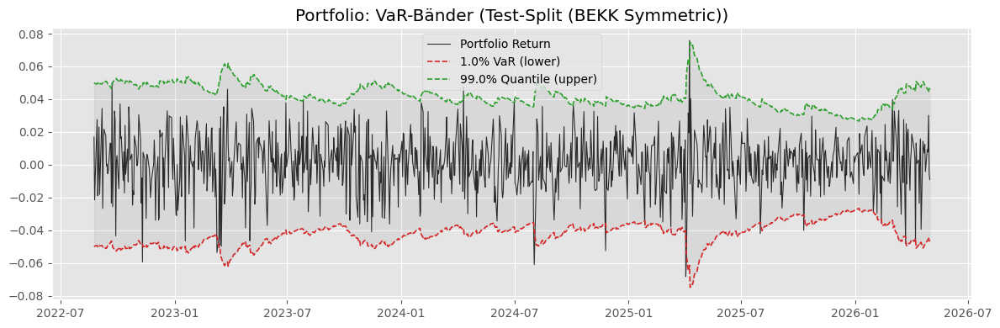

Portfolio hit rate = 1.405% (target 1.000%)


In [1003]:
portfolio_test_bekk_sym = make_portfolio_df(idx_bekk_sym, rp_bekk_sym, varp_bekk_sym, volp_bekk_sym)

plot_var(alpha=0.01, lookback=lookback, view="Test-Split (BEKK Symmetric)", portfolio=True, portfolio_df=portfolio_test_bekk_sym)

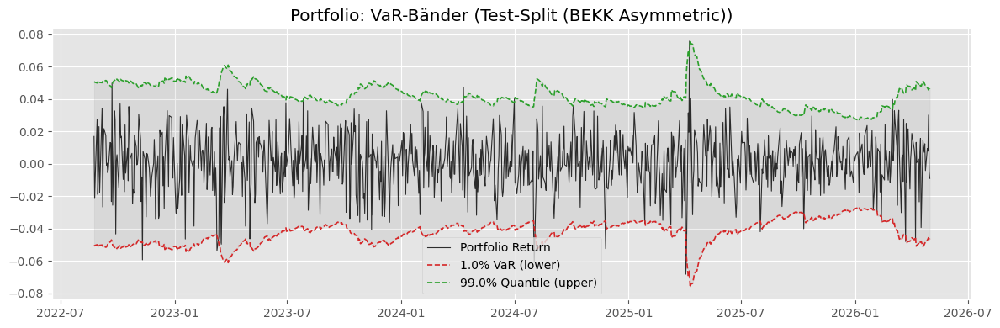

Portfolio hit rate = 1.622% (target 1.000%)


In [1004]:
portfolio_test_bekk_asym = make_portfolio_df(idx_bekk_asym, rp_bekk_asym, varp_bekk_asym, volp_bekk_asym)

plot_var(alpha=0.01, lookback=lookback, view="Test-Split (BEKK Asymmetric)", portfolio=True, portfolio_df=portfolio_test_bekk_asym)

## FHS

In [1005]:
trainval_sym_path = output_dir / f"bekk_forecasts_fitted_train_val_symmetric_{RUN_ID}.csv"
trainval_asym_path = output_dir / f"bekk_forecasts_fitted_train_val_asymmetric_{RUN_ID}.csv"

_, H_bekk_sym_trainval = load_covariances(trainval_sym_path, d=len(macro_tickers), model_label="Symmetric BEKK train+val")
_, H_bekk_asym_trainval = load_covariances(trainval_asym_path, d=len(macro_tickers), model_label="Asymmetric BEKK train+val")


In [1006]:
train_val_returns_df = pd.concat(
    [train_df[macro_tickers], val_df[macro_tickers]],
    axis=0,
)

idx_sym_hist, rp_sym_hist, varp_sym_hist, volp_sym_hist = calc_portfolio_variance(
    train_val_returns_df,
    H_bekk_sym_trainval,
    macro_tickers,
    0,
    w_np,
)

idx_asym_hist, rp_asym_hist, varp_asym_hist, volp_asym_hist = calc_portfolio_variance(
    train_val_returns_df,
    H_bekk_asym_trainval,
    macro_tickers,
    0,
    w_np,
)

portfolio_hist_bekk_sym = make_portfolio_df(idx_sym_hist, rp_sym_hist, varp_sym_hist, volp_sym_hist)
portfolio_hist_bekk_asym = make_portfolio_df(idx_asym_hist, rp_asym_hist, varp_asym_hist, volp_asym_hist)

In [1007]:
z_hist_sym = portfolio_hist_bekk_sym["r_p"].values / np.clip(
    portfolio_hist_bekk_sym["vol_p"].values,
    1e-12,
    None,
)

z_hist_asym = portfolio_hist_bekk_asym["r_p"].values / np.clip(
    portfolio_hist_bekk_asym["vol_p"].values,
    1e-12,
    None,
)

var_fhs_test_bekk_sym, es_fhs_test_bekk_sym, hits_test_bekk_sym = fhs_var_es(
    z_hist_init=z_hist_sym,
    r_oos=portfolio_test_bekk_sym["r_p"].values,
    vol_oos=portfolio_test_bekk_sym["vol_p"].values,
    alpha=alpha,
    window=window,
)

var_fhs_test_bekk_asym, es_fhs_test_bekk_asym, hits_test_bekk_asym = fhs_var_es(
    z_hist_init=z_hist_asym,
    r_oos=portfolio_test_bekk_asym["r_p"].values,
    vol_oos=portfolio_test_bekk_asym["vol_p"].values,
    alpha=alpha,
    window=window,
)

print("Sym BEKK hit rate:", hits_test_bekk_sym.mean())
print("Asym BEKK hit rate:", hits_test_bekk_asym.mean())


Sym BEKK hit rate: 0.014054054054054054
Asym BEKK hit rate: 0.014054054054054054


## Backtest

In [1008]:
results_bekk_sym = run_backtest_suite(
    returns=portfolio_test_bekk_sym["r_p"].values,
    var=var_fhs_test_bekk_sym,
    es=es_fhs_test_bekk_sym,
    alpha=alpha,
    volatility=portfolio_test_bekk_sym["vol_p"].values,
)

results_bekk_sym

{'meta': {'alpha': 0.01, 'n_obs': 925},
 'var': {'kupiec': {'test': 'kupiec_uc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 13,
   'expected_exceptions': 9.25,
   'hit_rate': 0.014054054054054054,
   'lr_uc': 1.363848224070864,
   'p_value': 0.2428716626058993},
  'christoffersen': {'test': 'christoffersen_cc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 13,
   'hit_rate': 0.014054054054054054,
   'transition_counts': {'n00': 900, 'n01': 11, 'n10': 11, 'n11': 2},
   'transition_probs': {'pi_01': 0.012074643249176729,
    'pi_11': 0.15384615384615385,
    'pi_pooled': 0.01406926406926407},
   'lr_ind': 6.478778899671823,
   'p_value_ind': 0.01091699580150539,
   'lr_uc': 1.363848224070864,
   'lr_cc': 7.8426271237426874,
   'p_value_cc': 0.0198150493486927},
  'dq': {'test': 'dynamic_quantile',
   'implementation': 'segMGarch::DQtest',
   'alpha': 0.01,
   'var_level': 0.99,
   'n_obs': 921,
   'n_exceptions': 13,
   'expected_exceptions': 9.21,
   'hit_rate': 0.014

In [1009]:
results_bekk_asym = run_backtest_suite(
    returns=portfolio_test_bekk_asym["r_p"].values,
    var=var_fhs_test_bekk_asym,
    es=es_fhs_test_bekk_asym,
    alpha=alpha,
    volatility=portfolio_test_bekk_asym["vol_p"].values,
)

results_bekk_asym

{'meta': {'alpha': 0.01, 'n_obs': 925},
 'var': {'kupiec': {'test': 'kupiec_uc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 13,
   'expected_exceptions': 9.25,
   'hit_rate': 0.014054054054054054,
   'lr_uc': 1.363848224070864,
   'p_value': 0.2428716626058993},
  'christoffersen': {'test': 'christoffersen_cc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 13,
   'hit_rate': 0.014054054054054054,
   'transition_counts': {'n00': 899, 'n01': 12, 'n10': 12, 'n11': 1},
   'transition_probs': {'pi_01': 0.013172338090010977,
    'pi_11': 0.07692307692307693,
    'pi_pooled': 0.01406926406926407},
   'lr_ind': 1.8706393603416984,
   'p_value_ind': 0.17140187074296617,
   'lr_uc': 1.363848224070864,
   'lr_cc': 3.2344875844125625,
   'p_value_cc': 0.19844490139815685},
  'dq': {'test': 'dynamic_quantile',
   'implementation': 'segMGarch::DQtest',
   'alpha': 0.01,
   'var_level': 0.99,
   'n_obs': 921,
   'n_exceptions': 13,
   'expected_exceptions': 9.21,
   'hit_rate': 0.0

# DCC(1,1) & aDCC(1,1)

Importiert aus R via `rmgarch`.


## R-Schätzung


In [1010]:
dcc_cmd = [
    rscript,
    str(project_dir / "r" / "dcc.R"),
    "--data-id", DATA_ID,
    "--run-id", RUN_ID,
    "--project-dir", str(project_dir),
    "--seed", str(SEED),
]

dcc_result = subprocess.run(
    dcc_cmd,
    cwd=project_dir,
    capture_output=True,
    text=True,
    check=False,
)

print("R stdout:")
print(dcc_result.stdout)

if dcc_result.stderr:
    print("R stderr:")
    print(dcc_result.stderr)

if dcc_result.returncode != 0:
    raise RuntimeError(f"dcc.R failed with return code {dcc_result.returncode}")

print(f"DCC run finished: {RUN_ID}")


R stdout:
DCC(1,1) forecasts finished
data_id: 2026-05-03
run_id: asof_2026-05-03_seed3
seed: 3
solver: nlminb
project_dir: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk
output_dir: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk/r/output
assets: ^GSPC, GC=F, CL=F, ^TNX
train / val / test rows: 4498 / 964 / 965
dcc train+val CSV: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk/r/output/dcc_forecasts_fitted_train_val_dcc_asof_2026-05-03_seed3.csv
dcc forecast CSV: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk/r/output/dcc_forecasts_dcc_asof_2026-05-03_seed3.csv
adcc train+val CSV: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk/r/output/dcc_forecasts_fitted_train_val_adcc_asof_2026-05-03_seed3.csv
adcc forecast CSV: /Users/bayesed/Desktop/Studium/Masterthesis/Code/neural_bekk/r/output/dcc_forecasts_adcc_asof_2026-05-03_seed3.csv

DCC run finished: asof_2026-05-03_seed3


## Forecasts


In [1011]:
dcc_path = output_dir / f"dcc_forecasts_dcc_{RUN_ID}.csv"
adcc_path = output_dir / f"dcc_forecasts_adcc_{RUN_ID}.csv"

dcc_df, H_dcc = load_covariances(dcc_path, d=len(macro_tickers), model_label="DCC")
adcc_df, H_adcc = load_covariances(adcc_path, d=len(macro_tickers), model_label="aDCC")

if len(H_dcc) != len(test_df):
    raise ValueError(f"DCC length mismatch: {len(H_dcc)} vs test_df {len(test_df)}")

if len(H_adcc) != len(test_df):
    raise ValueError(f"aDCC length mismatch: {len(H_adcc)} vs test_df {len(test_df)}")

print("DCC:", H_dcc.shape)
print("aDCC:", H_adcc.shape)


DCC: (965, 4, 4)
aDCC: (965, 4, 4)


In [1012]:
H_dcc_aligned = H_dcc[lookback:]
H_adcc_aligned = H_adcc[lookback:]

idx_dcc, rp_dcc, varp_dcc, volp_dcc = calc_portfolio_variance(
    test_df,
    H_dcc_aligned,
    macro_tickers,
    lookback,
    w_np,
)

idx_adcc, rp_adcc, varp_adcc, volp_adcc = calc_portfolio_variance(
    test_df,
    H_adcc_aligned,
    macro_tickers,
    lookback,
    w_np,
)


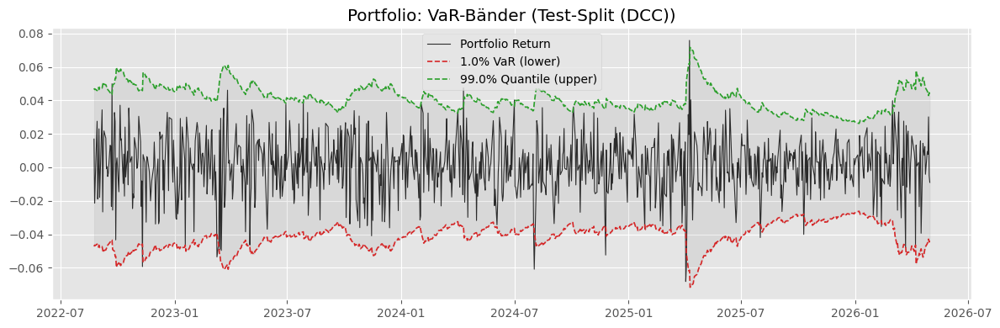

Portfolio hit rate = 1.514% (target 1.000%)


In [1013]:
portfolio_test_dcc = make_portfolio_df(idx_dcc, rp_dcc, varp_dcc, volp_dcc)

plot_var(alpha=0.01, lookback=lookback, view="Test-Split (DCC)", portfolio=True, portfolio_df=portfolio_test_dcc)


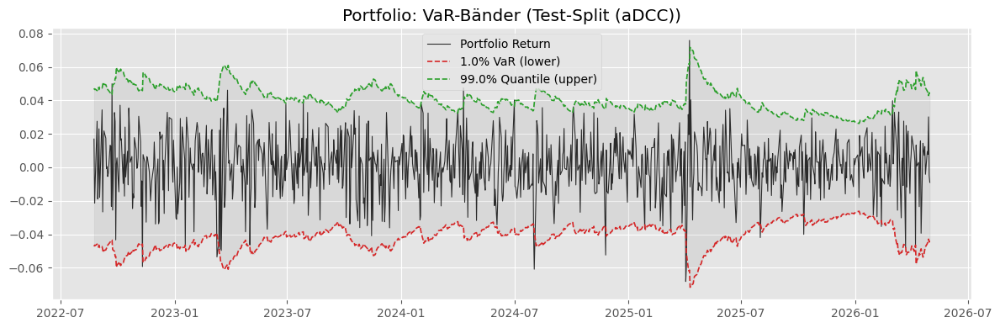

Portfolio hit rate = 1.514% (target 1.000%)


In [1014]:
portfolio_test_adcc = make_portfolio_df(idx_adcc, rp_adcc, varp_adcc, volp_adcc)

plot_var(alpha=0.01, lookback=lookback, view="Test-Split (aDCC)", portfolio=True, portfolio_df=portfolio_test_adcc)


## FHS


In [1015]:
trainval_dcc_path = output_dir / f"dcc_forecasts_fitted_train_val_dcc_{RUN_ID}.csv"
trainval_adcc_path = output_dir / f"dcc_forecasts_fitted_train_val_adcc_{RUN_ID}.csv"

_, H_dcc_trainval = load_covariances(trainval_dcc_path, d=len(macro_tickers), model_label="DCC train+val")
_, H_adcc_trainval = load_covariances(trainval_adcc_path, d=len(macro_tickers), model_label="aDCC train+val")


In [1016]:
train_val_returns_df = pd.concat(
    [train_df[macro_tickers], val_df[macro_tickers]],
    axis=0,
)

idx_dcc_hist, rp_dcc_hist, varp_dcc_hist, volp_dcc_hist = calc_portfolio_variance(
    train_val_returns_df,
    H_dcc_trainval,
    macro_tickers,
    0,
    w_np,
)

idx_adcc_hist, rp_adcc_hist, varp_adcc_hist, volp_adcc_hist = calc_portfolio_variance(
    train_val_returns_df,
    H_adcc_trainval,
    macro_tickers,
    0,
    w_np,
)

portfolio_hist_dcc = make_portfolio_df(idx_dcc_hist, rp_dcc_hist, varp_dcc_hist, volp_dcc_hist)
portfolio_hist_adcc = make_portfolio_df(idx_adcc_hist, rp_adcc_hist, varp_adcc_hist, volp_adcc_hist)


In [1017]:
z_hist_dcc = portfolio_hist_dcc["r_p"].values / np.clip(
    portfolio_hist_dcc["vol_p"].values,
    1e-12,
    None,
)

z_hist_adcc = portfolio_hist_adcc["r_p"].values / np.clip(
    portfolio_hist_adcc["vol_p"].values,
    1e-12,
    None,
)

var_fhs_test_dcc, es_fhs_test_dcc, hits_test_dcc = fhs_var_es(
    z_hist_init=z_hist_dcc,
    r_oos=portfolio_test_dcc["r_p"].values,
    vol_oos=portfolio_test_dcc["vol_p"].values,
    alpha=alpha,
    window=window,
)

var_fhs_test_adcc, es_fhs_test_adcc, hits_test_adcc = fhs_var_es(
    z_hist_init=z_hist_adcc,
    r_oos=portfolio_test_adcc["r_p"].values,
    vol_oos=portfolio_test_adcc["vol_p"].values,
    alpha=alpha,
    window=window,
)

print("DCC hit rate:", hits_test_dcc.mean())
print("aDCC hit rate:", hits_test_adcc.mean())


DCC hit rate: 0.014054054054054054
aDCC hit rate: 0.014054054054054054


## Backtest


In [1018]:
results_dcc = run_backtest_suite(
    returns=portfolio_test_dcc["r_p"].values,
    var=var_fhs_test_dcc,
    es=es_fhs_test_dcc,
    alpha=alpha,
    volatility=portfolio_test_dcc["vol_p"].values,
)

results_dcc


{'meta': {'alpha': 0.01, 'n_obs': 925},
 'var': {'kupiec': {'test': 'kupiec_uc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 13,
   'expected_exceptions': 9.25,
   'hit_rate': 0.014054054054054054,
   'lr_uc': 1.363848224070864,
   'p_value': 0.2428716626058993},
  'christoffersen': {'test': 'christoffersen_cc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 13,
   'hit_rate': 0.014054054054054054,
   'transition_counts': {'n00': 900, 'n01': 11, 'n10': 11, 'n11': 2},
   'transition_probs': {'pi_01': 0.012074643249176729,
    'pi_11': 0.15384615384615385,
    'pi_pooled': 0.01406926406926407},
   'lr_ind': 6.478778899671823,
   'p_value_ind': 0.01091699580150539,
   'lr_uc': 1.363848224070864,
   'lr_cc': 7.8426271237426874,
   'p_value_cc': 0.0198150493486927},
  'dq': {'test': 'dynamic_quantile',
   'implementation': 'segMGarch::DQtest',
   'alpha': 0.01,
   'var_level': 0.99,
   'n_obs': 921,
   'n_exceptions': 13,
   'expected_exceptions': 9.21,
   'hit_rate': 0.014

In [1019]:
results_adcc = run_backtest_suite(
    returns=portfolio_test_adcc["r_p"].values,
    var=var_fhs_test_adcc,
    es=es_fhs_test_adcc,
    alpha=alpha,
    volatility=portfolio_test_adcc["vol_p"].values,
)

results_adcc


{'meta': {'alpha': 0.01, 'n_obs': 925},
 'var': {'kupiec': {'test': 'kupiec_uc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 13,
   'expected_exceptions': 9.25,
   'hit_rate': 0.014054054054054054,
   'lr_uc': 1.363848224070864,
   'p_value': 0.2428716626058993},
  'christoffersen': {'test': 'christoffersen_cc',
   'alpha': 0.01,
   'n_obs': 925,
   'n_exceptions': 13,
   'hit_rate': 0.014054054054054054,
   'transition_counts': {'n00': 900, 'n01': 11, 'n10': 11, 'n11': 2},
   'transition_probs': {'pi_01': 0.012074643249176729,
    'pi_11': 0.15384615384615385,
    'pi_pooled': 0.01406926406926407},
   'lr_ind': 6.478778899671823,
   'p_value_ind': 0.01091699580150539,
   'lr_uc': 1.363848224070864,
   'lr_cc': 7.8426271237426874,
   'p_value_cc': 0.0198150493486927},
  'dq': {'test': 'dynamic_quantile',
   'implementation': 'segMGarch::DQtest',
   'alpha': 0.01,
   'var_level': 0.99,
   'n_obs': 921,
   'n_exceptions': 13,
   'expected_exceptions': 9.21,
   'hit_rate': 0.014

# Forecast Comparison


Forecast comparison: FZ loss plus Harvey-Leybourne-Newbold modified DM test are implemented in Python.


In [1020]:
forecast_comparison_inputs = {
    "lstm_normal": {
        "returns": portfolio_test["r_p"].values,
        "var": var_fhs_test,
        "es": es_fhs_test,
    },
    "lstm_student": {
        "returns": portfolio_test_t["r_p"].values,
        "var": var_fhs_test_t,
        "es": es_fhs_test_t,
    },
    "gru_normal": {
        "returns": portfolio_test_gru["r_p"].values,
        "var": var_fhs_test_gru,
        "es": es_fhs_test_gru,
    },
    "gru_student": {
        "returns": portfolio_test_gru_t["r_p"].values,
        "var": var_fhs_test_gru_t,
        "es": es_fhs_test_gru_t,
    },
    "bekk_lstm_scalar": {
        "returns": portfolio_test_bekk["r_p"].values,
        "var": var_fhs_test_bekk,
        "es": es_fhs_test_bekk,
    },
    "bekk_lstm_vector": {
        "returns": portfolio_test_bekk_vec["r_p"].values,
        "var": var_fhs_test_bekk_vec,
        "es": es_fhs_test_bekk_vec,
    },
    "bekk_lstm_mix": {
        "returns": portfolio_test_bekk_mix["r_p"].values,
        "var": var_fhs_test_bekk_mix,
        "es": es_fhs_test_bekk_mix,
    },
    "neural_bekk_asym_diag": {
        "returns": portfolio_test_neural_bekk["r_p"].values,
        "var": var_fhs_test_neural_bekk,
        "es": es_fhs_test_neural_bekk,
    },
    "bekk_symmetric": {
        "returns": portfolio_test_bekk_sym["r_p"].values,
        "var": var_fhs_test_bekk_sym,
        "es": es_fhs_test_bekk_sym,
    },
    "bekk_asymmetric": {
        "returns": portfolio_test_bekk_asym["r_p"].values,
        "var": var_fhs_test_bekk_asym,
        "es": es_fhs_test_bekk_asym,
    },
    "dcc": {
        "returns": portfolio_test_dcc["r_p"].values,
        "var": var_fhs_test_dcc,
        "es": es_fhs_test_dcc,
    },
    "adcc": {
        "returns": portfolio_test_adcc["r_p"].values,
        "var": var_fhs_test_adcc,
        "es": es_fhs_test_adcc,
    },
}

dm_comparisons = run_fz_dm_comparison_plan(
    model_forecasts=forecast_comparison_inputs,
    alpha=alpha,
    benchmark="bekk_symmetric",
    structured_pairs=(),
    include_pairwise=False,
)

dm_benchmark_comparisons = dm_comparisons["benchmark"]
dm_benchmark_comparisons


{'lstm_normal_vs_bekk_symmetric': {'test': 'fz_modified_diebold_mariano',
  'implementation': 'python_fz_loss + python_hln_modified_dm',
  'alternative': 'two-sided',
  'h': 1,
  'cl': 0.05,
  'n_obs': 925,
  'df': 924,
  'mean_loss_differential': 0.006059571693248829,
  'long_run_variance': 2.1979757720372612,
  'dm_stat': 0.12430864829266453,
  'hln_correction': 0.9994593132883994,
  'modified_dm_stat': 0.12424143625839565,
  'stat': 0.12424143625839565,
  'p_value': 0.9011511368806517,
  'pval': 0.9011511368806517,
  'reject': False,
  'rej': False,
  'loss_differential': 'loss_model_1_minus_loss_model_2',
  'loss_function': 'fissler_ziegel_patton_ziegel_chen',
  'dm_implementation': 'python_harvey_leybourne_newbold_1997',
  'alpha': 0.01,
  'model_1': 'lstm_normal',
  'model_2': 'bekk_symmetric',
  'mean_loss_model_1': -2.840059863932361,
  'mean_loss_model_2': -2.84611943562561,
  'preferred_by_mean_loss': 'bekk_symmetric'},
 'lstm_student_vs_bekk_symmetric': {'test': 'fz_modified

In [ ]:
mcs_model_names, mcs_loss_matrix = build_fz_loss_matrix(
    model_forecasts=forecast_comparison_inputs,
    alpha=alpha,
)
mcs_fz_losses = pd.DataFrame(mcs_loss_matrix, columns=mcs_model_names)
mcs_fz_loss_path = run_dir / "fz_loss_matrix.csv"
mcs_fz_losses.to_csv(mcs_fz_loss_path, index=False)

mcs_fz_loss_summary = (
    mcs_fz_losses.mean()
    .rename("mean_fz_loss")
    .sort_values()
    .reset_index()
    .rename(columns={"index": "model"})
)
mcs_fz_loss_summary["rank"] = np.arange(1, len(mcs_fz_loss_summary) + 1)
mcs_fz_loss_summary_path = run_dir / "fz_loss_summary.csv"
mcs_fz_loss_summary.to_csv(mcs_fz_loss_summary_path, index=False)

mcs_fz_loss_summary


# Save all Backtests

In [1021]:
all_backtest_results = {
    "lstm_normal": results_lstm_normal,
    "lstm_student": results_lstm_student,
    "gru_normal": results_gru_normal,
    "gru_student": results_gru_student,
    "bekk_lstm_vector": results_bekk_vec,
    "bekk_lstm_scalar": results_bekk_scalar,
    "bekk_lstm_mix": results_bekk_mix,
    "neural_bekk_asym_diag": results_neural_bekk_asym_diag,
    "bekk_symmetric": results_bekk_sym,
    "bekk_asymmetric": results_bekk_asym,
    "dcc": results_dcc,
    "adcc": results_adcc,
    "forecast_comparison": dm_comparisons,
    "neural_bekk_artifacts": {
        "test_params_csv": str(neural_bekk_param_path),
        "test_param_sequences_npz": str(neural_bekk_param_npz_path),
    },
    "mcs_input": {
        "loss_function": "fissler_ziegel_patton_ziegel_chen",
        "loss_matrix_csv": str(mcs_fz_loss_path),
        "loss_summary_csv": str(mcs_fz_loss_summary_path),
        "n_obs": int(len(mcs_fz_losses)),
        "models": list(mcs_model_names),
        "mean_fz_loss": {
            row["model"]: float(row["mean_fz_loss"])
            for _, row in mcs_fz_loss_summary.iterrows()
        },
    },
}


In [1022]:
result_save = run_dir / "all_backtest_results.json"

with open(result_save, "w", encoding="utf-8") as f:
    json.dump(all_backtest_results, f, indent=2)

# Leptokurtosis

In [1023]:
# Descriptive statistics: mean, std, skewness, excess kurtosis
# fuer alle Einzelserien + Equal-Weight-Portfolio

portfolio_eqw = pd.Series(
    logret[macro_tickers].to_numpy() @ w_np,
    index=logret.index,
    name="portfolio_eqw"
)

desc_stats = pd.concat(
    [
        logret[macro_tickers],
        portfolio_eqw,
    ],
    axis=1,
)

summary_table = pd.DataFrame({
    "mean": desc_stats.mean(),
    "std": desc_stats.std(),
    "skew": desc_stats.skew(),
    "excess_kurtosis": desc_stats.kurt(),
})

summary_table["raw_kurtosis"] = summary_table["excess_kurtosis"] + 3
summary_table["leptokurtic"] = summary_table["excess_kurtosis"] > 0

summary_table = summary_table.round(4)
summary_table

,mean,std,skew,excess_kurtosis,raw_kurtosis,leptokurtic
^GSPC,0.0003,0.0121,-0.3526,11.0059,14.0059,True
GC=F,0.0004,0.0112,-0.4841,6.8960,9.8960,True
CL=F,0.0003,0.0262,-0.0918,15.7559,18.7559,True
^TNX,-0.0002,0.0579,0.0358,2.3020,5.3020,True
portfolio_eqw,0.0002,0.0181,-0.2171,3.5268,6.5268,True


$r_t \sim N(0, \Sigma_t)$ ist damit empirisch nicht haltbar.

- ich brauche noch minimum & maximum return

In [1024]:
thesis_table = summary_table[["mean", "std", "skew", "excess_kurtosis"]].round(4)
thesis_table

,mean,std,skew,excess_kurtosis
^GSPC,0.0003,0.0121,-0.3526,11.0059
GC=F,0.0004,0.0112,-0.4841,6.8960
CL=F,0.0003,0.0262,-0.0918,15.7559
^TNX,-0.0002,0.0579,0.0358,2.3020
portfolio_eqw,0.0002,0.0181,-0.2171,3.5268


In [1025]:
print(thesis_table.to_latex(float_format="%.4f"))

\begin{tabular}{lrrrr}
\toprule
 & mean & std & skew & excess_kurtosis \\
\midrule
^GSPC & 0.0003 & 0.0121 & -0.3526 & 11.0059 \\
GC=F & 0.0004 & 0.0112 & -0.4841 & 6.8960 \\
CL=F & 0.0003 & 0.0262 & -0.0918 & 15.7559 \\
^TNX & -0.0002 & 0.0579 & 0.0358 & 2.3020 \\
portfolio_eqw & 0.0002 & 0.0181 & -0.2171 & 3.5268 \\
\bottomrule
\end{tabular}



# Notebook export als raw Code

In [1026]:
!jupyter nbconvert --to script run_models.ipynb --output run_models_code_only

[NbConvertApp] Converting notebook run_models.ipynb to script
[NbConvertApp] Writing 77000 bytes to run_models_code_only.py
